In [20]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 1 — Setup, Imports, and Global Configuration                              ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

!pip install -q timm einops albumentations opencv-python-headless

import os, time, random, copy, warnings
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from tqdm.auto import tqdm
from scipy.ndimage import zoom

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.cuda.amp import GradScaler, autocast
import torchvision.models as models

import albumentations as A
from albumentations.pytorch import ToTensorV2
from einops import rearrange

from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, roc_curve, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True 

warnings.filterwarnings('ignore')

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True; torch.backends.cudnn.benchmark = False

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
OUTDIR = Path('/kaggle/working')
CKDIR = OUTDIR / 'checkpoints'
PLTDIR = OUTDIR / 'plots'
for d in [CKDIR, PLTDIR]: d.mkdir(exist_ok=True)

MEAN = (0.485, 0.456, 0.406)
STD = (0.229, 0.224, 0.225)
VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}
print(f"✅ Setup complete on {DEVICE}")

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 2 — Hyperparameters (Adapted for Binary X-Ray TB)                        ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

HPARAMS = {
    'img_size': 224, 
    'batch_size': 32, 
    'num_epochs': 40,       # X-rays converge faster than MRIs
    'lr_backbone': 1e-5, 
    'lr_head': 1e-4, 
    'weight_decay': 1e-4,
    'warmup_epochs': 5, 
    'freeze_epochs': 7, 
    'patience': 8,
    'aug_level': 'medium', 
    'd_model': 384, 
    'nhead': 6, 
    'n_layers': 4, 
    'dim_ffn': 1536,
    'head_dropout': 0.3, 
    'label_smoothing': 0.05, # Less smoothing for binary
    'mixup_alpha': 0.2, 
    'cutmix_alpha': 1.0,
    'use_mixup': True, 
    'use_cutmix': True, 
    'mixup_prob': 0.3, 
    'backbone': 'convnext_base',
    'num_classes': 2,       # ✅ BINARY CLASSIFICATION
    'class_names': ['Normal', 'Tuberculosis'] # ✅ TB CLASSES
}
print("✅ Hyperparameters ready (Binary X-Ray)")

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 3 & 4 — X-Ray Augmentations (Safe for chest anatomy)                    ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def get_xray_transforms(split, img_size=224, level='medium'):
    norm = [A.Normalize(mean=MEAN, std=STD), ToTensorV2()]
    if split != 'train': 
        return A.Compose([A.Resize(height=img_size, width=img_size)] + norm)
    
    # X-rays are standardized. Avoid heavy rotations/elastic transforms that fake anatomy.
    base = [
        A.Resize(height=img_size, width=img_size),
        A.HorizontalFlip(p=0.5),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=5, p=0.5, border_mode=cv2.BORDER_CONSTANT, value=0),
    ]
    light_med = [
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
        A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
        A.GaussianBlur(blur_limit=(3, 5), p=0.2),
        A.CLAHE(clip_limit=2.0, tile_grid_size=(8, 8), p=0.3) # ✅ Great for X-ray contrast
    ]
    
    return A.Compose(base + light_med + norm)

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 5 & 6 — Loss & Model Architecture (Binary Safe)                          ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

class SmoothCELoss(nn.Module):
    def __init__(self, label_smoothing=0.05):
        super().__init__()
        self.criterion = nn.CrossEntropyLoss(label_smoothing=label_smoothing)
    def forward(self, inputs, targets): return self.criterion(inputs, targets)

class DropPath(nn.Module):
    def __init__(self, drop_prob=0.0): super().__init__(); self.drop_prob = drop_prob
    def forward(self, x):
        if self.drop_prob == 0.0 or not self.training: return x
        keep_prob = float(1.0 - self.drop_prob)
        return x * (torch.rand((x.shape[0], 1, 1), dtype=torch.float32, device=x.device) * keep_prob)

class WindowAttention(nn.Module):
    def __init__(self, d_model, nhead, window_size=7, dropout=0.1):
        super().__init__()
        self.nhead, self.window_size, self.head_dim = nhead, window_size, d_model // nhead
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(d_model, d_model * 3); self.proj = nn.Linear(d_model, d_model)
        self.attn_drop, self.proj_drop, self.attn_weights = nn.Dropout(dropout), nn.Dropout(dropout), None
    def forward(self, x, H, W):
        B, N, C = x.shape; x = x.reshape(B, H, W, C)
        pad_h, pad_w = (self.window_size - H % self.window_size) % self.window_size, (self.window_size - W % self.window_size) % self.window_size
        if pad_h > 0 or pad_w > 0: x = F.pad(x, (0, 0, 0, pad_w, 0, pad_h))
        Hp, Wp = x.shape[1], x.shape[2]
        x = x.reshape(B, Hp//self.window_size, self.window_size, Wp//self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(-1, self.window_size**2, C)
        qkv = self.qkv(x).reshape(-1, self.window_size**2, 3, self.nhead, self.head_dim).permute(2,0,3,1,4)
        attn = (qkv[0] @ qkv[1].transpose(-2,-1)) * self.scale; attn = attn.softmax(dim=-1); self.attn_weights = attn.detach()
        x = self.proj_drop(self.proj((self.attn_drop(attn) @ qkv[2]).transpose(1,2).reshape(-1, self.window_size**2, C)))
        x = x.reshape(B, Hp//self.window_size, Wp//self.window_size, self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(B, Hp, Wp, C)
        return x[:, :H, :W, :].reshape(B, -1, C) if pad_h > 0 or pad_w > 0 else x.reshape(B, -1, C)

class TransformerBlockWithWindow(nn.Module):
    def __init__(self, d_model, nhead, ffn_dim, window_size=7, attn_drop=0.1, ffn_drop=0.1, drop_path=0.0):
        super().__init__()
        self.norm1, self.norm2 = nn.LayerNorm(d_model), nn.LayerNorm(d_model)
        self.global_attn = nn.MultiheadAttention(d_model, nhead, dropout=attn_drop, batch_first=True)
        self.window_attn = WindowAttention(d_model, nhead, window_size, attn_drop)
        self.gate = nn.Sequential(nn.Linear(d_model*2, d_model), nn.Sigmoid())
        self.ffn = nn.Sequential(nn.Linear(d_model, ffn_dim), nn.GELU(), nn.Dropout(ffn_drop), nn.Linear(ffn_dim, d_model), nn.Dropout(ffn_drop))
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.attn_weights, self.window_attn_weights = None, None
    def forward(self, x, H, W):
        x_norm = self.norm1(x)
        global_out, global_attn = self.global_attn(x_norm, x_norm, x_norm, need_weights=True)
        self.attn_weights = global_attn.detach()
        window_out = self.window_attn(x_norm[:, 1:, :], H, W); self.window_attn_weights = self.window_attn.attn_weights
        gate = self.gate(torch.cat([global_out[:, 1:, :], window_out], dim=-1))
        combined = torch.cat([global_out[:, :1, :], gate * global_out[:, 1:, :] + (1-gate) * window_out], dim=1)
        x = x + self.drop_path(combined)
        return x + self.drop_path(self.ffn(self.norm2(x)))

class ImprovedBackbone(nn.Module):
    def __init__(self): super().__init__(); self.backbone = models.convnext_base(weights=None); self.feature_extractor = self.backbone.features
    def forward(self, x): return self.feature_extractor(x)

class EnhancedHViT(nn.Module):
    def __init__(self, num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536):
        super().__init__(); self.d_model = d_model; self.img_size = img_size; self.backbone = ImprovedBackbone()
        with torch.no_grad(): _, c, h, w = self.backbone(torch.zeros(1, 3, img_size, img_size)).shape
        self.spatial_h, self.spatial_w = h, w
        self.proj = nn.Sequential(nn.Conv2d(c, d_model, 1, bias=False), nn.BatchNorm2d(d_model), nn.GELU(), nn.Conv2d(d_model, d_model, 3, padding=1, bias=False), nn.BatchNorm2d(d_model), nn.GELU())
        self.norm_proj = nn.LayerNorm(d_model); self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, h*w + 1, d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02); nn.init.trunc_normal_(self.pos_embed, std=0.02)
        dpr = [x.item() for x in torch.linspace(0, 0.15, n_layers)]
        self.encoder = nn.ModuleList([TransformerBlockWithWindow(d_model, nhead, dim_ffn, min(7, h, w), drop_path=dpr[i]) for i in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(nn.LayerNorm(d_model), nn.Linear(d_model, d_model//2), nn.GELU(), nn.Dropout(0.3), nn.Linear(d_model//2, d_model//4), nn.GELU(), nn.Dropout(0.15), nn.Linear(d_model//4, num_classes))
    def forward(self, x):
        B = x.size(0); tokens = rearrange(self.proj(self.backbone(x)), 'b d h w -> b (h w) d')
        tokens = self.norm_proj(tokens); tokens = torch.cat([self.cls_token.expand(B,-1,-1), tokens], dim=1) + self.pos_embed
        for block in self.encoder: tokens = block(tokens, self.spatial_h, self.spatial_w)
        return self.head(self.norm(tokens)[:, 0])
    def get_attentions(self):
        g, w = [], []
        for b in self.encoder:
            if b.attn_weights is not None: g.append(b.attn_weights)
            if b.window_attn_weights is not None: w.append(b.window_attn_weights)
        return g, w
    def unfreeze_backbone_partial(self, n=3):
        for p in self.backbone.feature_extractor.parameters(): p.requires_grad_(False)
        for child in list(self.backbone.feature_extractor.children())[-n:]:
            for p in child.parameters(): p.requires_grad_(True)

print("✅ Model Architecture ready (Binary X-Ray Output)")

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 7, 8, 9 — Data Loader, Mixup, Trainer                                 ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

class XRayDataset(Dataset):
    def __init__(self, samples, class_names, transform=None):
        self.samples, self.transform, self.class_names = samples, transform, class_names
        self.class_to_idx = {n:i for i,n in enumerate(class_names)}
    def __len__(self): return len(self.samples)
    def __getitem__(self, idx):
        p, l = self.samples[idx]; l = self.class_to_idx.get(l, l)
        
        # ✅ Read as Grayscale
        img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
        if img is None: img = np.array(Image.open(p).convert('L'))
        
        # ✅ Convert 1-channel to 3-channel for ConvNeXt
        img = np.stack([img, img, img], axis=-1)
        
        if self.transform: img = self.transform(image=img)['image']
        return img.float(), l
        
    def class_weights(self):
        labels = [self.class_to_idx.get(l, l) for _, l in self.samples]
        counts = torch.bincount(torch.tensor(labels), minlength=len(self.class_names)).float()
        beta=0.9999; effective_num = 1.0 - torch.pow(beta, counts)
        return ((1.0 - beta) / (effective_num + 1e-8)) / len(self.class_names) * len(self.class_names)

def load_tb_xray():
    samples, class_names = [], HPARAMS['class_names']
    # ✅ Standard path for this specific Kaggle dataset
    base = Path('/kaggle/input/datasets/nikitachaulagain/dataasets/Tuberculosis (TB) Chest X-ray Database/Tuberculosis (TB) Chest X-ray Database/TB_Chest_Radiography_Database')
    
    if not base.exists():
        print("❌ Dataset not found! Please add the dataset to your notebook.")
        return [], class_names
        
    for folder in base.iterdir():
        if not folder.is_dir(): continue
        fn = folder.name.lower()
        if 'normal' in fn or 'tb_normal' in fn: cname = 'Normal'
        elif 'tb' in fn or 'tuberculosis' in fn or 'Tuberculosis' in fn: cname = 'Tuberculosis'
        else: continue
        
        count = 0
        for ext in VALID_EXTS:
            for p in folder.rglob(f'*{ext}'):
                samples.append((str(p), cname)); count += 1
        if count > 0: print(f"   {cname}: {count} images")
            
    return samples, class_names

def mixup_data(x, y, alpha=0.2):
    lam = np.random.beta(alpha, alpha); idx = torch.randperm(x.size(0)).to(x.device)
    return lam*x + (1-lam)*x[idx], y, y[idx], lam

def cutmix_data(x, y, alpha=1.0):
    lam = np.random.beta(alpha, alpha); idx = torch.randperm(x.size(0)).to(x.device)
    W, H = x.size(2), x.size(3); r = np.sqrt(1.0 - lam); cw, ch = int(W*r), int(H*r)
    cx, cy = np.random.randint(W), np.random.randint(H)
    x1, y1, x2, y2 = np.clip(cx-cw//2,0,W), np.clip(cy-ch//2,0,H), np.clip(cx+cw//2,0,W), np.clip(cy+ch//2,0,H)
    mixed = x.clone(); mixed[:, :, x1:x2, y1:y2] = x[idx, :, x1:x2, y1:y2]
    return mixed, y, y[idx], 1 - (x2-x1)*(y2-y1)/(W*H)

class Trainer:
    def __init__(self, model, loaders, hparams):
        self.model, self.loaders, self.hparams = model, loaders, hparams
        self.criterion = SmoothCELoss(hparams['label_smoothing'])
        bp = [p for n,p in model.named_parameters() if p.requires_grad and 'backbone' in n]
        hp = [p for n,p in model.named_parameters() if p.requires_grad and 'backbone' not in n]
        self.optimizer = optim.AdamW([{'params':bp, 'lr':hparams['lr_backbone']}, {'params':hp, 'lr':hparams['lr_head']}], weight_decay=hparams['weight_decay'])
        self.scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(self.optimizer, T_0=hparams['num_epochs']//3, T_mult=2, eta_min=1e-7)
        self.scaler = GradScaler(); self.history = {k:[] for k in ['train_loss','val_loss','train_acc','val_acc','val_f1','lr']}
        self.best_val_f1, self.best_state, self.patience_counter, self.unfrozen = 0, None, 0, False

    def train_one_epoch(self, epoch):
        self.model.train(); total_loss, preds, labs = 0, [], []
        for images, labels in tqdm(self.loaders['train'], desc=f'Ep {epoch+1}', leave=False):
            images, labels = images.to(DEVICE), labels.to(DEVICE); self.optimizer.zero_grad(set_to_none=True)
            mixed = False
            if np.random.random() < self.hparams['mixup_prob']:
                if np.random.random() < 0.5: images, la, lb, lam = mixup_data(images, labels, self.hparams['mixup_alpha']); mixed=True
                else: images, la, lb, lam = cutmix_data(images, labels, self.hparams['cutmix_alpha']); mixed=True
            with autocast():
                out = self.model(images); loss = (lam*self.criterion(out, la) + (1-lam)*self.criterion(out, lb)) if mixed else self.criterion(out, labels)
            self.scaler.scale(loss).backward(); self.scaler.unscale_(self.optimizer)
            torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
            self.scaler.step(self.optimizer); self.scaler.update(); total_loss += loss.item()
            if not mixed: preds.extend(out.argmax(1).cpu().numpy()); labs.extend(labels.cpu().numpy())
        return total_loss/len(self.loaders['train']), accuracy_score(labs, preds) if labs else 0, f1_score(labs, preds, average='binary', zero_division=0) if labs else 0

    @torch.no_grad()
    def validate(self, loader):
        self.model.eval(); total_loss, preds, labs, probs = 0, [], [], []
        for images, labels in tqdm(loader, desc='Val', leave=False):
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            with autocast():
                out = self.model(images); loss = self.criterion(out, labels)
            total_loss += loss.item()
            p = F.softmax(out, dim=1); preds.extend(out.argmax(1).cpu().numpy()); labs.extend(labels.cpu().numpy()); probs.extend(p.cpu().numpy())
        return total_loss/len(loader), accuracy_score(labs, preds), f1_score(labs, preds, average='binary', zero_division=0), 0, preds, labs, probs

    def train(self):
        for epoch in range(self.hparams['num_epochs']):
            if epoch == self.hparams['freeze_epochs'] and not self.unfrozen:
                print("\n🔄 Unfreezing backbone"); self.model.unfreeze_backbone_partial(3); self.unfrozen=True
            tl, ta, tf = self.train_one_epoch(epoch)
            vl, va, vf, _, _, _, _ = self.validate(self.loaders['val'])
            self.scheduler.step()
            self.history['train_loss'].append(tl); self.history['val_loss'].append(vl)
            self.history['train_acc'].append(ta); self.history['val_acc'].append(va)
            self.history['val_f1'].append(vf); self.history['lr'].append(self.optimizer.param_groups[0]['lr'])
            print(f"Ep {epoch+1}: T_Acc={ta:.3f} | V_Acc={va:.3f} V_F1={vf:.3f}")
            if vf > self.best_val_f1:
                self.best_val_f1 = vf; self.best_state = copy.deepcopy(self.model.state_dict()); self.patience_counter=0
                torch.save({'model': self.model.state_dict(), 'f1':vf, 'acc':va}, CKDIR/'best_model.pth')
            else:
                self.patience_counter += 1
                if self.patience_counter >= self.hparams['patience']: print("⏹️ Early stopping"); break
        return self.history

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 10 — Main Execution (FIXED)                                              ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def main():
    print("📦 Loading TB X-Ray Dataset...")
    samples, class_names = load_tb_xray()
    if not samples: return
    
    labels = [class_names.index(l) for l in [s[1] for s in samples]]
    train_s, temp_s = train_test_split(samples, test_size=0.3, stratify=labels, random_state=42)
    val_s, test_s = train_test_split(temp_s, test_size=0.5, stratify=[class_names.index(l) for l in [s[1] for s in temp_s]], random_state=42)
    
    train_ds = XRayDataset(train_s, class_names, get_xray_transforms('train', 224, 'medium'))
    val_ds = XRayDataset(val_s, class_names, get_xray_transforms('val', 224))
    test_ds = XRayDataset(test_s, class_names, get_xray_transforms('test', 224))
    
    # ✅ CRITICAL: Weighted sampler handles the Normal vs TB imbalance
    sw = [train_ds.class_weights()[class_names.index(l)] for _, l in train_s]
    loaders = {
        'train': DataLoader(train_ds, batch_size=32, sampler=WeightedRandomSampler(sw, len(sw), replacement=True), num_workers=4, pin_memory=True, persistent_workers=True),
        'val': DataLoader(val_ds, batch_size=32, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True),
        'test': DataLoader(test_ds, batch_size=32, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True)
    }
    
    print("\n🏗️ Building Binary X-Ray Model...")
    model = EnhancedHViT(num_classes=2).to(DEVICE)
    trainer = Trainer(model, loaders, HPARAMS)
    history = trainer.train()
    
    print("\n📊 Final Evaluation...")
    model.load_state_dict(torch.load(CKDIR/'best_model.pth', map_location=DEVICE, weights_only=False)['model'])
    model.eval(); all_p, all_l, all_pr = [], [], []
    with torch.no_grad():
        for im, l in tqdm(loaders['test'], desc='Final Test'):
            out = model(im.to(DEVICE)); p = F.softmax(out, dim=1)
            all_p.append(out.argmax(1).cpu().numpy()); all_l.append(l.numpy()); all_pr.append(p.cpu().numpy())
    
    # ✅ FIX: Convert lists to proper 2D numpy arrays before slicing
    all_p = np.concatenate(all_p, axis=0)
    all_l = np.concatenate(all_l, axis=0)
    all_pr = np.concatenate(all_pr, axis=0)

    test_acc = accuracy_score(all_l, all_p)
    test_f1 = f1_score(all_l, all_p, average='binary')
    test_auc = roc_auc_score(all_l, all_pr[:, 1])
    cm = confusion_matrix(all_l, all_p)

    print(f"\n🎯 FINAL TEST -> Acc: {test_acc:.4f}, F1: {test_f1:.4f}, AUC: {test_auc:.4f}")
    print(classification_report(all_l, all_p, target_names=['Normal', 'Tuberculosis']))

if __name__ == '__main__':
    main()

✅ Setup complete on cuda
✅ Hyperparameters ready (Binary X-Ray)
✅ Model Architecture ready (Binary X-Ray Output)
📦 Loading TB X-Ray Dataset...
   Tuberculosis: 700 images
   Normal: 3500 images

🏗️ Building Binary X-Ray Model...


Ep 1:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 1: T_Acc=0.781 | V_Acc=0.829 V_F1=0.630


Ep 2:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 2: T_Acc=0.847 | V_Acc=0.903 V_F1=0.747


Ep 3:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 3: T_Acc=0.886 | V_Acc=0.892 V_F1=0.736


Ep 4:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 4: T_Acc=0.894 | V_Acc=0.951 V_F1=0.853


Ep 5:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 5: T_Acc=0.912 | V_Acc=0.956 V_F1=0.867


Ep 6:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 6: T_Acc=0.913 | V_Acc=0.963 V_F1=0.889


Ep 7:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 7: T_Acc=0.918 | V_Acc=0.940 V_F1=0.839

🔄 Unfreezing backbone


Ep 8:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 8: T_Acc=0.922 | V_Acc=0.967 V_F1=0.898


Ep 9:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 9: T_Acc=0.927 | V_Acc=0.967 V_F1=0.898


Ep 10:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 10: T_Acc=0.925 | V_Acc=0.968 V_F1=0.902


Ep 11:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 11: T_Acc=0.933 | V_Acc=0.965 V_F1=0.901


Ep 12:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 12: T_Acc=0.939 | V_Acc=0.975 V_F1=0.924


Ep 13:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 13: T_Acc=0.935 | V_Acc=0.973 V_F1=0.919


Ep 14:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 14: T_Acc=0.914 | V_Acc=0.973 V_F1=0.922


Ep 15:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 15: T_Acc=0.920 | V_Acc=0.962 V_F1=0.881


Ep 16:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 16: T_Acc=0.919 | V_Acc=0.965 V_F1=0.891


Ep 17:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 17: T_Acc=0.913 | V_Acc=0.970 V_F1=0.911


Ep 18:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 18: T_Acc=0.923 | V_Acc=0.970 V_F1=0.907


Ep 19:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 19: T_Acc=0.924 | V_Acc=0.976 V_F1=0.928


Ep 20:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 20: T_Acc=0.914 | V_Acc=0.949 V_F1=0.855


Ep 21:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 21: T_Acc=0.937 | V_Acc=0.952 V_F1=0.864


Ep 22:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 22: T_Acc=0.936 | V_Acc=0.968 V_F1=0.906


Ep 23:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 23: T_Acc=0.943 | V_Acc=0.944 V_F1=0.850


Ep 24:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 24: T_Acc=0.930 | V_Acc=0.962 V_F1=0.893


Ep 25:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 25: T_Acc=0.941 | V_Acc=0.963 V_F1=0.892


Ep 26:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 26: T_Acc=0.950 | V_Acc=0.967 V_F1=0.905


Ep 27:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 27: T_Acc=0.953 | V_Acc=0.978 V_F1=0.931


Ep 28:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 28: T_Acc=0.953 | V_Acc=0.973 V_F1=0.920


Ep 29:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 29: T_Acc=0.949 | V_Acc=0.976 V_F1=0.932


Ep 30:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 30: T_Acc=0.960 | V_Acc=0.979 V_F1=0.937


Ep 31:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 31: T_Acc=0.957 | V_Acc=0.979 V_F1=0.939


Ep 32:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 32: T_Acc=0.951 | V_Acc=0.975 V_F1=0.926


Ep 33:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 33: T_Acc=0.962 | V_Acc=0.970 V_F1=0.913


Ep 34:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 34: T_Acc=0.951 | V_Acc=0.979 V_F1=0.938


Ep 35:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 35: T_Acc=0.963 | V_Acc=0.981 V_F1=0.943


Ep 36:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 36: T_Acc=0.960 | V_Acc=0.979 V_F1=0.938


Ep 37:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 37: T_Acc=0.960 | V_Acc=0.983 V_F1=0.948


Ep 38:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 38: T_Acc=0.956 | V_Acc=0.984 V_F1=0.952


Ep 39:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 39: T_Acc=0.963 | V_Acc=0.983 V_F1=0.948


Ep 40:   0%|          | 0/92 [00:00<?, ?it/s]

Val:   0%|          | 0/20 [00:00<?, ?it/s]

Ep 40: T_Acc=0.948 | V_Acc=0.962 V_F1=0.892

📊 Final Evaluation...


Final Test:   0%|          | 0/20 [00:00<?, ?it/s]


🎯 FINAL TEST -> Acc: 0.9698, F1: 0.9116, AUC: 0.9940
              precision    recall  f1-score   support

      Normal       0.99      0.98      0.98       525
Tuberculosis       0.89      0.93      0.91       105

    accuracy                           0.97       630
   macro avg       0.94      0.96      0.95       630
weighted avg       0.97      0.97      0.97       630



In [21]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 13 — Upload Image & Predict (Interactive) - TB X-ray                     ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import ipywidgets as widgets
from IPython.display import display, clear_output, FileLink
import io
from PIL import Image as PILImage

# ─── LOAD MODEL (TB SPECIFIC) ──────────────────────────────────────────────────
print("📦 Loading TB model from checkpoint...")

# Check if model exists, if not create it
try:
    model
except NameError:
    print("⚠️ Model not found. Creating new model...")
    model = EnhancedHViT(num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536).to(DEVICE)

# Load weights
checkpoint_path = CKDIR / 'best_model.pth'
if checkpoint_path.exists():
    checkpoint = torch.load(checkpoint_path, map_location=DEVICE, weights_only=False)
    model.load_state_dict(checkpoint['model'])
    print(f"✅ Model loaded from: {checkpoint_path}")
else:
    print(f"❌ Checkpoint not found at: {checkpoint_path}")
    print("Please train the TB model first or check the path.")

model.eval()

# ─── SETUP CLASS NAMES (TB SPECIFIC) ──────────────────────────────────────────
CLASS_NAMES = ['Normal', 'Tuberculosis']  # TB classes
IMG_SIZE = 224

def predict_single_image(image_array):
    """Run inference on a single numpy RGB image."""
    # Resize
    img_resized = cv2.resize(image_array, (IMG_SIZE, IMG_SIZE))
    
    # Convert to tensor with normalization
    img_tensor = torch.from_numpy(img_resized).float().permute(2, 0, 1) / 255.0
    img_tensor = (img_tensor - torch.tensor(MEAN).view(3, 1, 1)) / torch.tensor(STD).view(3, 1, 1)
    img_tensor = img_tensor.unsqueeze(0).to(DEVICE)
    
    # Predict
    with torch.no_grad():
        with autocast():
            logits = model(img_tensor)
            probs = F.softmax(logits, dim=1)
            conf, pred_idx = probs.max(dim=1)
    
    return pred_idx.item(), conf.item(), probs.cpu().numpy()[0]

def generate_prediction_plot(image_rgb, pred_idx, confidence, probs):
    """Create a nice prediction visualization for TB X-ray."""
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Left: X-ray with prediction
    axes[0].imshow(image_rgb, cmap='gray')
    color = 'green' if confidence > 0.8 else ('orange' if confidence > 0.5 else 'red')
    
    # Determine status message
    if CLASS_NAMES[pred_idx] == 'Normal':
        status = "✅ NORMAL CHEST X-RAY"
    else:
        status = "⚠️ TUBERCULOSIS DETECTED"
    
    axes[0].set_title(f"{status}\nConfidence: {confidence:.2%}", 
                      fontsize=14, fontweight='bold', color=color)
    axes[0].axis('off')
    
    # Right: Bar chart of all class probabilities
    colors_bar = ['#2ecc71' if i == pred_idx else '#95a5a6' for i in range(len(CLASS_NAMES))]
    bars = axes[1].barh(CLASS_NAMES, probs * 100, color=colors_bar, edgecolor='black', linewidth=0.5)
    axes[1].set_xlabel('Probability (%)', fontsize=12)
    axes[1].set_title('Class Probabilities', fontsize=14, fontweight='bold')
    axes[1].set_xlim(0, 105)
    
    # Add percentage labels on bars
    for bar, prob in zip(bars, probs):
        axes[1].text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, 
                     f'{prob:.1f}%', va='center', fontsize=11, fontweight='bold')
    
    axes[1].grid(axis='x', alpha=0.3)
    plt.tight_layout()
    return fig

# ─── Widget Setup ───────────────────────────────────────────────────────────────

upload_widget = widgets.FileUpload(
    accept='.jpg,.jpeg,.png,.bmp,.tiff,.dcm',
    multiple=False,
    description='📤 Upload Chest X-ray',
    button_style='info',
    style={'button_width': '300px', 'description_width': '200px'}
)

path_input = widgets.Text(
    value='',
    placeholder='/kaggle/input/.../xray.jpg',
    description='📁 Or enter path:',
    layout={'width': '600px'}
)

predict_button = widgets.Button(
    description='🔍 Predict',
    button_style='success',
    layout={'width': '200px'}
)

output_area = widgets.Output()

def on_predict_clicked(b):
    with output_area:
        clear_output(wait=True)
        
        image_rgb = None
        source = ""
        
        # Try file upload first
        if upload_widget.value:
            uploaded_file = list(upload_widget.value.values())[0]
            content = uploaded_file['content']
            image_rgb = np.array(PILImage.open(io.BytesIO(content)).convert('RGB'))
            source = f"Uploaded: {uploaded_file['metadata']['name']}"
        
        # Try path input
        elif path_input.value.strip():
            p = Path(path_input.value.strip())
            if p.exists():
                img = cv2.imread(str(p))
                if img is not None:
                    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    source = f"Path: {p.name}"
            else:
                print(f"❌ File not found: {p}")
                return
        
        else:
            print("⚠️ Please upload an image OR enter a file path")
            return
        
        if image_rgb is None:
            print("❌ Could not read image")
            return
        
        # Run prediction
        print(f"🔮 Analyzing {source}...")
        pred_idx, confidence, probs = predict_single_image(image_rgb)
        
        # Display results
        print(f"\n{'='*50}")
        if CLASS_NAMES[pred_idx] == 'Tuberculosis':
            print(f"   ⚠️  PREDICTION: TUBERCULOSIS DETECTED")
        else:
            print(f"   ✅ PREDICTION: NORMAL")
        print(f"   CONFIDENCE: {confidence:.2%}")
        print(f"{'='*50}")
        print("\nAll probabilities:")
        for name, prob in zip(CLASS_NAMES, probs):
            marker = " ◀" if name == CLASS_NAMES[pred_idx] else ""
            print(f"   {name:15s}: {prob:.4f} ({prob*100:.1f}%){marker}")
        
        # Show plot
        fig = generate_prediction_plot(image_rgb, pred_idx, confidence, probs)
        plt.show()
        
        # Save prediction plot
        pred_path = PLTDIR / f'prediction_{CLASS_NAMES[pred_idx]}_{int(confidence*100)}.png'
        fig.savefig(pred_path, dpi=150, bbox_inches='tight')
        print(f"\n💾 Saved prediction plot to: {pred_path}")

predict_button.on_click(on_predict_clicked)

# Display the interface
print("╔══════════════════════════════════════════════════════════════╗")
print("║        🫁 TB CHEST X-RAY CLASSIFICATION - INFERENCE         ║")
print("╠══════════════════════════════════════════════════════════════╣")
print("║  Upload a chest X-ray image or enter a file path, then      ║")
print("║  click 'Predict' to see the classification result.          ║")
print("╚══════════════════════════════════════════════════════════════╝\n")

display(widgets.VBox([
    upload_widget,
    widgets.Label("── OR ──"),
    path_input,
    widgets.Label(""),
    predict_button,
    widgets.Label(""),
    output_area
]))


# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 14 — Batch Predict on Test Folder (TB)                                    ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def batch_predict_tb(folder_path, save_csv=True):
    """Predict on all images in a folder and optionally save results to CSV."""
    folder = Path(folder_path)
    if not folder.exists():
        print(f"❌ Folder not found: {folder}")
        return None
    
    image_files = []
    for ext in VALID_EXTS:
        image_files.extend(folder.rglob(f'*{ext}'))
    
    if not image_files:
        print(f"❌ No images found in {folder}")
        return None
    
    print(f"📁 Found {len(image_files)} images in {folder}")
    
    results = []
    correct = 0
    total = 0
    
    for img_path in tqdm(image_files, desc='Predicting'):
        # Try to infer true label from folder name
        true_label = None
        parent_name = img_path.parent.name.lower()
        if 'normal' in parent_name:
            true_label = 'Normal'
        elif 'tb' in parent_name or 'tuberculosis' in parent_name:
            true_label = 'Tuberculosis'
        
        # Read and predict
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        pred_idx, confidence, probs = predict_single_image(img_rgb)
        pred_label = CLASS_NAMES[pred_idx]
        
        if true_label is not None:
            total += 1
            if true_label == pred_label:
                correct += 1
        
        results.append({
            'path': str(img_path),
            'filename': img_path.name,
            'true_label': true_label,
            'predicted': pred_label,
            'confidence': confidence,
            'prob_normal': probs[0],
            'prob_tuberculosis': probs[1]
        })
    
    df = pd.DataFrame(results)
    
    if total > 0:
        acc = correct / total
        print(f"\n{'='*50}")
        print(f"📊 BATCH RESULTS")
        print(f"   Total: {total} images with known labels")
        print(f"   Correct: {correct}")
        print(f"   Accuracy: {acc:.2%}")
        print(f"{'='*50}")
        
        # Per-class accuracy
        print("\n📊 Per-class accuracy:")
        for cls in CLASS_NAMES:
            cls_df = df[df['true_label'] == cls]
            if len(cls_df) > 0:
                cls_acc = (cls_df['true_label'] == cls_df['predicted']).mean()
                print(f"   {cls:15s}: {cls_acc:.2%} ({len(cls_df)} images)")
        
        # Confusion Matrix
        from sklearn.metrics import confusion_matrix
        cm = confusion_matrix(df['true_label'], df['predicted'], labels=CLASS_NAMES)
        print("\n📊 Confusion Matrix:")
        print(f"{'':15s} {'Normal':>10s} {'TB':>10s}")
        for i, cls in enumerate(CLASS_NAMES):
            print(f"{cls:15s} {cm[i,0]:>10d} {cm[i,1]:>10d}")
        
        # Calculate sensitivity and specificity
        if cm.shape == (2, 2):
            tn, fp, fn, tp = cm.ravel()
            sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
            specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
            ppv = tp / (tp + fp) if (tp + fp) > 0 else 0
            npv = tn / (tn + fn) if (tn + fn) > 0 else 0
            
            print(f"\n📈 Additional Metrics:")
            print(f"   Sensitivity (Recall for TB): {sensitivity:.2%}")
            print(f"   Specificity: {specificity:.2%}")
            print(f"   Positive Predictive Value: {ppv:.2%}")
            print(f"   Negative Predictive Value: {npv:.2%}")
    else:
        print("\n⚠️ No images with known labels found for evaluation")
        print("   (The folder may not contain 'Normal' or 'Tuberculosis' subfolders)")
    
    if save_csv:
        csv_path = OUTDIR / 'tb_predictions.csv'
        df.to_csv(csv_path, index=False)
        print(f"\n💾 Saved predictions to: {csv_path}")
    
    return df

# ─── Example Usage ─────────────────────────────────────────────────────────────
# Uncomment and run to test on TB dataset

# Test folder path for TB dataset - adjust based on your dataset structure
# test_folder = Path('/kaggle/input/datasets/nikitachaulagain/dataasets/Tuberculosis (TB) Chest X-ray Database/Tuberculosis (TB) Chest X-ray Database/TB_Chest_Radiography_Database/Test')
# results_df = batch_predict_tb(test_folder)

# Or test on the main folder containing both Normal and TB subfolders
# test_folder = Path('/kaggle/input/datasets/nikitachaulagain/dataasets/Tuberculosis (TB) Chest X-ray Database/Tuberculosis (TB) Chest X-ray Database/TB_Chest_Radiography_Database')
# results_df = batch_predict_tb(test_folder)

print("\n✅ TB Interactive Prediction and Batch Prediction ready!")
print("\n💡 To use:")
print("   1. CELL 13: Upload an X-ray or enter a path to predict")
print("   2. CELL 14: Run batch_predict_tb('/path/to/folder') for bulk prediction")

📦 Loading TB model from checkpoint...
✅ Model loaded from: /kaggle/working/checkpoints/best_model.pth
╔══════════════════════════════════════════════════════════════╗
║        🫁 TB CHEST X-RAY CLASSIFICATION - INFERENCE         ║
╠══════════════════════════════════════════════════════════════╣
║  Upload a chest X-ray image or enter a file path, then      ║
║  click 'Predict' to see the classification result.          ║
╚══════════════════════════════════════════════════════════════╝




✅ TB Interactive Prediction and Batch Prediction ready!

💡 To use:
   1. CELL 13: Upload an X-ray or enter a path to predict
   2. CELL 14: Run batch_predict_tb('/path/to/folder') for bulk prediction


📦 Rebuilding TB model and loading weights...
✅ Model loaded from: /kaggle/working/checkpoints/best_model.pth
✅ Model loaded successfully!

📂 Loading TB dataset and finding test images...
✅ Found dataset at: /kaggle/input/datasets/nikitachaulagain/dataasets/Tuberculosis (TB) Chest X-ray Database/Tuberculosis (TB) Chest X-ray Database/TB_Chest_Radiography_Database
📂 Scanning dataset...
   Tuberculosis: 700 images
   Normal: 3500 images
✅ Total images: 4200
📊 Test set size: 630 images

🔍 Finding correct predictions for heatmap...
✅ Grad-CAM hooks registered


Evaluating test images:   0%|          | 0/630 [00:00<?, ?it/s]


📊 Test Accuracy: 97.78%

🔥 Generating Heatmaps for TB Cases...
Found 103 correct TB predictions and 513 correct Normal predictions


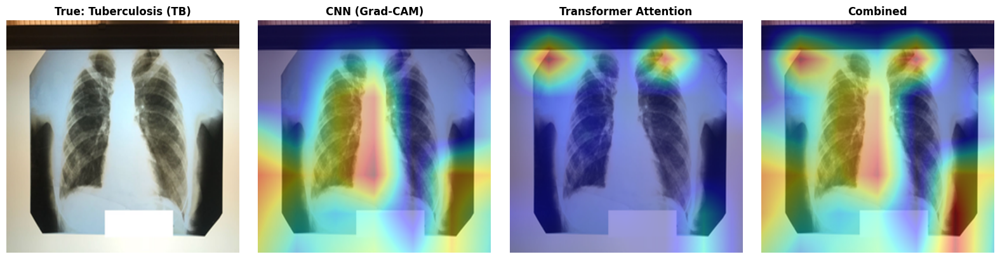

✅ Heatmap saved: /kaggle/working/plots/heatmap_TB_7.png


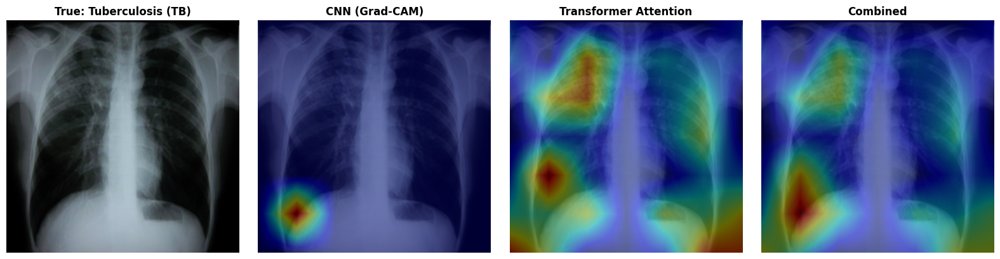

✅ Heatmap saved: /kaggle/working/plots/heatmap_TB_19.png


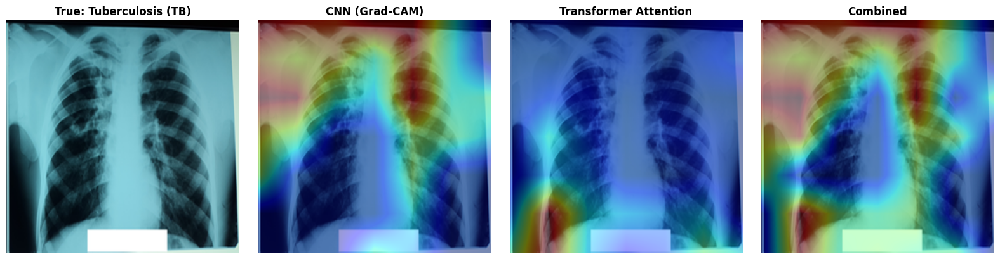

✅ Heatmap saved: /kaggle/working/plots/heatmap_TB_25.png


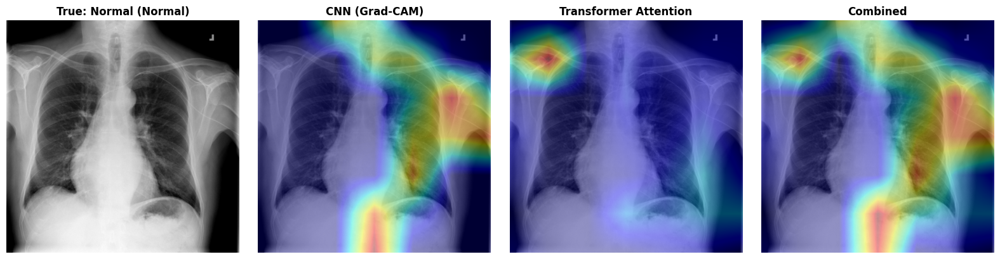

✅ Heatmap saved: /kaggle/working/plots/heatmap_Normal_0.png


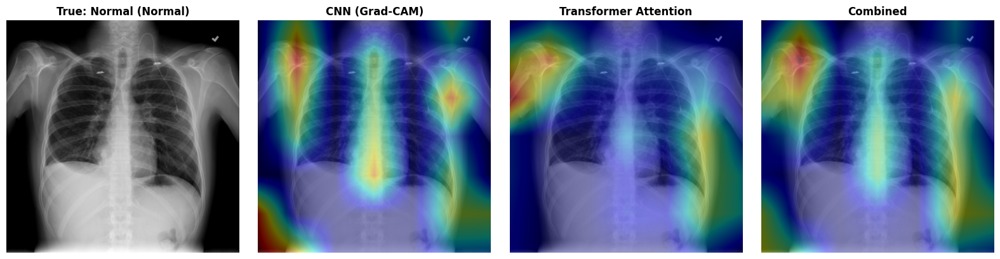

✅ Heatmap saved: /kaggle/working/plots/heatmap_Normal_1.png

✅ All heatmaps generated successfully!
📁 Heatmaps saved in: /kaggle/working/plots

📊 Generated files:
   - heatmap_Normal_1.png
   - heatmap_TB_19.png
   - heatmap_Normal_0.png
   - heatmap_TB_25.png
   - heatmap_TB_7.png


In [22]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  STANDALONE HEATMAP GENERATOR - TB X-ray                                       ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import torch, torch.nn as nn, torch.nn.functional as F
import numpy as np, cv2, matplotlib.pyplot as plt
from pathlib import Path
from einops import rearrange
from scipy.ndimage import zoom
import torchvision.models as models
import warnings
warnings.filterwarnings('ignore')

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
OUTDIR = Path('/kaggle/working')
CKDIR = OUTDIR / 'checkpoints'
PLTDIR = OUTDIR / 'plots'
PLTDIR.mkdir(exist_ok=True)

MEAN = (0.485, 0.456, 0.406)
STD = (0.229, 0.224, 0.225)
class_names = ['Normal', 'Tuberculosis']  # TB classes

# --- 1. Rebuild Model Architecture (Must match exactly) ---
class DropPath(nn.Module):
    def __init__(self, drop_prob=0.0): super().__init__(); self.drop_prob = drop_prob
    def forward(self, x):
        if self.drop_prob == 0.0 or not self.training: return x
        keep_prob = float(1.0 - self.drop_prob)
        return x * (torch.rand((x.shape[0], 1, 1), dtype=torch.float32, device=x.device) * keep_prob)

class WindowAttention(nn.Module):
    def __init__(self, d_model, nhead, window_size=7, dropout=0.1):
        super().__init__()
        self.nhead, self.window_size, self.head_dim = nhead, window_size, d_model // nhead
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(d_model, d_model * 3); self.proj = nn.Linear(d_model, d_model)
        self.attn_drop, self.proj_drop, self.attn_weights = nn.Dropout(dropout), nn.Dropout(dropout), None
    def forward(self, x, H, W):
        B, N, C = x.shape; x = x.reshape(B, H, W, C)
        pad_h, pad_w = (self.window_size - H % self.window_size) % self.window_size, (self.window_size - W % self.window_size) % self.window_size
        if pad_h > 0 or pad_w > 0: x = F.pad(x, (0, 0, 0, pad_w, 0, pad_h))
        Hp, Wp = x.shape[1], x.shape[2]
        x = x.reshape(B, Hp//self.window_size, self.window_size, Wp//self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(-1, self.window_size**2, C)
        qkv = self.qkv(x).reshape(-1, self.window_size**2, 3, self.nhead, self.head_dim).permute(2,0,3,1,4)
        attn = (qkv[0] @ qkv[1].transpose(-2,-1)) * self.scale; attn = attn.softmax(dim=-1); self.attn_weights = attn.detach()
        x = self.proj_drop(self.proj((self.attn_drop(attn) @ qkv[2]).transpose(1,2).reshape(-1, self.window_size**2, C)))
        x = x.reshape(B, Hp//self.window_size, Wp//self.window_size, self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(B, Hp, Wp, C)
        return x[:, :H, :W, :].reshape(B, -1, C) if pad_h > 0 or pad_w > 0 else x.reshape(B, -1, C)

class TransformerBlockWithWindow(nn.Module):
    def __init__(self, d_model, nhead, ffn_dim, window_size=7, attn_drop=0.1, ffn_drop=0.1, drop_path=0.0):
        super().__init__()
        self.norm1, self.norm2 = nn.LayerNorm(d_model), nn.LayerNorm(d_model)
        self.global_attn = nn.MultiheadAttention(d_model, nhead, dropout=attn_drop, batch_first=True)
        self.window_attn = WindowAttention(d_model, nhead, window_size, attn_drop)
        self.gate = nn.Sequential(nn.Linear(d_model*2, d_model), nn.Sigmoid())
        self.ffn = nn.Sequential(nn.Linear(d_model, ffn_dim), nn.GELU(), nn.Dropout(ffn_drop), nn.Linear(ffn_dim, d_model), nn.Dropout(ffn_drop))
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.attn_weights, self.window_attn_weights = None, None
    def forward(self, x, H, W):
        x_norm = self.norm1(x)
        global_out, global_attn = self.global_attn(x_norm, x_norm, x_norm, need_weights=True)
        self.attn_weights = global_attn.detach()
        window_out = self.window_attn(x_norm[:, 1:, :], H, W)
        self.window_attn_weights = self.window_attn.attn_weights
        gate = self.gate(torch.cat([global_out[:, 1:, :], window_out], dim=-1))
        combined = torch.cat([global_out[:, :1, :], gate * global_out[:, 1:, :] + (1-gate) * window_out], dim=1)
        x = x + self.drop_path(combined)
        return x + self.drop_path(self.ffn(self.norm2(x)))

class ImprovedBackbone(nn.Module):
    def __init__(self): 
        super().__init__()
        self.backbone = models.convnext_base(weights=None)
        self.feature_extractor = self.backbone.features
    def forward(self, x): 
        return self.feature_extractor(x)

class EnhancedHViT(nn.Module):
    def __init__(self, num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536):
        super().__init__()
        self.d_model = d_model
        self.img_size = img_size
        self.backbone = ImprovedBackbone()
        with torch.no_grad():
            _, c, h, w = self.backbone(torch.zeros(1, 3, img_size, img_size)).shape
        self.spatial_h, self.spatial_w = h, w
        self.proj = nn.Sequential(
            nn.Conv2d(c, d_model, 1, bias=False),
            nn.BatchNorm2d(d_model),
            nn.GELU(),
            nn.Conv2d(d_model, d_model, 3, padding=1, bias=False),
            nn.BatchNorm2d(d_model),
            nn.GELU()
        )
        self.norm_proj = nn.LayerNorm(d_model)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, h*w + 1, d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        dpr = [x.item() for x in torch.linspace(0, 0.15, n_layers)]
        self.encoder = nn.ModuleList([
            TransformerBlockWithWindow(d_model, nhead, dim_ffn, min(7, h, w), drop_path=dpr[i]) 
            for i in range(n_layers)
        ])
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Linear(d_model, d_model//2),
            nn.GELU(),
            nn.Dropout(0.3),
            nn.Linear(d_model//2, d_model//4),
            nn.GELU(),
            nn.Dropout(0.15),
            nn.Linear(d_model//4, num_classes)
        )
    def forward(self, x):
        B = x.size(0)
        tokens = rearrange(self.proj(self.backbone(x)), 'b d h w -> b (h w) d')
        tokens = self.norm_proj(tokens)
        tokens = torch.cat([self.cls_token.expand(B,-1,-1), tokens], dim=1) + self.pos_embed
        for block in self.encoder:
            tokens = block(tokens, self.spatial_h, self.spatial_w)
        return self.head(self.norm(tokens)[:, 0])
    
    def get_attentions(self):
        g, w = [], []
        for b in self.encoder:
            if b.attn_weights is not None:
                g.append(b.attn_weights)
            if b.window_attn_weights is not None:
                w.append(b.window_attn_weights)
        return g, w

# --- 2. Load Model ---
print("📦 Rebuilding TB model and loading weights...")
model = EnhancedHViT(num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536).to(DEVICE)

# Load weights
checkpoint_path = CKDIR / 'best_model.pth'
if checkpoint_path.exists():
    model.load_state_dict(torch.load(checkpoint_path, map_location=DEVICE, weights_only=False)['model'])
    print(f"✅ Model loaded from: {checkpoint_path}")
else:
    print(f"❌ Checkpoint not found at: {checkpoint_path}")
    print("Please train the TB model first or check the path.")
    raise FileNotFoundError("Model checkpoint not found!")

model.eval()
print("✅ Model loaded successfully!")

# --- 3. Heatmap Logic ---
def isolate_tumor(heatmap, percentile=40):
    """Isolate the most relevant regions in the heatmap."""
    if heatmap is None: 
        return None
    threshold = np.percentile(heatmap, percentile)
    masked = np.where(heatmap > threshold, heatmap, 0.0)
    if masked.max() > masked.min():
        return (masked - masked.min()) / (masked.max() - masked.min() + 1e-8)
    return np.zeros_like(heatmap)

class HeatmapGenerator:
    def __init__(self, model):
        self.model = model.to(DEVICE)
        self.model.eval()
        self.cnn_f, self.cnn_g = None, None
        self.img_size = getattr(model, 'img_size', 224)
        
        # Find last conv layer for Grad-CAM
        last_conv = None
        for m in self.model.backbone.feature_extractor.modules():
            if isinstance(m, nn.Conv2d):
                last_conv = m
        
        if last_conv:
            last_conv.register_forward_hook(lambda m, i, o: setattr(self, 'cnn_f', o.detach()))
            last_conv.register_backward_hook(lambda m, gi, go: setattr(self, 'cnn_g', (go[0] if isinstance(go, (tuple, list)) else go).detach()))
            print("✅ Grad-CAM hooks registered")
        else:
            print("⚠️ No Conv2d found for Grad-CAM")
    
    def get_cnn(self, x, target):
        """Generate Grad-CAM heatmap."""
        out = self.model(x)
        self.model.zero_grad()
        
        oh = torch.zeros_like(out)
        oh[0, target] = 1
        out.backward(gradient=oh, retain_graph=True)
        
        if self.cnn_f is None:
            return None
        
        weights = self.cnn_g.mean(dim=(2, 3), keepdim=True)
        cam = F.relu((weights * self.cnn_f).sum(1)).squeeze().cpu().numpy()
        
        if cam.max() > cam.min():
            return (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam
    
    def get_attn(self, x):
        """Extract attention maps from transformer."""
        with torch.no_grad():
            self.model(x)
        
        g, _ = self.model.get_attentions()
        if not g:
            return None
        
        a = g[-1]  # Use last layer's attention
        if a.dim() == 3:
            a = a[0, 0, 1:].cpu().numpy()
        else:
            a = a[0, :, 0, 1:].mean(0).cpu().numpy()
        
        a = a.reshape(self.model.spatial_h, self.model.spatial_w)
        if a.max() > a.min():
            return (a - a.min()) / (a.max() - a.min() + 1e-8)
        return a
    
    def draw(self, img_path, target, names, save_path, target_class_name=None):
        """Generate and save heatmap visualization."""
        # Load and preprocess image
        img = cv2.imread(str(img_path))
        if img is None:
            print(f"❌ Could not read image: {img_path}")
            return
        
        rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        sz = rgb.shape[:2]
        
        # Preprocess for model
        t = torch.from_numpy(cv2.resize(rgb, (self.img_size, self.img_size))).float().permute(2,0,1)/255.0
        t = ((t - torch.tensor(MEAN).view(3,1,1)) / torch.tensor(STD).view(3,1,1)).unsqueeze(0).to(DEVICE)
        
        # Generate heatmaps
        c = self.get_cnn(t.clone(), target)
        a = self.get_attn(t.clone())
        
        # Combine heatmaps
        comb = None
        if c is not None and a is not None:
            if a.shape != c.shape:
                a = zoom(a, (c.shape[0]/a.shape[0], c.shape[1]/a.shape[1]), order=1)
            comb = 0.5 * c + 0.5 * a
            if comb.max() > comb.min():
                comb = (comb - comb.min()) / (comb.max() - comb.min() + 1e-8)
        
        # Isolate tumor regions
        c = isolate_tumor(c, 40)
        a = isolate_tumor(a, 35)
        comb = isolate_tumor(comb, 35)
        
        # Create visualization
        fig, axes = plt.subplots(1, 4, figsize=(16, 4))
        
        # Original image
        axes[0].imshow(rgb, cmap='gray')
        status = f"True: {names[target]}"
        if target_class_name:
            status += f" ({target_class_name})"
        axes[0].set_title(status, fontsize=12, fontweight='bold')
        axes[0].axis('off')
        
        # Heatmaps
        heatmaps = [c, a, comb]
        titles = ['CNN (Grad-CAM)', 'Transformer Attention', 'Combined']
        
        for i, (hmap, title) in enumerate(zip(heatmaps, titles)):
            if hmap is not None:
                # Resize heatmap to original image size
                hr = zoom(hmap, (sz[0]/hmap.shape[0], sz[1]/hmap.shape[1]), order=1)
                colored = (plt.cm.jet(hr)[:,:,:3] * 255).astype(np.uint8)
                overlay = cv2.addWeighted(rgb, 0.6, colored, 0.4, 0)
                axes[i+1].imshow(overlay)
            else:
                axes[i+1].imshow(rgb, cmap='gray')
            axes[i+1].set_title(title, fontsize=12, fontweight='bold')
            axes[i+1].axis('off')
        
        plt.tight_layout()
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        plt.show()
        print(f"✅ Heatmap saved: {save_path}")

# --- 4. Load TB Dataset and Find Test Images ---
print("\n📂 Loading TB dataset and finding test images...")

VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}

# Load dataset
samples = []
base_paths = [
    Path('/kaggle/input/datasets/nikitachaulagain/dataasets/Tuberculosis (TB) Chest X-ray Database/Tuberculosis (TB) Chest X-ray Database/TB_Chest_Radiography_Database'),
    Path('/kaggle/input/datasets/nikitachaulagain/dataasets/Tuberculosis (TB) Chest X-ray Database/TB_Chest_Radiography_Database'),
]

base = None
for path in base_paths:
    if path.exists():
        base = path
        print(f"✅ Found dataset at: {base}")
        break

if base is None:
    print("❌ Dataset not found! Please check the path.")
    print("Available directories:")
    user_dir = Path('/kaggle/input/datasets/nikitachaulagain')
    if user_dir.exists():
        for item in user_dir.iterdir():
            print(f"  - {item.name}")
    exit()

# Collect images
print("📂 Scanning dataset...")
for folder in base.iterdir():
    if not folder.is_dir():
        continue
    
    folder_name = folder.name.lower()
    if 'normal' in folder_name:
        cname = 'Normal'
    elif 'tb' in folder_name or 'tuberculosis' in folder_name:
        cname = 'Tuberculosis'
    else:
        print(f"⚠️ Skipping unknown folder: {folder.name}")
        continue
    
    count = 0
    for ext in VALID_EXTS:
        for p in folder.rglob(f'*{ext}'):
            samples.append((str(p), cname))
            count += 1
    print(f"   {cname}: {count} images")

print(f"✅ Total images: {len(samples)}")

# Create test split
from sklearn.model_selection import train_test_split
labels = [class_names.index(l) for l in [s[1] for s in samples]]
_, temp_s = train_test_split(samples, test_size=0.3, stratify=labels, random_state=42)
_, test_s = train_test_split(temp_s, test_size=0.5, 
                            stratify=[class_names.index(l) for l in [s[1] for s in temp_s]], 
                            random_state=42)

print(f"📊 Test set size: {len(test_s)} images")

# --- 5. Run Model on Test Set to Find Correct Predictions ---
print("\n🔍 Finding correct predictions for heatmap...")

all_p, all_l = [], []
hm = HeatmapGenerator(model)

for p, l in tqdm(test_s, desc="Evaluating test images"):
    img = cv2.imread(p)
    if img is None:
        continue
    
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    t = torch.from_numpy(cv2.resize(rgb, (224, 224))).float().permute(2,0,1)/255.0
    t = ((t - torch.tensor(MEAN).view(3,1,1)) / torch.tensor(STD).view(3,1,1)).unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        out = model(t)
    
    all_p.append(out.argmax(1).item())
    all_l.append(class_names.index(l))

# Calculate accuracy
correct = sum(1 for p,l in zip(all_p, all_l) if p == l)
print(f"\n📊 Test Accuracy: {correct/len(all_p)*100:.2f}%")

# --- 6. Generate Heatmaps for Correctly Classified TB Cases ---
print("\n🔥 Generating Heatmaps for TB Cases...")

# Get correctly classified TB images
tb_correct = [i for i, (p, l) in enumerate(zip(all_p, all_l)) 
              if p == l and l == class_names.index('Tuberculosis')]

# Also get correctly classified Normal images for comparison
normal_correct = [i for i, (p, l) in enumerate(zip(all_p, all_l)) 
                  if p == l and l == class_names.index('Normal')]

print(f"Found {len(tb_correct)} correct TB predictions and {len(normal_correct)} correct Normal predictions")

# Generate TB heatmaps
for idx in tb_correct[:3]:  # Generate up to 3 TB heatmaps
    class_idx = class_names.index('Tuberculosis')
    hm.draw(test_s[idx][0], class_idx, class_names, 
            PLTDIR / f'heatmap_TB_{idx}.png',
            target_class_name='TB')

# Generate Normal heatmaps for comparison
for idx in normal_correct[:2]:  # Generate 2 Normal heatmaps
    class_idx = class_names.index('Normal')
    hm.draw(test_s[idx][0], class_idx, class_names, 
            PLTDIR / f'heatmap_Normal_{idx}.png',
            target_class_name='Normal')

print("\n✅ All heatmaps generated successfully!")
print(f"📁 Heatmaps saved in: {PLTDIR}")
print("\n📊 Generated files:")
for f in PLTDIR.glob('heatmap_*.png'):
    print(f"   - {f.name}")

📦 Rebuilding TB model and loading weights...
📂 Scanning TB X-Ray dataset...

📊 COMPREHENSIVE TB X-RAY DATASET ANALYSIS REPORT

🔹 Total Images: 4200 | Classes: 2
🔹 Split: 70% Train (2940) / 15% Val (630) / 15% Test (630)
   - Normal      :  3500 images (83.3%)
   - Tuberculosis:   700 images (16.7%)

🧠 Running inference on Test Set...


Predicting:   0%|          | 0/630 [00:00<?, ?it/s]

⚠️ Training history not found - skipping Plot 1


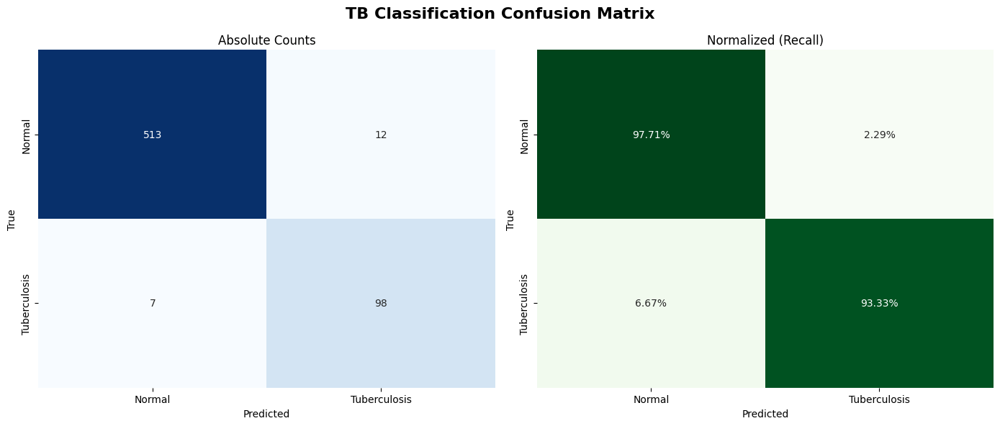

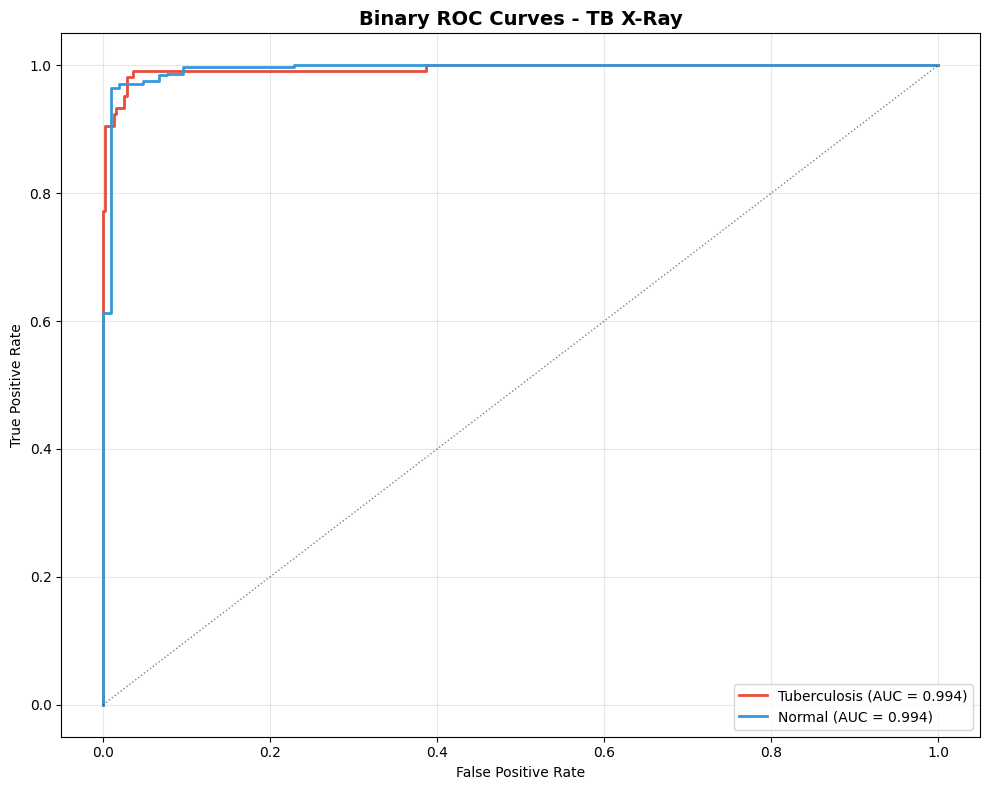

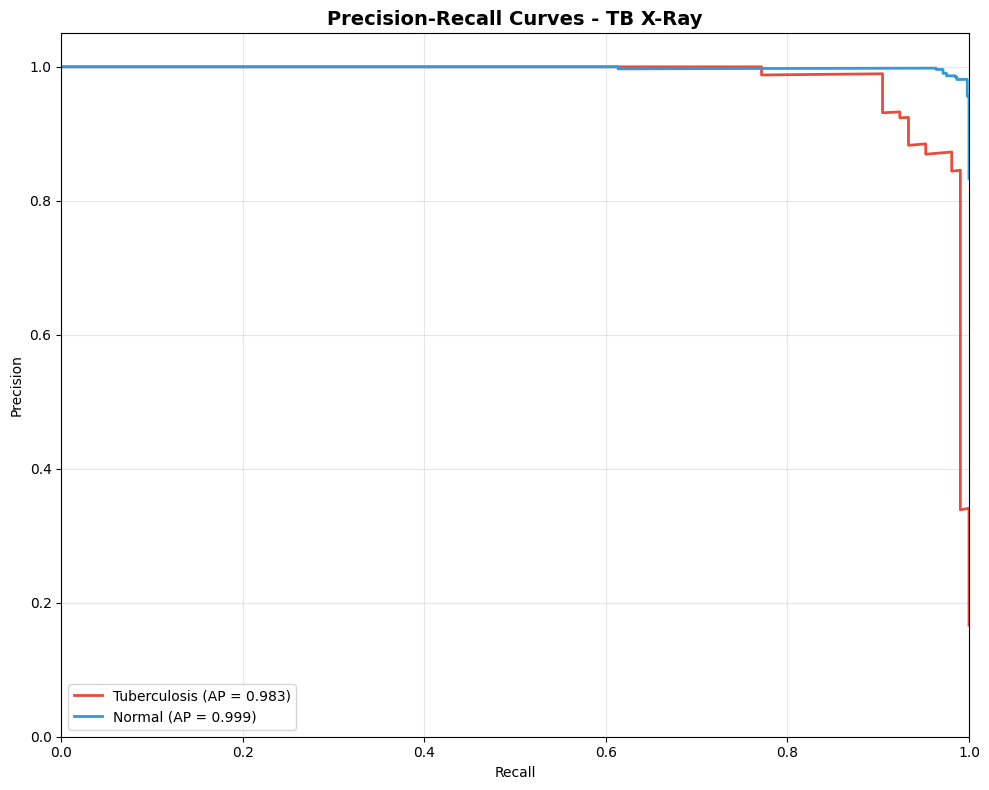

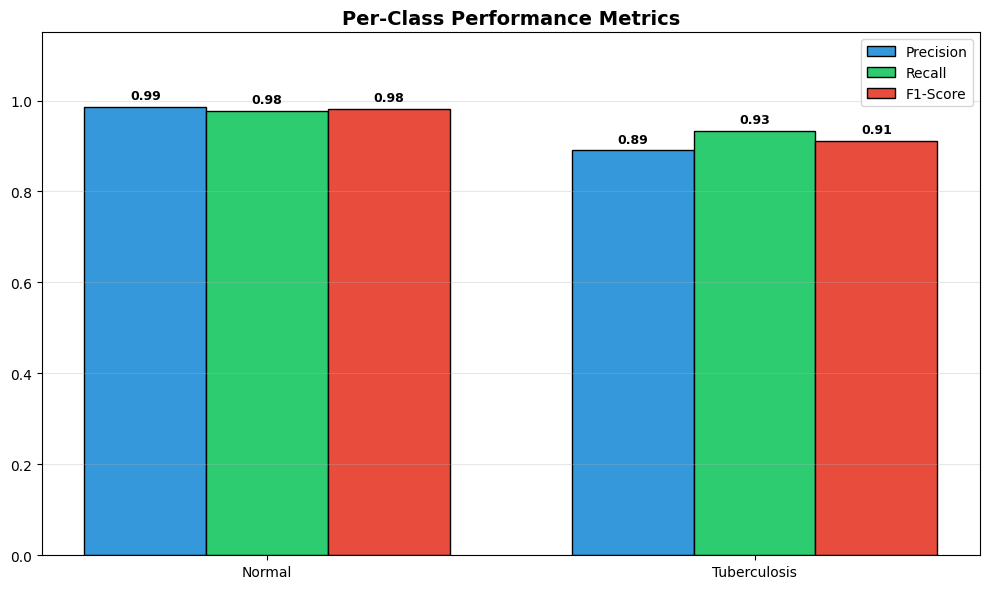

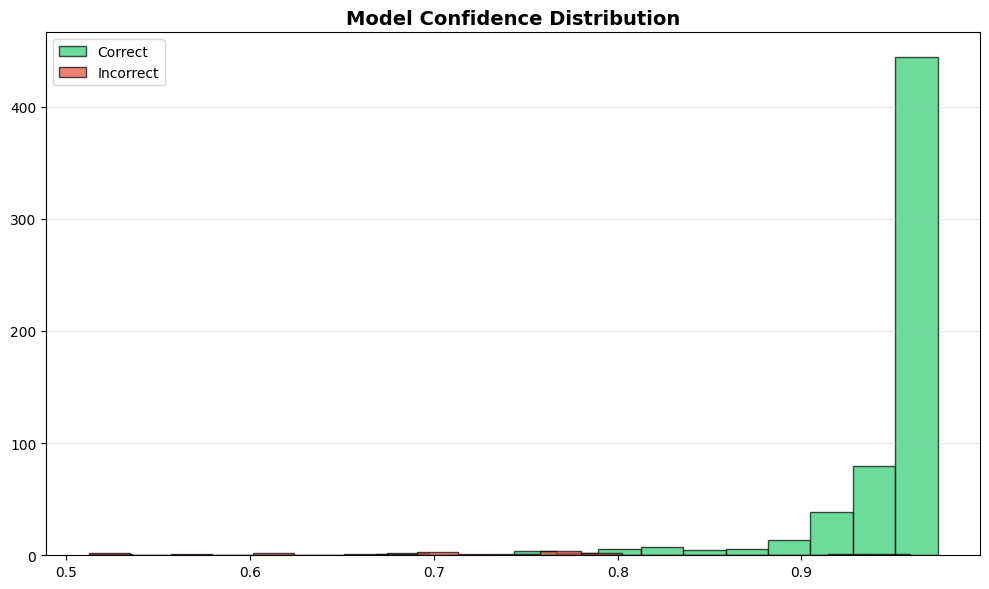

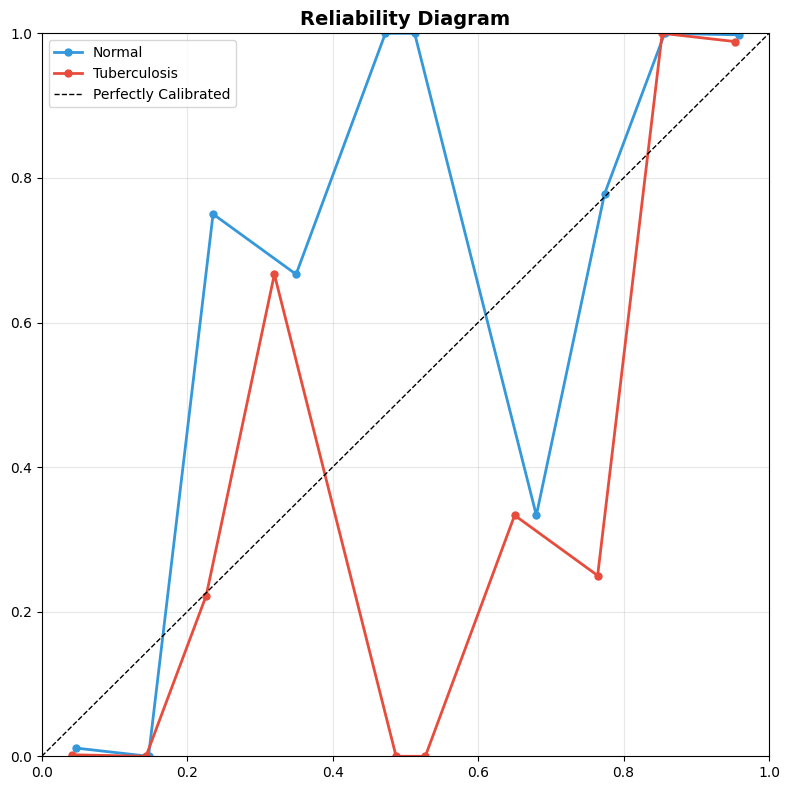

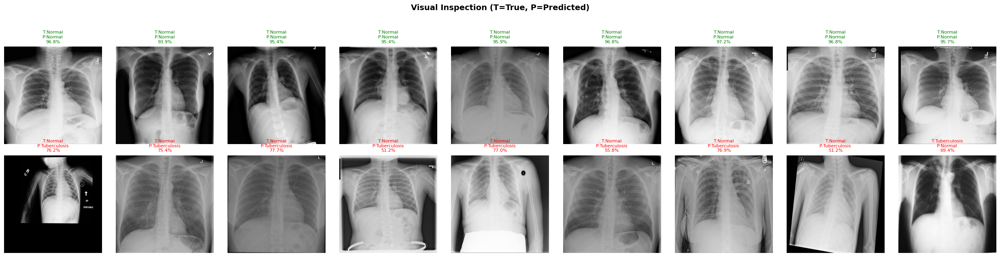

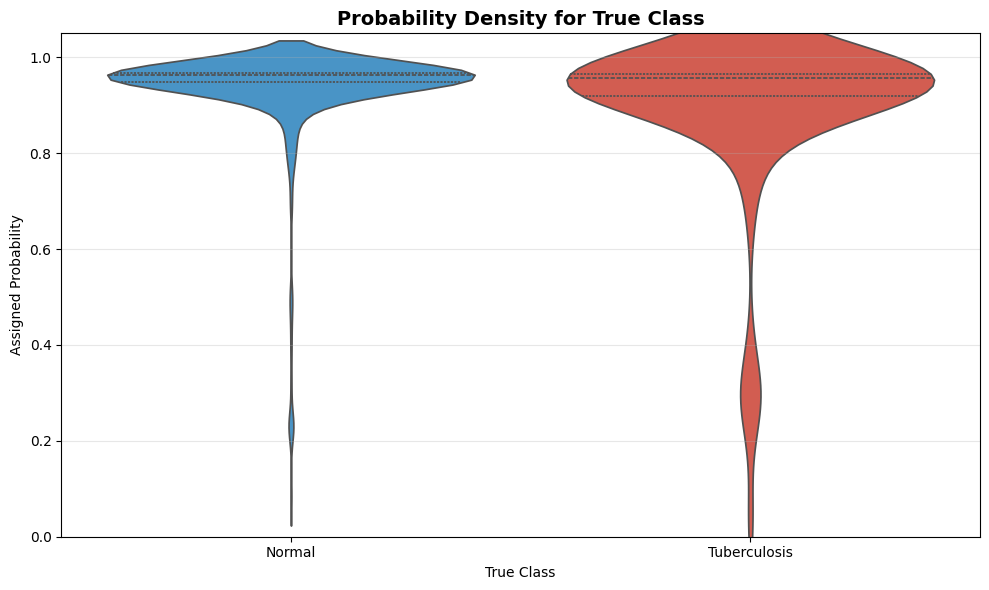

⏳ Extracting t-SNE features...


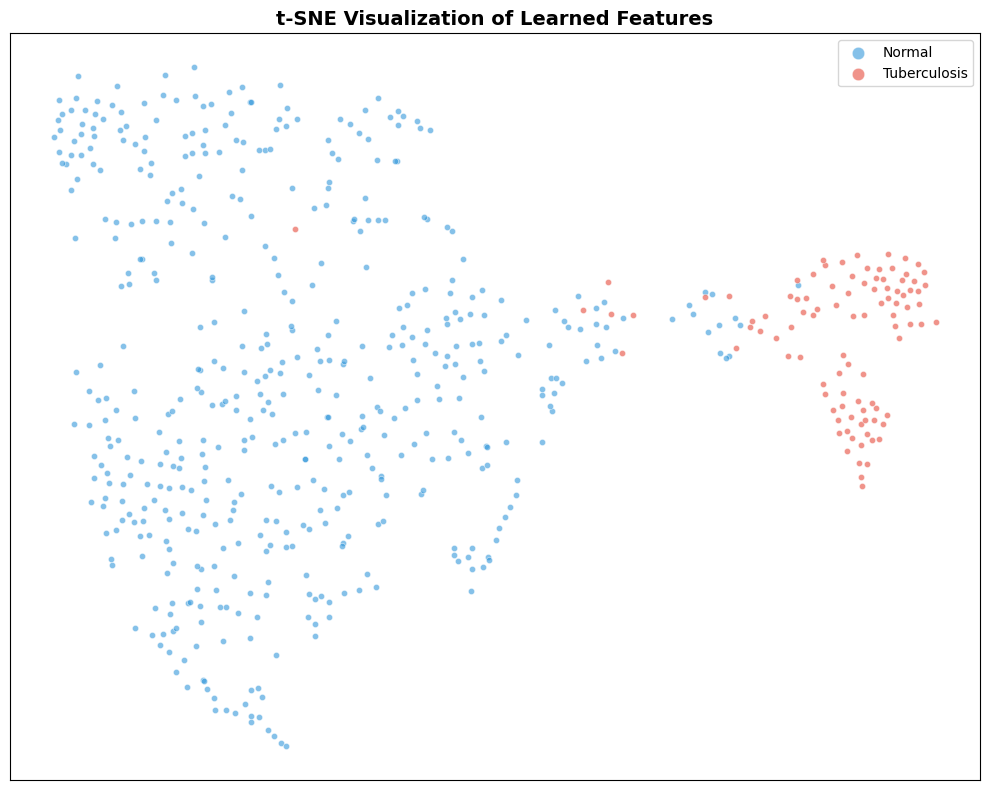

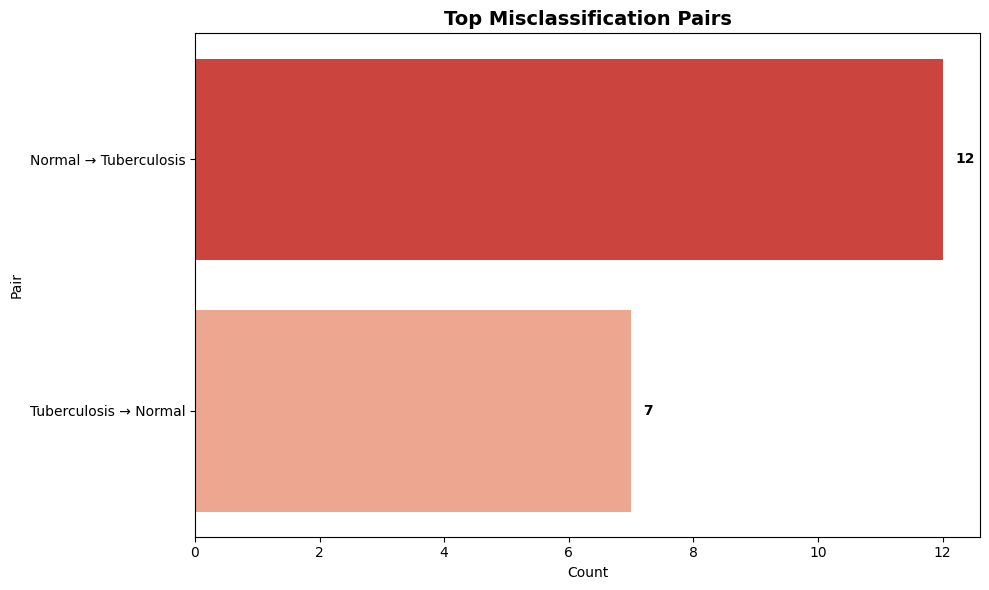

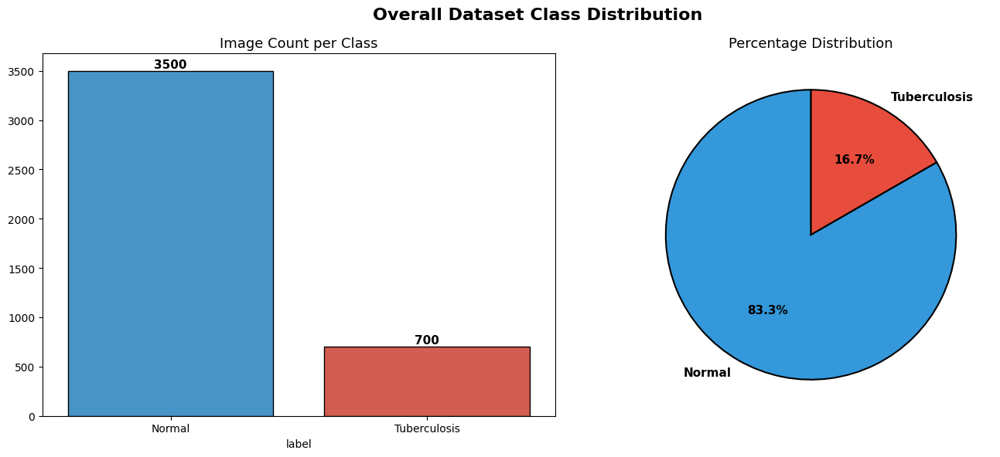

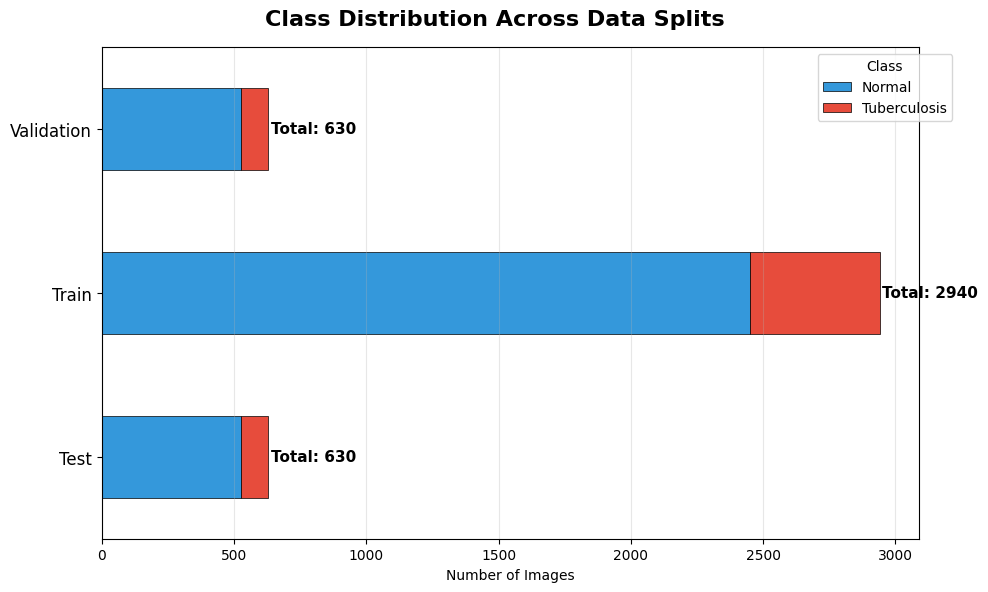

⏳ Computing average X-Ray per class...


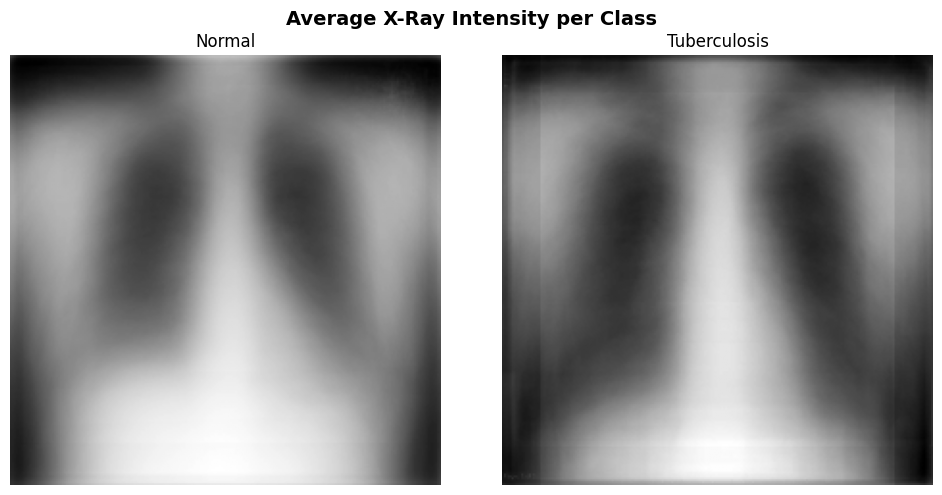

⏳ Sampling pixel intensities...


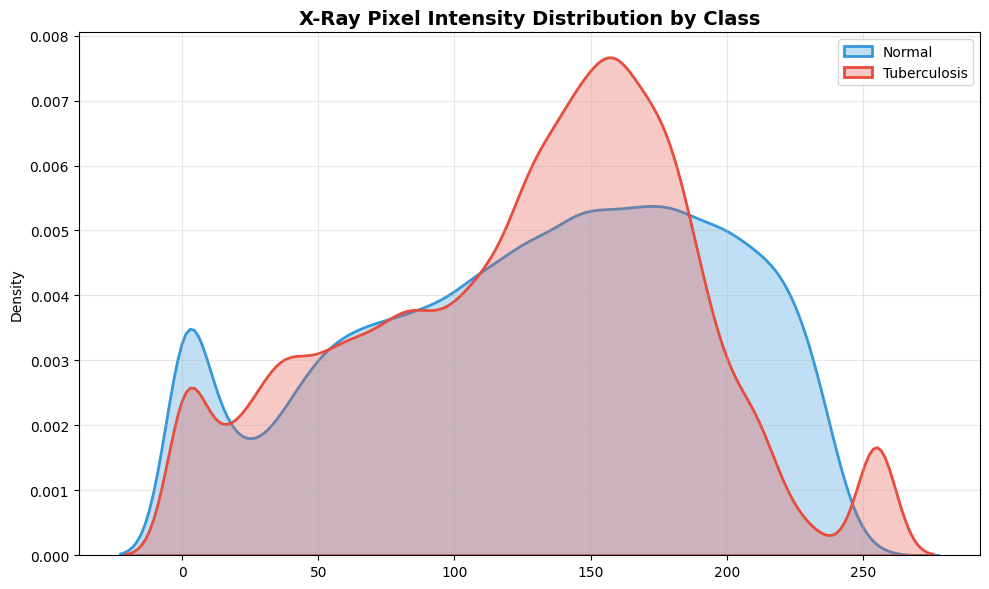

⏳ Checking image dimensions...


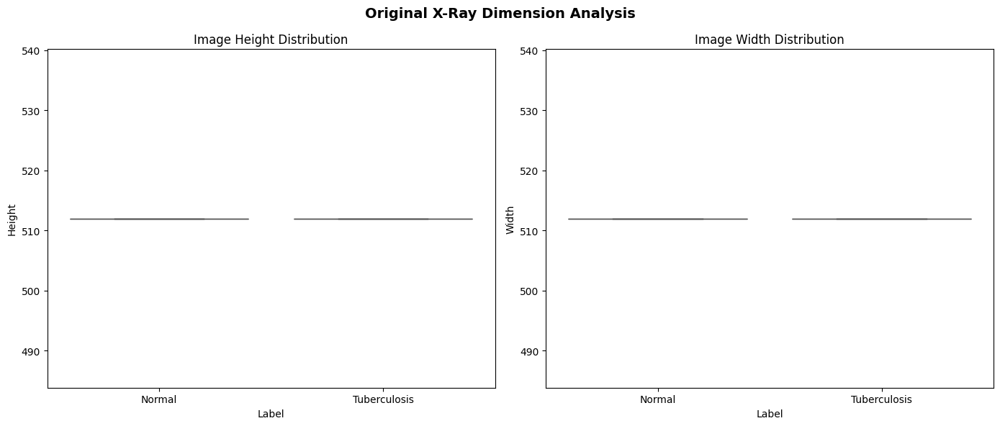


🔥 Generating Grad-CAM Overlays...


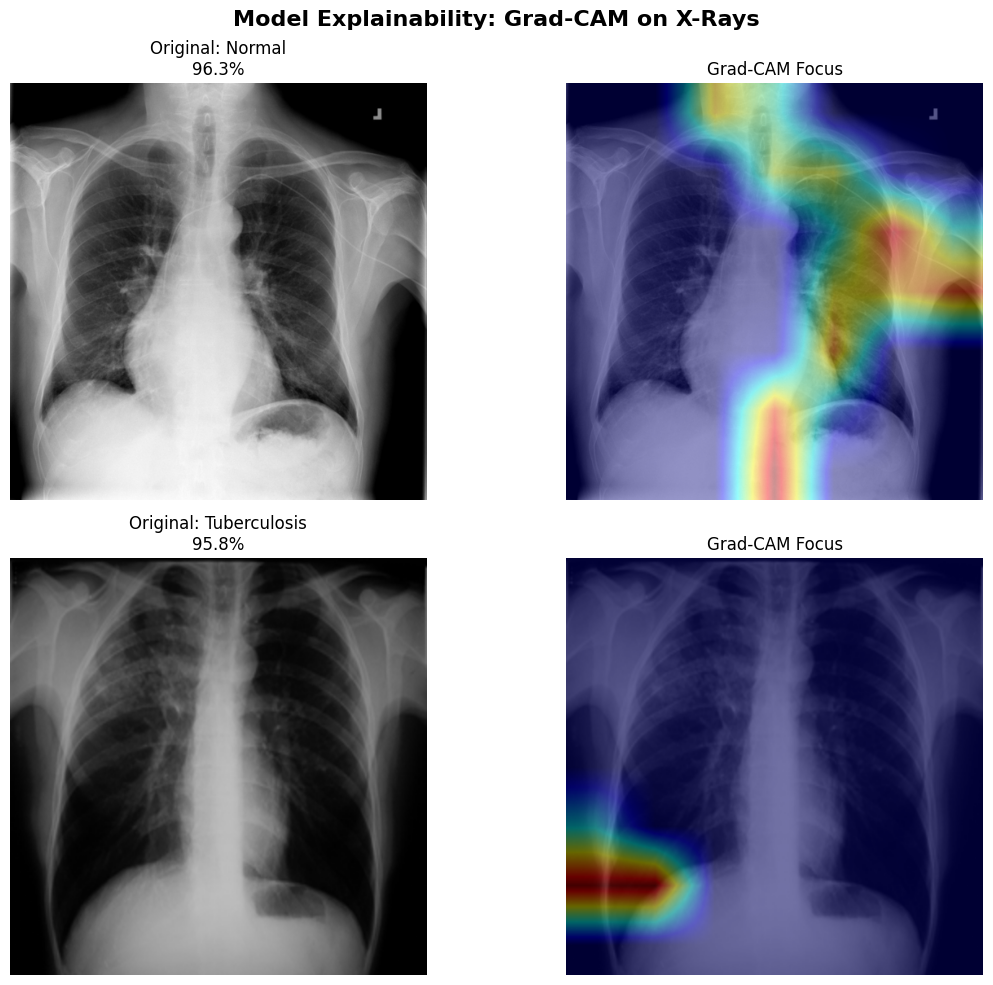


🚀 Analyzing Class-wise Confidence Thresholds...


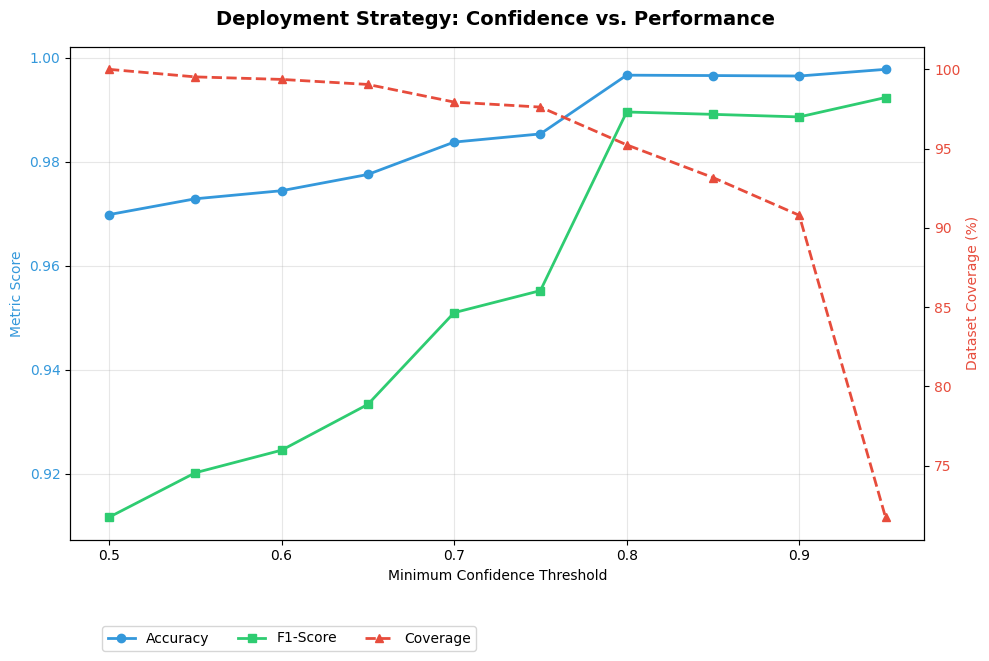

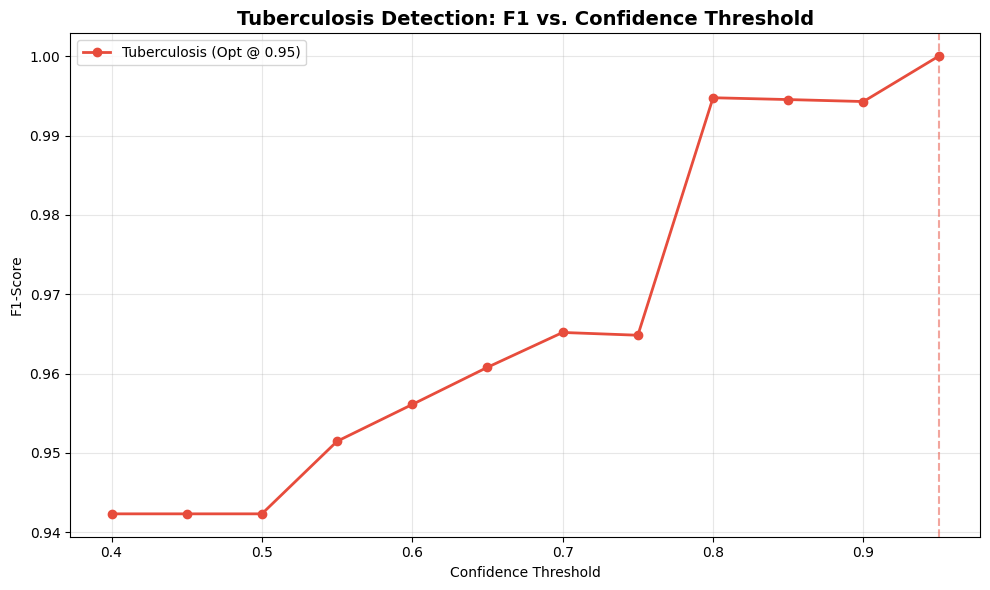


🧠 Extracting Deep Feature Maps...


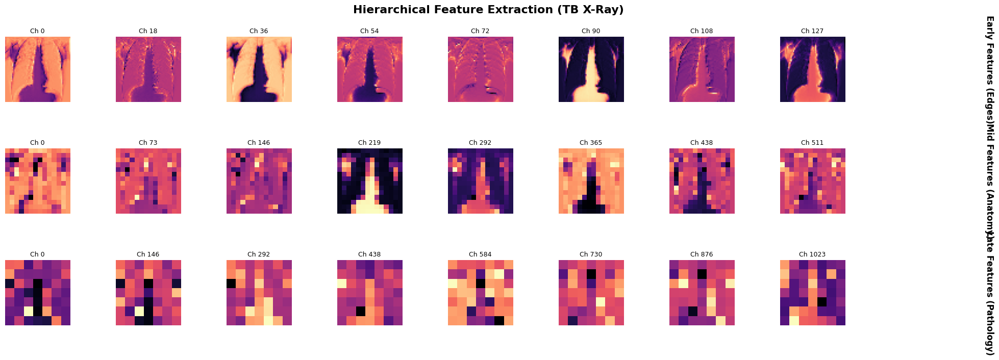


✅ ALL 20 PLOTS GENERATED SUCCESSFULLY FOR TB X-RAYS!
📁 Location: /kaggle/working/plots


In [26]:
# ╔══════════════════════════════════════════════════════════════════════════════════════╗
# ║  ULTIMATE MEGA CELL: ALL 20 PLOTS (ADAPTED FOR BINARY TB X-RAY)                   ║
# ╚══════════════════════════════════════════════════════════════════════════════════════╝

import os, time, random, copy, warnings
from pathlib import Path
from collections import Counter
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns, cv2
from tqdm.auto import tqdm
from scipy.ndimage import zoom
import torch, torch.nn as nn, torch.nn.functional as F
import torchvision.models as models
from sklearn.metrics import (accuracy_score, f1_score, roc_curve, auc, confusion_matrix, 
                             classification_report, precision_recall_curve, average_precision_score)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.manifold import TSNE
from torch.cuda.amp import autocast
from einops import rearrange

warnings.filterwarnings('ignore')
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
OUTDIR = Path('/kaggle/working')
PLTDIR = OUTDIR / 'plots'; PLTDIR.mkdir(exist_ok=True)
CKDIR = OUTDIR / 'checkpoints'
MEAN, STD = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)

# ✅ TB X-RAY CONFIG
class_names = ['Normal', 'Tuberculosis']
colors = ['#3498db', '#e74c3c'] # Blue for Normal, Red for TB
VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}

# ─── 1. MODEL ARCHITECTURE (Binary) ──────────────────────────────────────────────
class DropPath(nn.Module):
    def __init__(self, drop_prob=0.0): super().__init__(); self.drop_prob = drop_prob
    def forward(self, x):
        if self.drop_prob == 0.0 or not self.training: return x
        return x * (torch.rand((x.shape[0], 1, 1), dtype=torch.float32, device=x.device) * float(1.0 - self.drop_prob))

class WindowAttention(nn.Module):
    def __init__(self, d_model, nhead, window_size=7, dropout=0.1):
        super().__init__()
        self.nhead, self.window_size, self.head_dim = nhead, window_size, d_model // nhead
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(d_model, d_model * 3); self.proj = nn.Linear(d_model, d_model)
        self.attn_drop, self.proj_drop, self.attn_weights = nn.Dropout(dropout), nn.Dropout(dropout), None
    def forward(self, x, H, W):
        B, N, C = x.shape; x = x.reshape(B, H, W, C)
        pad_h, pad_w = (self.window_size - H % self.window_size) % self.window_size, (self.window_size - W % self.window_size) % self.window_size
        if pad_h > 0 or pad_w > 0: x = F.pad(x, (0, 0, 0, pad_w, 0, pad_h))
        Hp, Wp = x.shape[1], x.shape[2]
        x = x.reshape(B, Hp//self.window_size, self.window_size, Wp//self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(-1, self.window_size**2, C)
        qkv = self.qkv(x).reshape(-1, self.window_size**2, 3, self.nhead, self.head_dim).permute(2,0,3,1,4)
        attn = (qkv[0] @ qkv[1].transpose(-2,-1)) * self.scale; attn = attn.softmax(dim=-1); self.attn_weights = attn.detach()
        x = self.proj_drop(self.proj((self.attn_drop(attn) @ qkv[2]).transpose(1,2).reshape(-1, self.window_size**2, C)))
        x = x.reshape(B, Hp//self.window_size, Wp//self.window_size, self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(B, Hp, Wp, C)
        return x[:, :H, :W, :].reshape(B, -1, C) if pad_h > 0 or pad_w > 0 else x.reshape(B, -1, C)

class TransformerBlockWithWindow(nn.Module):
    def __init__(self, d_model, nhead, ffn_dim, window_size=7, attn_drop=0.1, ffn_drop=0.1, drop_path=0.0):
        super().__init__()
        self.norm1, self.norm2 = nn.LayerNorm(d_model), nn.LayerNorm(d_model)
        self.global_attn = nn.MultiheadAttention(d_model, nhead, dropout=attn_drop, batch_first=True)
        self.window_attn = WindowAttention(d_model, nhead, window_size, attn_drop)
        self.gate = nn.Sequential(nn.Linear(d_model*2, d_model), nn.Sigmoid())
        self.ffn = nn.Sequential(nn.Linear(d_model, ffn_dim), nn.GELU(), nn.Dropout(ffn_drop), nn.Linear(ffn_dim, d_model), nn.Dropout(ffn_drop))
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.attn_weights, self.window_attn_weights = None, None
    def forward(self, x, H, W):
        x_norm = self.norm1(x)
        global_out, global_attn = self.global_attn(x_norm, x_norm, x_norm, need_weights=True)
        self.attn_weights = global_attn.detach()
        window_out = self.window_attn(x_norm[:, 1:, :], H, W); self.window_attn_weights = self.window_attn.attn_weights
        gate = self.gate(torch.cat([global_out[:, 1:, :], window_out], dim=-1))
        combined = torch.cat([global_out[:, :1, :], gate * global_out[:, 1:, :] + (1-gate) * window_out], dim=1)
        x = x + self.drop_path(combined)
        return x + self.drop_path(self.ffn(self.norm2(x)))

class ImprovedBackbone(nn.Module):
    def __init__(self): super().__init__(); self.backbone = models.convnext_base(weights=None); self.feature_extractor = self.backbone.features
    def forward(self, x): return self.feature_extractor(x)

class EnhancedHViT(nn.Module):
    def __init__(self, num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536):
        super().__init__(); self.d_model = d_model; self.img_size = img_size; self.backbone = ImprovedBackbone()
        with torch.no_grad(): _, c, h, w = self.backbone(torch.zeros(1, 3, img_size, img_size)).shape
        self.spatial_h, self.spatial_w = h, w
        self.proj = nn.Sequential(nn.Conv2d(c, d_model, 1, bias=False), nn.BatchNorm2d(d_model), nn.GELU(), nn.Conv2d(d_model, d_model, 3, padding=1, bias=False), nn.BatchNorm2d(d_model), nn.GELU())
        self.norm_proj = nn.LayerNorm(d_model); self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, h*w + 1, d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02); nn.init.trunc_normal_(self.pos_embed, std=0.02)
        dpr = [x.item() for x in torch.linspace(0, 0.15, n_layers)]
        self.encoder = nn.ModuleList([TransformerBlockWithWindow(d_model, nhead, dim_ffn, min(7, h, w), drop_path=dpr[i]) for i in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(nn.LayerNorm(d_model), nn.Linear(d_model, d_model//2), nn.GELU(), nn.Dropout(0.3), nn.Linear(d_model//2, d_model//4), nn.GELU(), nn.Dropout(0.15), nn.Linear(d_model//4, num_classes))
    def forward(self, x):
        B = x.size(0); tokens = rearrange(self.proj(self.backbone(x)), 'b d h w -> b (h w) d')
        tokens = self.norm_proj(tokens); tokens = torch.cat([self.cls_token.expand(B,-1,-1), tokens], dim=1) + self.pos_embed
        for block in self.encoder: tokens = block(tokens, self.spatial_h, self.spatial_w)
        return self.head(self.norm(tokens)[:, 0])
    def get_attentions(self):
        g, w = [], []
        for b in self.encoder:
            if b.attn_weights is not None: g.append(b.attn_weights)
            if b.window_attn_weights is not None: w.append(b.window_attn_weights)
        return g, w

# ─── 2. LOAD WEIGHTS & SPLIT DATA ────────────────────────────────────────────────
print("📦 Rebuilding TB model and loading weights...")
model = EnhancedHViT(num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536).to(DEVICE)
model.load_state_dict(torch.load(CKDIR/'best_model.pth', map_location=DEVICE, weights_only=False)['model'])
model.eval()

print("📂 Scanning TB X-Ray dataset...")
samples = []
base = Path('/kaggle/input/datasets/nikitachaulagain/dataasets/Tuberculosis (TB) Chest X-ray Database/Tuberculosis (TB) Chest X-ray Database/TB_Chest_Radiography_Database')
for folder in base.iterdir():
    if not folder.is_dir(): continue
    fn = folder.name.lower()
    if 'normal' in fn: cname = 'Normal'
    elif 'tb' in fn or 'tuberculosis' in fn: cname = 'Tuberculosis'
    else: continue
    for ext in VALID_EXTS:
        for p in folder.rglob(f'*{ext}'): samples.append((str(p), cname))

labels = [class_names.index(l) for l in [s[1] for s in samples]]
train_s, temp_s = train_test_split(samples, test_size=0.3, stratify=labels, random_state=42)
val_s, test_s = train_test_split(temp_s, test_size=0.5, stratify=[class_names.index(l) for l in [s[1] for s in temp_s]], random_state=42)
df_all = pd.DataFrame(samples, columns=['path', 'label'])

# ✅ SAFE TENSOR FUNCTION (Handles Grayscale X-Rays -> 3 Channels)
def get_tensor(img_input):
    if len(img_input.shape) == 2: # If grayscale
        img_input = np.stack([img_input, img_input, img_input], axis=-1)
    t = torch.from_numpy(cv2.resize(img_input, (224, 224))).float().permute(2,0,1)/255.0
    return ((t - torch.tensor(MEAN).view(3,1,1)) / torch.tensor(STD).view(3,1,1)).unsqueeze(0).to(DEVICE)

print("\n" + "="*60)
print("📊 COMPREHENSIVE TB X-RAY DATASET ANALYSIS REPORT")
print("="*60)
print(f"\n🔹 Total Images: {len(df_all)} | Classes: {len(class_names)}")
print(f"🔹 Split: 70% Train ({len(train_s)}) / 15% Val ({len(val_s)}) / 15% Test ({len(test_s)})")
for cls in class_names:
    count = len(df_all[df_all['label'] == cls])
    print(f"   - {cls:12s}: {count:5d} images ({count/len(df_all)*100:.1f}%)")
print("="*60 + "\n")

# ─── 3. RUN INFERENCE ───────────────────────────────────────────────────────────
print("🧠 Running inference on Test Set...")
all_p, all_l, all_pr = [], [], []
for p, l in tqdm(test_s, desc="Predicting"):
    img = cv2.imread(p, cv2.IMREAD_GRAYSCALE) # ✅ Read X-ray as Grayscale
    if img is None: continue
    with torch.no_grad(): 
        out = model(get_tensor(img))
        pr = F.softmax(out, dim=1)
    all_p.append(out.argmax(1).item())
    all_l.append(class_names.index(l))
    all_pr.append(pr.cpu().numpy()[0])

all_p = np.array(all_p)
all_l = np.array(all_l)
all_pr = np.array(all_pr)

# ✅ FIX: Ensure all_pr has 2 columns for binary classification
if all_pr.shape[1] == 1:
    all_pr = np.concatenate([1 - all_pr, all_pr], axis=1)
    print("✅ Converted sigmoid output to 2-class probabilities")

max_probs = all_pr.max(axis=1)
correct_mask = (all_p == all_l)
labels_bin = label_binarize(all_l, classes=list(range(len(class_names))))

# ─── PLOTS 1 to 16 (Titles adapted for X-Rays) ────────────────────────────────
# Note: history is loaded from training or defined as empty dict if not available
try:
    history
except NameError:
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [], 'val_f1': [], 'lr': []}
    print("⚠️ Training history not found - skipping Plot 1")

try:
    if len(history.get('train_loss', [])) > 0:
        fig, ax = plt.subplots(2, 2, figsize=(14, 10)); fig.suptitle('TB X-Ray Model Training Dynamics', fontsize=16, fontweight='bold', y=1.02)
        ax[0,0].plot(history['train_loss'], label='Train', color='#e74c3c', lw=2); ax[0,0].plot(history['val_loss'], label='Val', color='#3498db', lw=2); ax[0,0].set_title('Loss'); ax[0,0].legend(); ax[0,0].grid(True, alpha=0.3)
        ax[0,1].plot(history['train_acc'], label='Train', color='#e74c3c', lw=2); ax[0,1].plot(history['val_acc'], label='Val', color='#3498db', lw=2); ax[0,1].set_title('Accuracy'); ax[0,1].set_ylim(0,1.05); ax[0,1].legend(); ax[0,1].grid(True, alpha=0.3)
        ax[1,0].plot(history['val_f1'], label='Val F1', color='#2ecc71', lw=2); ax[1,0].set_title('F1 Score'); ax[1,0].set_ylim(0,1.05); ax[1,0].legend(); ax[1,0].grid(True, alpha=0.3)
        ax[1,1].plot(history['lr'], color='#9b59b6', lw=2); ax[1,1].set_title('Learning Rate'); ax[1,1].set_yscale('log'); ax[1,1].grid(True, alpha=0.3)
        plt.tight_layout(); plt.savefig(PLTDIR / '1_training_history.png', dpi=300, bbox_inches='tight'); plt.show()
except: pass

cm = confusion_matrix(all_l, all_p); cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, axes = plt.subplots(1, 2, figsize=(14, 6)); fig.suptitle('TB Classification Confusion Matrix', fontsize=16, fontweight='bold')
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=axes[0], cbar=False); axes[0].set_title('Absolute Counts'); axes[0].set_ylabel('True'); axes[0].set_xlabel('Predicted')
sns.heatmap(cm_norm, annot=True, fmt='.2%', cmap='Greens', xticklabels=class_names, yticklabels=class_names, ax=axes[1], cbar=False); axes[1].set_title('Normalized (Recall)'); axes[1].set_ylabel('True'); axes[1].set_xlabel('Predicted')
plt.tight_layout(); plt.savefig(PLTDIR / '2_confusion_matrices.png', dpi=300, bbox_inches='tight'); plt.show()

# ✅ FIXED: ROC Curve for Binary Classification
fig, ax = plt.subplots(figsize=(10, 8))

# For binary classification, we typically use the positive class (Tuberculosis = index 1)
tb_probs = all_pr[:, 1] if all_pr.shape[1] > 1 else all_pr[:, 0]

fpr, tpr, _ = roc_curve(all_l, tb_probs)
roc_auc = auc(fpr, tpr)

# Also calculate Normal class (optional)
fpr_n, tpr_n, _ = roc_curve(1 - all_l, 1 - tb_probs)  # Inverted for Normal
roc_auc_n = auc(fpr_n, tpr_n)

ax.plot(fpr, tpr, color='#e74c3c', lw=2, label=f'Tuberculosis (AUC = {roc_auc:.3f})')
ax.plot(fpr_n, tpr_n, color='#3498db', lw=2, label=f'Normal (AUC = {roc_auc_n:.3f})')
ax.plot([0, 1], [0, 1], 'k:', lw=1, alpha=0.5)
ax.set_title('Binary ROC Curves - TB X-Ray', fontsize=14, fontweight='bold')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(PLTDIR / '3_roc_curves.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 4: Precision-Recall Curve ────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 8))

# For binary classification, plot PR curve for TB class
prec, rec, _ = precision_recall_curve(all_l, tb_probs)
ap_score = average_precision_score(all_l, tb_probs)

ax.plot(rec, prec, color='#e74c3c', lw=2, label=f'Tuberculosis (AP = {ap_score:.3f})')

# Also for Normal class (inverted)
prec_n, rec_n, _ = precision_recall_curve(1 - all_l, 1 - tb_probs)
ap_score_n = average_precision_score(1 - all_l, 1 - tb_probs)
ax.plot(rec_n, prec_n, color='#3498db', lw=2, label=f'Normal (AP = {ap_score_n:.3f})')

ax.set_title('Precision-Recall Curves - TB X-Ray', fontsize=14, fontweight='bold')
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xlim([0,1])
ax.set_ylim([0,1.05])

plt.tight_layout()
plt.savefig(PLTDIR / '4_precision_recall.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 5: Per-Class Metrics ─────────────────────────────────────────────────
report = classification_report(all_l, all_p, target_names=class_names, output_dict=True)
metrics_df = pd.DataFrame(report).T.iloc[:-3, :3]
fig, ax = plt.subplots(figsize=(10, 6)); x = np.arange(len(class_names)); width = 0.25
bars1 = ax.bar(x - width, metrics_df['precision'], width, label='Precision', color='#3498db', edgecolor='black')
bars2 = ax.bar(x, metrics_df['recall'], width, label='Recall', color='#2ecc71', edgecolor='black')
bars3 = ax.bar(x + width, metrics_df['f1-score'], width, label='F1-Score', color='#e74c3c', edgecolor='black')
ax.set_title('Per-Class Performance Metrics', fontsize=14, fontweight='bold'); ax.set_xticks(x); ax.set_xticklabels(class_names); ax.legend(); ax.set_ylim(0,1.15); ax.grid(axis='y', alpha=0.3)
for bars in [bars1, bars2, bars3]:
    for bar in bars: ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01, f'{bar.get_height():.2f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
plt.tight_layout(); plt.savefig(PLTDIR / '5_per_class_metrics.png', dpi=300, bbox_inches='tight'); plt.show()

fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(max_probs[correct_mask], bins=20, alpha=0.7, label='Correct', color='#2ecc71', edgecolor='black')
ax.hist(max_probs[~correct_mask], bins=20, alpha=0.7, label='Incorrect', color='#e74c3c', edgecolor='black')
ax.set_title('Model Confidence Distribution', fontsize=14, fontweight='bold'); ax.legend(); ax.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.savefig(PLTDIR / '6_confidence_distribution.png', dpi=300, bbox_inches='tight'); plt.show()

def calibration_curve(y_true, y_prob, n_bins=10):
    bins = np.linspace(0, 1, n_bins + 1); accs, confs = [], []
    for i in range(n_bins):
        mask = (y_prob > bins[i]) & (y_prob <= bins[i+1])
        if i == n_bins - 1: mask = (y_prob >= bins[i]) & (y_prob <= bins[i+1])
        if mask.sum() > 0: accs.append(y_true[mask].mean()); confs.append(y_prob[mask].mean())
    return np.array(confs), np.array(accs)

fig, ax = plt.subplots(figsize=(8, 8))
# Plot calibration for both classes
for i, cls in enumerate(class_names):
    cls_probs = all_pr[:, i]
    cls_true = (all_l == i).astype(int)
    conf, acc = calibration_curve(cls_true, cls_probs)
    ax.plot(conf, acc, marker='o', color=colors[i], lw=2, label=cls, markersize=5)
ax.plot([0, 1], [0, 1], 'k--', lw=1, label='Perfectly Calibrated'); ax.set_title('Reliability Diagram', fontsize=14, fontweight='bold'); ax.legend(); ax.grid(True, alpha=0.3); ax.set_xlim([0,1]); ax.set_ylim([0,1])
plt.tight_layout(); plt.savefig(PLTDIR / '7_calibration_curve.png', dpi=300, bbox_inches='tight'); plt.show()

correct_idxs, incorrect_idxs = np.where(correct_mask)[0], np.where(~correct_mask)[0]
np.random.seed(42)
samp_corr = np.random.choice(correct_idxs, min(9, len(correct_idxs)), replace=False)
samp_incorr = np.random.choice(incorrect_idxs, min(9, len(incorrect_idxs)), replace=False)
fig, axes = plt.subplots(2, 9, figsize=(25, 6))
for i, idx in enumerate(samp_corr):
    img = cv2.imread(test_s[idx][0], cv2.IMREAD_GRAYSCALE)
    axes[0, i].imshow(img, cmap='gray'); axes[0, i].set_title(f"T:{class_names[all_l[idx]]}\nP:{class_names[all_p[idx]]}\n{max_probs[idx]:.1%}", fontsize=8, color='green'); axes[0, i].axis('off')
for i, idx in enumerate(samp_incorr):
    img = cv2.imread(test_s[idx][0], cv2.IMREAD_GRAYSCALE)
    axes[1, i].imshow(img, cmap='gray'); axes[1, i].set_title(f"T:{class_names[all_l[idx]]}\nP:{class_names[all_p[idx]]}\n{max_probs[idx]:.1%}", fontsize=8, color='red'); axes[1, i].axis('off')
axes[0, 0].set_ylabel('CORRECT', fontsize=12, fontweight='bold', color='green', rotation=0, labelpad=60, va='center')
axes[1, 0].set_ylabel('INCORRECT', fontsize=12, fontweight='bold', color='red', rotation=0, labelpad=60, va='center')
fig.suptitle('Visual Inspection (T=True, P=Predicted)', fontsize=14, fontweight='bold', y=1.05); plt.tight_layout(); plt.savefig(PLTDIR / '8_sample_predictions.png', dpi=300, bbox_inches='tight'); plt.show()

plot_data = [{'True Class': class_names[i], 'Assigned Probability': prob} for i in range(len(class_names)) for prob in all_pr[all_l == i, i]]
df_probs = pd.DataFrame(plot_data)
fig, ax = plt.subplots(figsize=(10, 6))
sns.violinplot(data=df_probs, x='True Class', y='Assigned Probability', palette=colors, inner='quartile', ax=ax)
ax.set_title('Probability Density for True Class', fontsize=14, fontweight='bold'); ax.set_ylim(0,1.05); ax.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.savefig(PLTDIR / '9_probability_violin.png', dpi=300, bbox_inches='tight'); plt.show()

print("⏳ Extracting t-SNE features...")
feature_tensor = None
def hook_fn(module, inp, out): global feature_tensor; feature_tensor = out
handle = model.norm.register_forward_hook(hook_fn)
tsne_indices = np.random.choice(len(test_s), min(600, len(test_s)), replace=False)
features_list, labels_tsne = [], []
for idx in tsne_indices:
    p, l = test_s[idx]; img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if img is None: continue
    with torch.no_grad(): _ = model(get_tensor(img))
    features_list.append(feature_tensor[:, 0, :].cpu().numpy()[0]); labels_tsne.append(class_names.index(l))
handle.remove()
tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
tsne_results = tsne.fit_transform(np.array(features_list))
fig, ax = plt.subplots(figsize=(10, 8))
for i, cls in enumerate(class_names):
    mask = np.array(labels_tsne) == i
    ax.scatter(tsne_results[mask, 0], tsne_results[mask, 1], c=colors[i], label=cls, alpha=0.6, s=20, edgecolors='white', linewidth=0.5)
ax.set_title('t-SNE Visualization of Learned Features', fontsize=14, fontweight='bold'); ax.legend(markerscale=2); ax.grid(True, alpha=0.2); ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout(); plt.savefig(PLTDIR / '10_tsne_features.png', dpi=300, bbox_inches='tight'); plt.show()

errors = [{'True': class_names[all_l[i]], 'Predicted': class_names[all_p[i]]} for i in range(len(all_l)) if all_l[i] != all_p[i]]
if errors:
    error_df = pd.DataFrame(errors); error_counts = error_df.groupby(['True', 'Predicted']).size().reset_index(name='Count').sort_values(by='Count', ascending=False)
    fig, ax = plt.subplots(figsize=(10, 6)); error_counts['Pair'] = error_counts['True'] + ' → ' + error_counts['Predicted']
    sns.barplot(data=error_counts, x='Count', y='Pair', palette='Reds_r', ax=ax); ax.set_title('Top Misclassification Pairs', fontsize=14, fontweight='bold')
    for i, v in enumerate(error_counts['Count']): ax.text(v + 0.2, i, str(v), color='black', va='center', fontweight='bold')
    plt.tight_layout(); plt.savefig(PLTDIR / '11_error_analysis.png', dpi=300, bbox_inches='tight'); plt.show()

fig, axes = plt.subplots(1, 2, figsize=(14, 6)); fig.suptitle('Overall Dataset Class Distribution', fontsize=16, fontweight='bold')
counts = df_all['label'].value_counts().reindex(class_names)
sns.barplot(x=counts.index, y=counts.values, ax=axes[0], palette=colors, edgecolor='black'); axes[0].set_title('Image Count per Class', fontsize=13)
for i, v in enumerate(counts.values): axes[0].text(i, v + 30, str(v), ha='center', fontweight='bold', fontsize=11)
axes[1].pie(counts.values, labels=class_names, autopct='%1.1f%%', colors=colors, startangle=90, wedgeprops={'edgecolor': 'black', 'linewidth': 1.5}, textprops={'fontsize': 11, 'fontweight': 'bold'}); axes[1].set_title('Percentage Distribution', fontsize=13)
plt.tight_layout(); plt.savefig(PLTDIR / '12_class_distribution.png', dpi=300, bbox_inches='tight'); plt.show()

train_s_df = pd.DataFrame(train_s, columns=['path', 'label']); train_s_df['split'] = 'Train'
val_s_df = pd.DataFrame(val_s, columns=['path', 'label']); val_s_df['split'] = 'Validation'
test_s_df = pd.DataFrame(test_s, columns=['path', 'label']); test_s_df['split'] = 'Test'
df_splits = pd.concat([train_s_df, val_s_df, test_s_df])
split_counts = df_splits.groupby(['split', 'label']).size().unstack(fill_value=0)[class_names]
fig, ax = plt.subplots(figsize=(10, 6)); fig.suptitle('Class Distribution Across Data Splits', fontsize=16, fontweight='bold')
split_counts.plot(kind='barh', stacked=True, ax=ax, color=colors, edgecolor='black', linewidth=0.5)
ax.set_xlabel('Number of Images'); ax.set_ylabel(''); ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=12); ax.legend(title='Class', bbox_to_anchor=(1.05, 1)); ax.grid(axis='x', alpha=0.3)
for i, split in enumerate(split_counts.index): ax.text(split_counts.loc[split].sum() + 10, i, f'Total: {split_counts.loc[split].sum()}', va='center', fontweight='bold', fontsize=11)
plt.tight_layout(); plt.savefig(PLTDIR / '13_split_distribution.png', dpi=300, bbox_inches='tight'); plt.show()

print("⏳ Computing average X-Ray per class...")
fig, axes = plt.subplots(1, 2, figsize=(10, 5)); fig.suptitle('Average X-Ray Intensity per Class', fontsize=14, fontweight='bold')
for i, cls in enumerate(class_names):
    cls_paths = df_all[df_all['label'] == cls]['path'].sample(n=min(200, len(df_all[df_all['label']==cls])), random_state=42).tolist()
    avg_img = np.zeros((224, 224), dtype=np.float32)
    for p in cls_paths:
        img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
        if img is not None: avg_img += cv2.resize(img, (224, 224))
    axes[i].imshow((avg_img / len(cls_paths)).astype(np.uint8), cmap='gray'); axes[i].set_title(f'{cls}'); axes[i].axis('off')
plt.tight_layout(); plt.savefig(PLTDIR / '14_average_xray.png', dpi=300, bbox_inches='tight'); plt.show()

print("⏳ Sampling pixel intensities...")
fig, ax = plt.subplots(figsize=(10, 6))
for i, cls in enumerate(class_names):
    cls_paths = df_all[df_all['label'] == cls]['path'].sample(n=50, random_state=42).tolist(); pixels = []
    for p in cls_paths:
        img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
        if img is not None: pixels.extend(np.random.choice(img.flatten(), size=1000, replace=False))
    sns.kdeplot(pixels, fill=True, color=colors[i], label=cls, ax=ax, alpha=0.3, linewidth=2)
ax.set_title('X-Ray Pixel Intensity Distribution by Class', fontsize=14, fontweight='bold'); ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.savefig(PLTDIR / '15_pixel_intensity.png', dpi=300, bbox_inches='tight'); plt.show()

print("⏳ Checking image dimensions...")
dim_data = []
for p in df_all['path'].sample(n=500, random_state=42):
    img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if img is not None:
        h, w = img.shape[:2]; lbl = df_all.loc[df_all['path']==p, 'label'].values[0]
        dim_data.append({'Height': h, 'Width': w, 'Label': lbl})
dim_df = pd.DataFrame(dim_data)
fig, axes = plt.subplots(1, 2, figsize=(14, 6)); fig.suptitle('Original X-Ray Dimension Analysis', fontsize=14, fontweight='bold')
sns.boxplot(data=dim_df, x='Label', y='Height', palette=colors, ax=axes[0]); axes[0].set_title('Image Height Distribution')
sns.boxplot(data=dim_df, x='Label', y='Width', palette=colors, ax=axes[1]); axes[1].set_title('Image Width Distribution')
plt.tight_layout(); plt.savefig(PLTDIR / '16_image_dimensions.png', dpi=300, bbox_inches='tight'); plt.show()


# ─── PLOT 17: GRAD-CAM (X-RAY SAFE) ────────────────────────────────────────────
print("\n🔥 Generating Grad-CAM Overlays...")
class AdvancedXAI:
    def __init__(self, model):
        self.model = model; self.model.eval()
        self.grads, self.activations = None, None
        last_conv = None
        for m in self.model.backbone.feature_extractor.modules():
            if isinstance(m, nn.Conv2d): last_conv = m
        last_conv.register_forward_hook(self._act_hook)
        last_conv.register_backward_hook(self._grad_hook)
    def _act_hook(self, m, i, o): self.activations = o.detach()
    def _grad_hook(self, m, gi, go): self.grads = go[0].detach()
    def generate(self, img_path, target_class):
        img_gray = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
        rgb = np.stack([img_gray, img_gray, img_gray], axis=-1) # ✅ Safe 3-channel
        orig_h, orig_w = rgb.shape[:2]
        x = get_tensor(img_gray).float().requires_grad_(True)
        out = self.model(x); self.model.zero_grad(); out[0, target_class].backward(retain_graph=True)
        weights = self.grads.mean(dim=(2,3), keepdim=True)
        cam = F.relu((weights * self.activations).sum(1)).squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        hmap_resized = cv2.resize(cam, (orig_w, orig_h))
        heatmap_color = cv2.applyColorMap((hmap_resized * 255).astype(np.uint8), cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(rgb, 0.6, heatmap_color, 0.4, 0)
        return cv2.cvtColor(img_gray, cv2.COLOR_GRAY2RGB), cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

xai = AdvancedXAI(model)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Model Explainability: Grad-CAM on X-Rays', fontsize=16, fontweight='bold')
for row_idx, cls_idx in enumerate([0, 1]):
    mask = (all_p == cls_idx) & (all_l == cls_idx)
    if not mask.any(): continue
    idx = np.where(mask)[0][0]
    orig, heatmap = xai.generate(test_s[idx][0], cls_idx)
    axes[row_idx, 0].imshow(orig); axes[row_idx, 0].set_title(f'Original: {class_names[cls_idx]}\n{max_probs[idx]:.1%}'); axes[row_idx, 0].axis('off')
    axes[row_idx, 1].imshow(heatmap); axes[row_idx, 1].set_title(f'Grad-CAM Focus'); axes[row_idx, 1].axis('off')
plt.tight_layout(); plt.savefig(PLTDIR / '17_xai_gradcam.png', dpi=300, bbox_inches='tight'); plt.show()


# ─── PLOT 18 & 19: DEPLOYMENT THRESHOLDS ────────────────────────────────────────
print("\n🚀 Analyzing Class-wise Confidence Thresholds...")
thresholds = np.arange(0.5, 1.0, 0.05)
metrics_data = []
for thresh in thresholds:
    mask = max_probs >= thresh
    if mask.sum() == 0: continue
    p_thresh, l_thresh = all_p[mask], all_l[mask]
    acc = accuracy_score(l_thresh, p_thresh)
    f1 = f1_score(l_thresh, p_thresh, average='binary', zero_division=0)
    coverage = mask.sum() / len(all_p)
    metrics_data.append({'Threshold': thresh, 'Accuracy': acc, 'F1-Score': f1, 'Coverage': coverage * 100})

df_thresh = pd.DataFrame(metrics_data)
fig, ax1 = plt.subplots(figsize=(10, 6)); fig.suptitle('Deployment Strategy: Confidence vs. Performance', fontsize=14, fontweight='bold')
ax1.set_xlabel('Minimum Confidence Threshold'); ax1.set_ylabel('Metric Score', color='#3498db')
ax1.plot(df_thresh['Threshold'], df_thresh['Accuracy'], color='#3498db', marker='o', lw=2, label='Accuracy')
ax1.plot(df_thresh['Threshold'], df_thresh['F1-Score'], color='#2ecc71', marker='s', lw=2, label='F1-Score')
ax1.tick_params(axis='y', labelcolor='#3498db'); ax1.grid(True, alpha=0.3)
ax2 = ax1.twinx(); ax2.set_ylabel('Dataset Coverage (%)', color='#e74c3c')
ax2.plot(df_thresh['Threshold'], df_thresh['Coverage'], color='#e74c3c', marker='^', lw=2, linestyle='--', label='Coverage')
ax2.tick_params(axis='y', labelcolor='#e74c3c')
fig.legend(loc='lower left', bbox_to_anchor=(0.1, -0.1), ncol=3); plt.tight_layout(); plt.savefig(PLTDIR / '18_deployment_thresholds.png', dpi=300, bbox_inches='tight'); plt.show()

fig, ax = plt.subplots(figsize=(10, 6))
# Only plot Tuberculosis threshold (class index 1)
cls_f1s = []; cls_threshs = np.arange(0.4, 1.0, 0.05)
for t in cls_threshs:
    mask = (all_p == 1) & (max_probs >= t)
    if mask.sum() > 0:
        cls_f1s.append(f1_score(all_l[mask] == 1, all_p[mask] == 1, zero_division=0))
    else:
        cls_f1s.append(0)
opt_idx = np.argmax(cls_f1s)
ax.plot(cls_threshs, cls_f1s, color='#e74c3c', marker='o', lw=2, label=f'Tuberculosis (Opt @ {cls_threshs[opt_idx]:.2f})')
ax.axvline(x=cls_threshs[opt_idx], color='#e74c3c', linestyle='--', alpha=0.5)
ax.set_title('Tuberculosis Detection: F1 vs. Confidence Threshold', fontsize=14, fontweight='bold'); ax.set_xlabel('Confidence Threshold'); ax.set_ylabel('F1-Score'); ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.savefig(PLTDIR / '19_class_specific_thresholds.png', dpi=300, bbox_inches='tight'); plt.show()


# ─── PLOT 20: DEEP FEATURE MAPS ─────────────────────────────────────────────────
print("\n🧠 Extracting Deep Feature Maps...")
mask = (all_l == 1) & (all_p == 1)
if not mask.any(): mask = (all_l == 0) & (all_p == 0) # Fallback to normal
idx = np.where(mask)[0][0]
img_gray = cv2.imread(test_s[idx][0], cv2.IMREAD_GRAYSCALE)
x_feat = get_tensor(img_gray)

feature_maps = {}
def get_hook(name):
    def hook(module, input, output): feature_maps[name] = output.detach().cpu()
    return hook

model.backbone.feature_extractor[1].register_forward_hook(get_hook('Early_Layer'))
model.backbone.feature_extractor[4].register_forward_hook(get_hook('Mid_Layer'))
model.backbone.feature_extractor[7].register_forward_hook(get_hook('Late_Layer'))

with torch.no_grad(): _ = model(x_feat)

fig, axes = plt.subplots(3, 9, figsize=(20, 7))
fig.suptitle('Hierarchical Feature Extraction (TB X-Ray)', fontsize=16, fontweight='bold')
layers = ['Early_Layer', 'Mid_Layer', 'Late_Layer']
layer_names = ['Early Features (Edges)', 'Mid Features (Anatomy)', 'Late Features (Pathology)']

for row_idx, (layer, title) in enumerate(zip(layers, layer_names)):
    fm = feature_maps[layer].squeeze(); n_channels = fm.shape[0]
    channel_idxs = np.linspace(0, n_channels - 1, 8, dtype=int)
    for col_idx, c_idx in enumerate(channel_idxs):
        channel_img = fm[c_idx].numpy()
        channel_img = (channel_img - channel_img.min()) / (channel_img.max() - channel_img.min() + 1e-8)
        axes[row_idx, col_idx].imshow(channel_img, cmap='magma'); axes[row_idx, col_idx].set_title(f'Ch {c_idx}', fontsize=9); axes[row_idx, col_idx].axis('off')
    axes[row_idx, -1].axis('off')
    axes[row_idx, -1].text(1.1, 0.5, title, transform=axes[row_idx, -1].transAxes, fontsize=12, fontweight='bold', va='center', rotation=270)

plt.tight_layout(); plt.savefig(PLTDIR / '20_feature_maps_hierarchy.png', dpi=300, bbox_inches='tight'); plt.show()

print("\n" + "="*60)
print("✅ ALL 20 PLOTS GENERATED SUCCESSFULLY FOR TB X-RAYS!")
print(f"📁 Location: {PLTDIR}")
print("="*60)

In [27]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 15 — Download Entire Kaggle Working Space (FIXED)                        ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import shutil
from IPython.display import FileLink

def download_workspace(output_name='tb_xray_workspace.zip'):
    """Zip the entire /kaggle/working directory and provide download link."""
    
    zip_path = OUTDIR / output_name
    
    # Remove old zip if exists
    if zip_path.exists():
        zip_path.unlink()
    
    print("📦 Scanning /kaggle/working for files to archive...")
    
    total_size = 0
    for item in OUTDIR.rglob('*'):
        if item.is_file() and item != zip_path:
            size_mb = item.stat().st_size / (1024 * 1024)
            total_size += size_mb
            if size_mb > 0.1:
                rel_path = item.relative_to(OUTDIR)
                print(f"      📄 {rel_path}: {size_mb:.2f} MB")
    
    print(f"\n   Total uncompressed size: {total_size:.2f} MB")
    
    # ✅ FIXED: Removed 'with' statement
    print("\n🔒 Compressing... (this may take a minute for large models)")
    archive_name = str(zip_path.with_suffix(''))
    shutil.make_archive(archive_name, 'zip', OUTDIR)
    
    # Re-find the zip in case of naming quirks
    final_zip = Path(archive_name + '.zip')
    final_size = final_zip.stat().st_size / (1024 * 1024)
    
    print(f"✅ Archive created successfully!")
    print(f"   File: {final_zip.name}")
    print(f"   Size: {final_size:.2f} MB")
    
    # Provide download link
    print("\n⬇️ Click the link below to download:")
    display(FileLink(str(final_zip), result_html_prefix="🔗 Download Link: "))
    
    return str(final_zip)

# Run it
zip_file = download_workspace()

📦 Scanning /kaggle/working for files to archive...
      📄 plots/4_precision_recall.png: 0.11 MB
      📄 plots/3_roc_curves.png: 0.15 MB
      📄 plots/heatmap_Normal_1.png: 1.05 MB
      📄 plots/prediction_Tuberculosis_85.png: 0.18 MB
      📄 plots/10_tsne_features.png: 0.23 MB
      📄 plots/prediction_Normal_94.png: 0.21 MB
      📄 plots/20_feature_maps_hierarchy.png: 0.27 MB
      📄 plots/9_probability_violin.png: 0.16 MB
      📄 plots/heatmap_TB_19.png: 1.05 MB
      📄 plots/16_image_dimensions.png: 0.11 MB
      📄 plots/15_pixel_intensity.png: 0.23 MB
      📄 plots/heatmap_Normal_0.png: 1.00 MB
      📄 plots/8_sample_predictions.png: 4.38 MB
      📄 plots/13_split_distribution.png: 0.11 MB
      📄 plots/heatmap_TB_25.png: 1.06 MB
      📄 plots/12_class_distribution.png: 0.19 MB
      📄 plots/2_confusion_matrices.png: 0.13 MB
      📄 plots/18_deployment_thresholds.png: 0.23 MB
      📄 plots/prediction_Tuberculosis_95.png: 0.18 MB
      📄 plots/14_average_xray.png: 0.14 MB
      📄 pl

/kaggle/working/tb_xray_workspace.zip

 # Chest(pneneumonia X-Ray) # 

In [28]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 1–10: FROM SCRATCH TRAINING (Pneumonia X-Ray)                           ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

!pip install -q timm einops albumentations opencv-python-headless

import os, time, random, copy, warnings
from pathlib import Path
from collections import Counter
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns, cv2
from tqdm.auto import tqdm
from scipy.ndimage import zoom
import torch, torch.nn as nn, torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.cuda.amp import GradScaler, autocast
import torchvision.models as models
import albumentations as A
from albumentations.pytorch import ToTensorV2
from einops import rearrange
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import train_test_split
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True 

warnings.filterwarnings('ignore')
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True; torch.backends.cudnn.benchmark = False

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
OUTDIR = Path('/kaggle/working')
CKDIR = OUTDIR / 'checkpoints'
PLTDIR = OUTDIR / 'plots'
for d in [CKDIR, PLTDIR]: d.mkdir(exist_ok=True)

MEAN, STD = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}

HPARAMS = {
    'img_size': 224, 'batch_size': 32, 'num_epochs': 40, 
    'lr_backbone': 1e-5, 'lr_head': 1e-4, 'weight_decay': 1e-4,
    'freeze_epochs': 7, 'patience': 8, 
    'd_model': 384, 'nhead': 6, 'n_layers': 4, 'dim_ffn': 1536,
    'head_dropout': 0.3, 'label_smoothing': 0.05,
    'mixup_alpha': 0.2, 'cutmix_alpha': 1.0, 'mixup_prob': 0.3, 
    'num_classes': 2,
    'class_names': ['Normal', 'Pneumonia'] # ✅ PNEUMONIA CLASSES
}

def get_xray_transforms(split, img_size=224):
    norm = [A.Normalize(mean=MEAN, std=STD), ToTensorV2()]
    if split != 'train': return A.Compose([A.Resize(height=img_size, width=img_size)] + norm)
    return A.Compose([
        A.Resize(height=img_size, width=img_size), A.HorizontalFlip(p=0.5),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=5, p=0.5, border_mode=cv2.BORDER_CONSTANT, value=0),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
        A.GaussNoise(var_limit=(10.0, 50.0), p=0.3), A.GaussianBlur(blur_limit=(3, 5), p=0.2),
        A.CLAHE(clip_limit=2.0, tile_grid_size=(8, 8), p=0.3), # ✅ Great for lungs
    ] + norm)

# ─── MODEL ARCHITECTURE ─────────────────────────────────────────────────────────
class DropPath(nn.Module):
    def __init__(self, drop_prob=0.0): super().__init__(); self.drop_prob = drop_prob
    def forward(self, x):
        if self.drop_prob == 0.0 or not self.training: return x
        return x * (torch.rand((x.shape[0], 1, 1), dtype=torch.float32, device=x.device) * float(1.0 - self.drop_prob))

class WindowAttention(nn.Module):
    def __init__(self, d_model, nhead, window_size=7, dropout=0.1):
        super().__init__()
        self.nhead, self.window_size, self.head_dim = nhead, window_size, d_model // nhead
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(d_model, d_model * 3); self.proj = nn.Linear(d_model, d_model)
        self.attn_drop, self.proj_drop, self.attn_weights = nn.Dropout(dropout), nn.Dropout(dropout), None
    def forward(self, x, H, W):
        B, N, C = x.shape; x = x.reshape(B, H, W, C)
        pad_h, pad_w = (self.window_size - H % self.window_size) % self.window_size, (self.window_size - W % self.window_size) % self.window_size
        if pad_h > 0 or pad_w > 0: x = F.pad(x, (0, 0, 0, pad_w, 0, pad_h))
        Hp, Wp = x.shape[1], x.shape[2]
        x = x.reshape(B, Hp//self.window_size, self.window_size, Wp//self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(-1, self.window_size**2, C)
        qkv = self.qkv(x).reshape(-1, self.window_size**2, 3, self.nhead, self.head_dim).permute(2,0,3,1,4)
        attn = (qkv[0] @ qkv[1].transpose(-2,-1)) * self.scale; attn = attn.softmax(dim=-1); self.attn_weights = attn.detach()
        x = self.proj_drop(self.proj((self.attn_drop(attn) @ qkv[2]).transpose(1,2).reshape(-1, self.window_size**2, C)))
        x = x.reshape(B, Hp//self.window_size, Wp//self.window_size, self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(B, Hp, Wp, C)
        return x[:, :H, :W, :].reshape(B, -1, C) if pad_h > 0 or pad_w > 0 else x.reshape(B, -1, C)

class TransformerBlockWithWindow(nn.Module):
    def __init__(self, d_model, nhead, ffn_dim, window_size=7, attn_drop=0.1, ffn_drop=0.1, drop_path=0.0):
        super().__init__()
        self.norm1, self.norm2 = nn.LayerNorm(d_model), nn.LayerNorm(d_model)
        self.global_attn = nn.MultiheadAttention(d_model, nhead, dropout=attn_drop, batch_first=True)
        self.window_attn = WindowAttention(d_model, nhead, window_size, attn_drop)
        self.gate = nn.Sequential(nn.Linear(d_model*2, d_model), nn.Sigmoid())
        self.ffn = nn.Sequential(nn.Linear(d_model, ffn_dim), nn.GELU(), nn.Dropout(ffn_drop), nn.Linear(ffn_dim, d_model), nn.Dropout(ffn_drop))
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.attn_weights, self.window_attn_weights = None, None
    def forward(self, x, H, W):
        x_norm = self.norm1(x)
        global_out, global_attn = self.global_attn(x_norm, x_norm, x_norm, need_weights=True)
        self.attn_weights = global_attn.detach()
        window_out = self.window_attn(x_norm[:, 1:, :], H, W); self.window_attn_weights = self.window_attn.attn_weights
        gate = self.gate(torch.cat([global_out[:, 1:, :], window_out], dim=-1))
        combined = torch.cat([global_out[:, :1, :], gate * global_out[:, 1:, :] + (1-gate) * window_out], dim=1)
        x = x + self.drop_path(combined)
        return x + self.drop_path(self.ffn(self.norm2(x)))

class ImprovedBackbone(nn.Module):
    def __init__(self): super().__init__(); self.backbone = models.convnext_base(weights=None); self.feature_extractor = self.backbone.features
    def forward(self, x): return self.feature_extractor(x)

class EnhancedHViT(nn.Module):
    def __init__(self, num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536):
        super().__init__(); self.d_model = d_model; self.img_size = img_size; self.backbone = ImprovedBackbone()
        with torch.no_grad(): _, c, h, w = self.backbone(torch.zeros(1, 3, img_size, img_size)).shape
        self.spatial_h, self.spatial_w = h, w
        self.proj = nn.Sequential(nn.Conv2d(c, d_model, 1, bias=False), nn.BatchNorm2d(d_model), nn.GELU(), nn.Conv2d(d_model, d_model, 3, padding=1, bias=False), nn.BatchNorm2d(d_model), nn.GELU())
        self.norm_proj = nn.LayerNorm(d_model); self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, h*w + 1, d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02); nn.init.trunc_normal_(self.pos_embed, std=0.02)
        dpr = [x.item() for x in torch.linspace(0, 0.15, n_layers)]
        self.encoder = nn.ModuleList([TransformerBlockWithWindow(d_model, nhead, dim_ffn, min(7, h, w), drop_path=dpr[i]) for i in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(nn.LayerNorm(d_model), nn.Linear(d_model, d_model//2), nn.GELU(), nn.Dropout(0.3), nn.Linear(d_model//2, d_model//4), nn.GELU(), nn.Dropout(0.15), nn.Linear(d_model//4, num_classes))
    def forward(self, x):
        B = x.size(0); tokens = rearrange(self.proj(self.backbone(x)), 'b d h w -> b (h w) d')
        tokens = self.norm_proj(tokens); tokens = torch.cat([self.cls_token.expand(B,-1,-1), tokens], dim=1) + self.pos_embed
        for block in self.encoder: tokens = block(tokens, self.spatial_h, self.spatial_w)
        return self.head(self.norm(tokens)[:, 0])
    def unfreeze_backbone_partial(self, n=3):
        for p in self.backbone.feature_extractor.parameters(): p.requires_grad_(False)
        for child in list(self.backbone.feature_extractor.children())[-n:]:
            for p in child.parameters(): p.requires_grad_(True)

# ─── DATA LOADER & TRAINER ─────────────────────────────────────────────────────
class XRayDataset(Dataset):
    def __init__(self, samples, class_names, transform=None):
        self.samples, self.transform, self.class_names = samples, transform, class_names
        self.class_to_idx = {n:i for i,n in enumerate(class_names)}
    def __len__(self): return len(self.samples)
    def __getitem__(self, idx):
        p, l = self.samples[idx]; l = self.class_to_idx.get(l, l)
        img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
        if img is None: img = np.array(Image.open(p).convert('L'))
        img = np.stack([img, img, img], axis=-1) # ✅ Grayscale to 3-channel
        if self.transform: img = self.transform(image=img)['image']
        return img.float(), l
    def class_weights(self):
        labels = [self.class_to_idx.get(l, l) for _, l in self.samples]
        counts = torch.bincount(torch.tensor(labels), minlength=len(self.class_names)).float()
        beta=0.9999; effective_num = 1.0 - torch.pow(beta, counts)
        return ((1.0 - beta) / (effective_num + 1e-8)) / len(self.class_names) * len(self.class_names)

def load_pneumonia_xray():
    samples, class_names = [], HPARAMS['class_names']
    base = Path('/kaggle/input/datasets/nikitachaulagain/dataasets/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray') # ✅ CORRECT PATH
    for split in ['train', 'test', 'val']:
        split_path = base / split
        if not split_path.exists(): continue
        for folder in split_path.iterdir():
            if not folder.is_dir(): continue
            fn = folder.name.lower()
            if 'normal' in fn or 'NORMAL_PNEUMONIA' in fn: cname = 'Normal'
            elif 'pneumonia' in fn or 'PNEUMONIA' in fn: cname = 'Pneumonia'
            else: continue
            count = 0
            for ext in VALID_EXTS:
                for p in folder.rglob(f'*{ext}'): samples.append((str(p), cname)); count += 1
            if count > 0: print(f"   {split}/{cname}: {count} images")
    return samples, class_names

def mixup_data(x, y, alpha=0.2):
    lam = np.random.beta(alpha, alpha); idx = torch.randperm(x.size(0)).to(x.device)
    return lam*x + (1-lam)*x[idx], y, y[idx], lam

def cutmix_data(x, y, alpha=1.0):
    lam = np.random.beta(alpha, alpha); idx = torch.randperm(x.size(0)).to(x.device)
    W, H = x.size(2), x.size(3); r = np.sqrt(1.0 - lam); cw, ch = int(W*r), int(H*r)
    cx, cy = np.random.randint(W), np.random.randint(H)
    x1, y1, x2, y2 = np.clip(cx-cw//2,0,W), np.clip(cy-ch//2,0,H), np.clip(cx+cw//2,0,W), np.clip(cy+ch//2,0,H)
    mixed = x.clone(); mixed[:, :, x1:x2, y1:y2] = x[idx, :, x1:x2, y1:y2]
    return mixed, y, y[idx], 1 - (x2-x1)*(y2-y1)/(W*H)

class Trainer:
    def __init__(self, model, loaders, hparams):
        self.model, self.loaders, self.hparams = model, loaders, hparams
        self.criterion = nn.CrossEntropyLoss(label_smoothing=hparams['label_smoothing'])
        bp = [p for n,p in model.named_parameters() if p.requires_grad and 'backbone' in n]
        hp = [p for n,p in model.named_parameters() if p.requires_grad and 'backbone' not in n]
        self.optimizer = optim.AdamW([{'params':bp, 'lr':hparams['lr_backbone']}, {'params':hp, 'lr':hparams['lr_head']}], weight_decay=hparams['weight_decay'])
        self.scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(self.optimizer, T_0=hparams['num_epochs']//3, T_mult=2, eta_min=1e-7)
        self.scaler = GradScaler(); self.history = {k:[] for k in ['train_loss','val_loss','train_acc','val_acc','val_f1','lr']}
        self.best_val_f1, self.best_state, self.patience_counter, self.unfrozen = 0, None, 0, False

    def train_one_epoch(self, epoch):
        self.model.train(); total_loss, preds, labs = 0, [], []
        for images, labels in tqdm(self.loaders['train'], desc=f'Ep {epoch+1}', leave=False):
            images, labels = images.to(DEVICE), labels.to(DEVICE); self.optimizer.zero_grad(set_to_none=True)
            mixed = False
            if np.random.random() < self.hparams['mixup_prob']:
                if np.random.random() < 0.5: images, la, lb, lam = mixup_data(images, labels, self.hparams['mixup_alpha']); mixed=True
                else: images, la, lb, lam = cutmix_data(images, labels, self.hparams['cutmix_alpha']); mixed=True
            with autocast():
                out = self.model(images); loss = (lam*self.criterion(out, la) + (1-lam)*self.criterion(out, lb)) if mixed else self.criterion(out, labels)
            self.scaler.scale(loss).backward(); self.scaler.unscale_(self.optimizer)
            torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
            self.scaler.step(self.optimizer); self.scaler.update(); total_loss += loss.item()
            if not mixed: preds.extend(out.argmax(1).cpu().numpy()); labs.extend(labels.cpu().numpy())
        return total_loss/len(self.loaders['train']), accuracy_score(labs, preds) if labs else 0, f1_score(labs, preds, average='binary', zero_division=0) if labs else 0

    @torch.no_grad()
    def validate(self, loader):
        self.model.eval(); total_loss, preds, labs = 0, [], []
        for images, labels in tqdm(loader, desc='Val', leave=False):
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            with autocast(): out = self.model(images); loss = self.criterion(out, labels)
            total_loss += loss.item(); preds.extend(out.argmax(1).cpu().numpy()); labs.extend(labels.cpu().numpy())
        return total_loss/len(loader), accuracy_score(labs, preds), f1_score(labs, preds, average='binary', zero_division=0)

    def train(self):
        for epoch in range(self.hparams['num_epochs']):
            if epoch == self.hparams['freeze_epochs'] and not self.unfrozen:
                print("\n🔄 Unfreezing backbone"); self.model.unfreeze_backbone_partial(3); self.unfrozen=True
            tl, ta, tf = self.train_one_epoch(epoch)
            vl, va, vf = self.validate(self.loaders['val'])
            self.scheduler.step()
            self.history['train_loss'].append(tl); self.history['val_loss'].append(vl)
            self.history['train_acc'].append(ta); self.history['val_acc'].append(va)
            self.history['val_f1'].append(vf); self.history['lr'].append(self.optimizer.param_groups[0]['lr'])
            print(f"Ep {epoch+1}: T_Acc={ta:.3f} | V_Acc={va:.3f} V_F1={vf:.3f}")
            if vf > self.best_val_f1:
                self.best_val_f1 = vf; self.best_state = copy.deepcopy(self.model.state_dict()); self.patience_counter=0
                torch.save({'model': self.model.state_dict(), 'f1':vf}, CKDIR/'best_model.pth')
            else:
                self.patience_counter += 1
                if self.patience_counter >= self.hparams['patience']: print("⏹️ Early stopping"); break
        return self.history

def main():
    print("📦 Loading Pneumonia X-Ray Dataset...")
    samples, class_names = load_pneumonia_xray()
    if not samples: return
    labels = [class_names.index(l) for l in [s[1] for s in samples]]
    train_s, temp_s = train_test_split(samples, test_size=0.3, stratify=labels, random_state=42)
    val_s, test_s = train_test_split(temp_s, test_size=0.5, stratify=[class_names.index(l) for l in [s[1] for s in temp_s]], random_state=42)
    
    train_ds = XRayDataset(train_s, class_names, get_xray_transforms('train', 224))
    val_ds = XRayDataset(val_s, class_names, get_xray_transforms('val', 224))
    test_ds = XRayDataset(test_s, class_names, get_xray_transforms('test', 224))
    
    sw = [train_ds.class_weights()[class_names.index(l)] for _, l in train_s]
    loaders = {
        'train': DataLoader(train_ds, batch_size=32, sampler=WeightedRandomSampler(sw, len(sw), replacement=True), num_workers=4, pin_memory=True, persistent_workers=True),
        'val': DataLoader(val_ds, batch_size=32, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True),
        'test': DataLoader(test_ds, batch_size=32, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True)
    }
    
    print("\n🏗️ Building Binary Pneumonia Model...")
    model = EnhancedHViT(num_classes=2).to(DEVICE)
    trainer = Trainer(model, loaders, HPARAMS)
    history = trainer.train()

if __name__ == '__main__':
    main()

📦 Loading Pneumonia X-Ray Dataset...
   train/Pneumonia: 3875 images
   train/Normal: 1341 images
   test/Pneumonia: 390 images
   test/Normal: 234 images
   val/Pneumonia: 8 images
   val/Normal: 8 images

🏗️ Building Binary Pneumonia Model...


Ep 1:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 1: T_Acc=0.756 | V_Acc=0.897 V_F1=0.930


Ep 2:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 2: T_Acc=0.839 | V_Acc=0.896 V_F1=0.926


Ep 3:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 3: T_Acc=0.858 | V_Acc=0.827 V_F1=0.867


Ep 4:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 4: T_Acc=0.871 | V_Acc=0.919 V_F1=0.945


Ep 5:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 5: T_Acc=0.888 | V_Acc=0.894 V_F1=0.924


Ep 6:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 6: T_Acc=0.890 | V_Acc=0.864 V_F1=0.898


Ep 7:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 7: T_Acc=0.888 | V_Acc=0.937 V_F1=0.957

🔄 Unfreezing backbone


Ep 8:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 8: T_Acc=0.894 | V_Acc=0.932 V_F1=0.952


Ep 9:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 9: T_Acc=0.911 | V_Acc=0.936 V_F1=0.956


Ep 10:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 10: T_Acc=0.909 | V_Acc=0.935 V_F1=0.955


Ep 11:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 11: T_Acc=0.915 | V_Acc=0.929 V_F1=0.950


Ep 12:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 12: T_Acc=0.917 | V_Acc=0.943 V_F1=0.961


Ep 13:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 13: T_Acc=0.920 | V_Acc=0.943 V_F1=0.961


Ep 14:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 14: T_Acc=0.905 | V_Acc=0.937 V_F1=0.958


Ep 15:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 15: T_Acc=0.890 | V_Acc=0.925 V_F1=0.947


Ep 16:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 16: T_Acc=0.909 | V_Acc=0.935 V_F1=0.955


Ep 17:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 17: T_Acc=0.894 | V_Acc=0.952 V_F1=0.967


Ep 18:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 18: T_Acc=0.901 | V_Acc=0.934 V_F1=0.954


Ep 19:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 19: T_Acc=0.914 | V_Acc=0.932 V_F1=0.952


Ep 20:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 20: T_Acc=0.896 | V_Acc=0.932 V_F1=0.952


Ep 21:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 21: T_Acc=0.913 | V_Acc=0.940 V_F1=0.958


Ep 22:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 22: T_Acc=0.903 | V_Acc=0.951 V_F1=0.966


Ep 23:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 23: T_Acc=0.917 | V_Acc=0.932 V_F1=0.952


Ep 24:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 24: T_Acc=0.927 | V_Acc=0.943 V_F1=0.960


Ep 25:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 25: T_Acc=0.927 | V_Acc=0.953 V_F1=0.968


Ep 26:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 26: T_Acc=0.919 | V_Acc=0.945 V_F1=0.962


Ep 27:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 27: T_Acc=0.934 | V_Acc=0.940 V_F1=0.958


Ep 28:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 28: T_Acc=0.931 | V_Acc=0.944 V_F1=0.961


Ep 29:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 29: T_Acc=0.935 | V_Acc=0.950 V_F1=0.965


Ep 30:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 30: T_Acc=0.930 | V_Acc=0.943 V_F1=0.960


Ep 31:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 31: T_Acc=0.936 | V_Acc=0.956 V_F1=0.969


Ep 32:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 32: T_Acc=0.934 | V_Acc=0.954 V_F1=0.969


Ep 33:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 33: T_Acc=0.928 | V_Acc=0.945 V_F1=0.961


Ep 34:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 34: T_Acc=0.942 | V_Acc=0.949 V_F1=0.964


Ep 35:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 35: T_Acc=0.935 | V_Acc=0.948 V_F1=0.963


Ep 36:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 36: T_Acc=0.949 | V_Acc=0.946 V_F1=0.962


Ep 37:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 37: T_Acc=0.948 | V_Acc=0.950 V_F1=0.965


Ep 38:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 38: T_Acc=0.945 | V_Acc=0.949 V_F1=0.964


Ep 39:   0%|          | 0/129 [00:00<?, ?it/s]

Val:   0%|          | 0/28 [00:00<?, ?it/s]

Ep 39: T_Acc=0.937 | V_Acc=0.949 V_F1=0.964
⏹️ Early stopping


In [8]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 13 — Upload Image & Predict (Interactive) - PNEUMONIA X-ray              ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import ipywidgets as widgets
from IPython.display import display, clear_output, FileLink
import io
from PIL import Image as PILImage

# ─── LOAD MODEL (PNEUMONIA SPECIFIC) ────────────────────────────────────────────
print("📦 Loading Pneumonia model from checkpoint...")

# Check if model exists, if not create it
try:
    model
except NameError:
    print("⚠️ Model not found. Creating new model...")
    model = EnhancedHViT(num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536).to(DEVICE)

# Load weights
checkpoint_path = CKDIR / 'best_model.pth'
if checkpoint_path.exists():
    checkpoint = torch.load(checkpoint_path, map_location=DEVICE, weights_only=False)
    model.load_state_dict(checkpoint['model'])
    print(f"✅ Model loaded from: {checkpoint_path}")
else:
    print(f"❌ Checkpoint not found at: {checkpoint_path}")
    print("Please train the Pneumonia model first or check the path.")

model.eval()

# ─── SETUP CLASS NAMES (PNEUMONIA SPECIFIC) ────────────────────────────────────
CLASS_NAMES = ['Normal', 'Pneumonia']  # Pneumonia classes
IMG_SIZE = 224

def predict_single_image(image_array):
    """Run inference on a single numpy RGB image."""
    # Resize
    img_resized = cv2.resize(image_array, (IMG_SIZE, IMG_SIZE))
    
    # Convert to tensor with normalization
    img_tensor = torch.from_numpy(img_resized).float().permute(2, 0, 1) / 255.0
    img_tensor = (img_tensor - torch.tensor(MEAN).view(3, 1, 1)) / torch.tensor(STD).view(3, 1, 1)
    img_tensor = img_tensor.unsqueeze(0).to(DEVICE)
    
    # Predict
    with torch.no_grad():
        with autocast():
            logits = model(img_tensor)
            probs = F.softmax(logits, dim=1)
            conf, pred_idx = probs.max(dim=1)
    
    return pred_idx.item(), conf.item(), probs.cpu().numpy()[0]

def generate_prediction_plot(image_rgb, pred_idx, confidence, probs):
    """Create a nice prediction visualization for Pneumonia X-ray."""
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Left: X-ray with prediction
    axes[0].imshow(image_rgb, cmap='gray')
    color = 'green' if confidence > 0.8 else ('orange' if confidence > 0.5 else 'red')
    
    # Determine status message
    if CLASS_NAMES[pred_idx] == 'Normal':
        status = "✅ NORMAL CHEST X-RAY"
    else:
        status = "⚠️ PNEUMONIA DETECTED"
    
    axes[0].set_title(f"{status}\nConfidence: {confidence:.2%}", 
                      fontsize=14, fontweight='bold', color=color)
    axes[0].axis('off')
    
    # Right: Bar chart of all class probabilities
    colors_bar = ['#2ecc71' if i == pred_idx else '#95a5a6' for i in range(len(CLASS_NAMES))]
    bars = axes[1].barh(CLASS_NAMES, probs * 100, color=colors_bar, edgecolor='black', linewidth=0.5)
    axes[1].set_xlabel('Probability (%)', fontsize=12)
    axes[1].set_title('Class Probabilities', fontsize=14, fontweight='bold')
    axes[1].set_xlim(0, 105)
    
    # Add percentage labels on bars
    for bar, prob in zip(bars, probs):
        axes[1].text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, 
                     f'{prob:.1f}%', va='center', fontsize=11, fontweight='bold')
    
    axes[1].grid(axis='x', alpha=0.3)
    plt.tight_layout()
    return fig

# ─── Widget Setup ───────────────────────────────────────────────────────────────

upload_widget = widgets.FileUpload(
    accept='.jpg,.jpeg,.png,.bmp,.tiff,.dcm',
    multiple=False,
    description='📤 Upload Chest X-ray',
    button_style='info',
    style={'button_width': '300px', 'description_width': '200px'}
)

path_input = widgets.Text(
    value='',
    placeholder='/kaggle/input/.../xray.jpg',
    description='📁 Or enter path:',
    layout={'width': '600px'}
)

predict_button = widgets.Button(
    description='🔍 Predict',
    button_style='success',
    layout={'width': '200px'}
)

output_area = widgets.Output()

def on_predict_clicked(b):
    with output_area:
        clear_output(wait=True)
        
        image_rgb = None
        source = ""
        
        # Try file upload first
        if upload_widget.value:
            uploaded_file = list(upload_widget.value.values())[0]
            content = uploaded_file['content']
            image_rgb = np.array(PILImage.open(io.BytesIO(content)).convert('RGB'))
            source = f"Uploaded: {uploaded_file['metadata']['name']}"
        
        # Try path input
        elif path_input.value.strip():
            p = Path(path_input.value.strip())
            if p.exists():
                img = cv2.imread(str(p))
                if img is not None:
                    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    source = f"Path: {p.name}"
            else:
                print(f"❌ File not found: {p}")
                return
        
        else:
            print("⚠️ Please upload an image OR enter a file path")
            return
        
        if image_rgb is None:
            print("❌ Could not read image")
            return
        
        # Run prediction
        print(f"🔮 Analyzing {source}...")
        pred_idx, confidence, probs = predict_single_image(image_rgb)
        
        # Display results
        print(f"\n{'='*50}")
        if CLASS_NAMES[pred_idx] == 'Pneumonia':
            print(f"   ⚠️  PREDICTION: PNEUMONIA DETECTED")
        else:
            print(f"   ✅ PREDICTION: NORMAL")
        print(f"   CONFIDENCE: {confidence:.2%}")
        print(f"{'='*50}")
        print("\nAll probabilities:")
        for name, prob in zip(CLASS_NAMES, probs):
            marker = " ◀" if name == CLASS_NAMES[pred_idx] else ""
            print(f"   {name:15s}: {prob:.4f} ({prob*100:.1f}%){marker}")
        
        # Show plot
        fig = generate_prediction_plot(image_rgb, pred_idx, confidence, probs)
        plt.show()
        
        # Save prediction plot
        pred_path = PLTDIR / f'prediction_{CLASS_NAMES[pred_idx]}_{int(confidence*100)}.png'
        fig.savefig(pred_path, dpi=150, bbox_inches='tight')
        print(f"\n💾 Saved prediction plot to: {pred_path}")

predict_button.on_click(on_predict_clicked)

# Display the interface
print("╔══════════════════════════════════════════════════════════════╗")
print("║        🫁 PNEUMONIA CHEST X-RAY CLASSIFICATION - INFERENCE  ║")
print("╠══════════════════════════════════════════════════════════════╣")
print("║  Upload a chest X-ray image or enter a file path, then      ║")
print("║  click 'Predict' to see the classification result.          ║")
print("╚══════════════════════════════════════════════════════════════╝\n")

display(widgets.VBox([
    upload_widget,
    widgets.Label("── OR ──"),
    path_input,
    widgets.Label(""),
    predict_button,
    widgets.Label(""),
    output_area
]))


# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 14 — Batch Predict on Test Folder (PNEUMONIA)                             ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def batch_predict_pneumonia(folder_path, save_csv=True):
    """Predict on all images in a folder and optionally save results to CSV."""
    folder = Path(folder_path)
    if not folder.exists():
        print(f"❌ Folder not found: {folder}")
        return None
    
    image_files = []
    for ext in VALID_EXTS:
        image_files.extend(folder.rglob(f'*{ext}'))
    
    if not image_files:
        print(f"❌ No images found in {folder}")
        return None
    
    print(f"📁 Found {len(image_files)} images in {folder}")
    
    results = []
    correct = 0
    total = 0
    
    for img_path in tqdm(image_files, desc='Predicting'):
        # Try to infer true label from folder name
        true_label = None
        parent_name = img_path.parent.name.lower()
        if 'normal' in parent_name:
            true_label = 'Normal'
        elif 'pneumonia' in parent_name or 'pneum' in parent_name:
            true_label = 'Pneumonia'
        elif 'covid' in parent_name:
            true_label = 'Pneumonia'  # COVID-19 often grouped with pneumonia
        elif 'bacterial' in parent_name or 'viral' in parent_name:
            true_label = 'Pneumonia'
        
        # Read and predict
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        pred_idx, confidence, probs = predict_single_image(img_rgb)
        pred_label = CLASS_NAMES[pred_idx]
        
        if true_label is not None:
            total += 1
            if true_label == pred_label:
                correct += 1
        
        results.append({
            'path': str(img_path),
            'filename': img_path.name,
            'true_label': true_label,
            'predicted': pred_label,
            'confidence': confidence,
            'prob_normal': probs[0],
            'prob_pneumonia': probs[1]
        })
    
    df = pd.DataFrame(results)
    
    if total > 0:
        acc = correct / total
        print(f"\n{'='*50}")
        print(f"📊 BATCH RESULTS")
        print(f"   Total: {total} images with known labels")
        print(f"   Correct: {correct}")
        print(f"   Accuracy: {acc:.2%}")
        print(f"{'='*50}")
        
        # Per-class accuracy
        print("\n📊 Per-class accuracy:")
        for cls in CLASS_NAMES:
            cls_df = df[df['true_label'] == cls]
            if len(cls_df) > 0:
                cls_acc = (cls_df['true_label'] == cls_df['predicted']).mean()
                print(f"   {cls:15s}: {cls_acc:.2%} ({len(cls_df)} images)")
        
        # Confusion Matrix
        from sklearn.metrics import confusion_matrix
        cm = confusion_matrix(df['true_label'], df['predicted'], labels=CLASS_NAMES)
        print("\n📊 Confusion Matrix:")
        print(f"{'':15s} {'Normal':>10s} {'Pneumonia':>10s}")
        for i, cls in enumerate(CLASS_NAMES):
            print(f"{cls:15s} {cm[i,0]:>10d} {cm[i,1]:>10d}")
        
        # Calculate sensitivity and specificity
        if cm.shape == (2, 2):
            tn, fp, fn, tp = cm.ravel()
            sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
            specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
            ppv = tp / (tp + fp) if (tp + fp) > 0 else 0
            npv = tn / (tn + fn) if (tn + fn) > 0 else 0
            
            print(f"\n📈 Additional Metrics:")
            print(f"   Sensitivity (Recall for Pneumonia): {sensitivity:.2%}")
            print(f"   Specificity: {specificity:.2%}")
            print(f"   Positive Predictive Value: {ppv:.2%}")
            print(f"   Negative Predictive Value: {npv:.2%}")
    else:
        print("\n⚠️ No images with known labels found for evaluation")
        print("   (The folder may not contain 'Normal' or 'Pneumonia' subfolders)")
    
    if save_csv:
        csv_path = OUTDIR / 'pneumonia_predictions.csv'
        df.to_csv(csv_path, index=False)
        print(f"\n💾 Saved predictions to: {csv_path}")
    
    return df

# ─── Example Usage ─────────────────────────────────────────────────────────────
# Uncomment and run to test on Pneumonia dataset

# Common Pneumonia dataset paths:
# test_folder = Path('/kaggle/input/pneumonia-chest-xray-dataset/chest_xray/test')
# results_df = batch_predict_pneumonia(test_folder)

# Or test on the main folder containing both Normal and Pneumonia subfolders
# test_folder = Path('/kaggle/input/pneumonia-chest-xray-dataset/chest_xray')
# results_df = batch_predict_pneumonia(test_folder)

# For NIH Chest X-ray dataset:
# test_folder = Path('/kaggle/input/nih-chest-xray/images')
# results_df = batch_predict_pneumonia(test_folder)

print("\n✅ Pneumonia Interactive Prediction and Batch Prediction ready!")
print("\n💡 To use:")
print("   1. CELL 13: Upload an X-ray or enter a path to predict")
print("   2. CELL 14: Run batch_predict_pneumonia('/path/to/folder') for bulk prediction")


📦 Loading Pneumonia model from checkpoint...
✅ Model loaded from: /kaggle/working/checkpoints/best_model.pth
╔══════════════════════════════════════════════════════════════╗
║        🫁 PNEUMONIA CHEST X-RAY CLASSIFICATION - INFERENCE  ║
╠══════════════════════════════════════════════════════════════╣
║  Upload a chest X-ray image or enter a file path, then      ║
║  click 'Predict' to see the classification result.          ║
╚══════════════════════════════════════════════════════════════╝




✅ Pneumonia Interactive Prediction and Batch Prediction ready!

💡 To use:
   1. CELL 13: Upload an X-ray or enter a path to predict
   2. CELL 14: Run batch_predict_pneumonia('/path/to/folder') for bulk prediction


📦 Rebuilding Pneumonia model and loading weights...
✅ Model loaded from: /kaggle/working/checkpoints/best_model.pth
✅ Model loaded successfully!

📂 Loading Pneumonia dataset and finding test images...
✅ Found dataset at: /kaggle/input/datasets/nikitachaulagain/dataasets/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray
📂 Scanning dataset...
✅ Using test folder: /kaggle/input/datasets/nikitachaulagain/dataasets/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray/test
   Pneumonia: 390 images
   Normal: 234 images
✅ Total images found: 624
📊 Filtered to 624 images with known classes
📊 Test set size: 624 images

🔍 Finding correct predictions for heatmap...
✅ Grad-CAM hooks registered


Evaluating test images:   0%|          | 0/624 [00:00<?, ?it/s]


📊 Test Accuracy: 92.63%

🔥 Generating Heatmaps for Pneumonia Cases...
Found 382 correct Pneumonia predictions and 196 correct Normal predictions


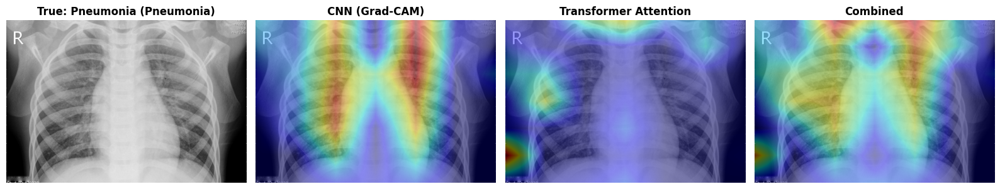

✅ Heatmap saved: /kaggle/working/plots/heatmap_Pneumonia_0.png


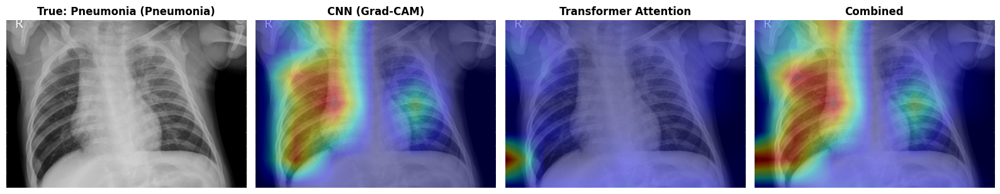

✅ Heatmap saved: /kaggle/working/plots/heatmap_Pneumonia_1.png


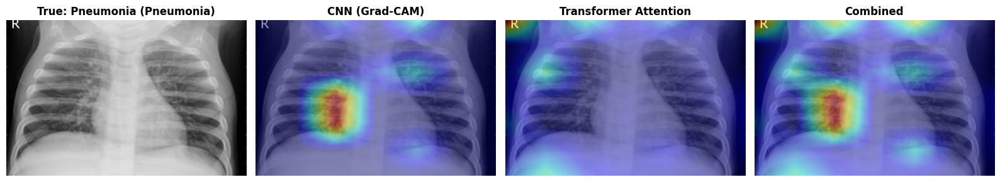

✅ Heatmap saved: /kaggle/working/plots/heatmap_Pneumonia_2.png


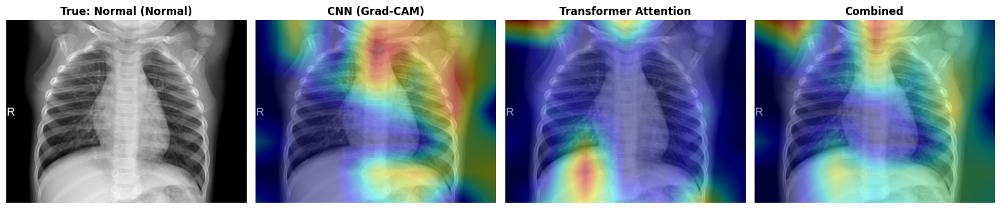

✅ Heatmap saved: /kaggle/working/plots/heatmap_Normal_392.png


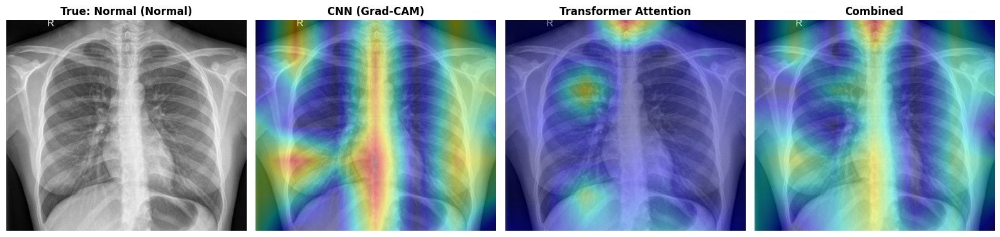

✅ Heatmap saved: /kaggle/working/plots/heatmap_Normal_394.png

✅ All heatmaps generated successfully!
📁 Heatmaps saved in: /kaggle/working/plots

📊 Generated files:
   - heatmap_Pneumonia_0.png
   - heatmap_Normal_1.png
   - heatmap_Normal_394.png
   - heatmap_TB_19.png
   - heatmap_Normal_0.png
   - heatmap_Normal_392.png
   - heatmap_Pneumonia_1.png
   - heatmap_TB_25.png
   - heatmap_Pneumonia_2.png
   - heatmap_TB_7.png


In [1]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  STANDALONE HEATMAP GENERATOR - PNEUMONIA X-ray                                ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import torch, torch.nn as nn, torch.nn.functional as F
import numpy as np, cv2, matplotlib.pyplot as plt
from pathlib import Path
from einops import rearrange
from scipy.ndimage import zoom
import torchvision.models as models
import warnings
from tqdm.auto import tqdm
from sklearn.model_selection import train_test_split
warnings.filterwarnings('ignore')

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
OUTDIR = Path('/kaggle/working')
CKDIR = OUTDIR / 'checkpoints'
PLTDIR = OUTDIR / 'plots'
PLTDIR.mkdir(exist_ok=True)

MEAN = (0.485, 0.456, 0.406)
STD = (0.229, 0.224, 0.225)
class_names = ['Normal', 'Pneumonia']  # Pneumonia classes
VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}

# --- 1. Rebuild Model Architecture (Must match exactly) ---
class DropPath(nn.Module):
    def __init__(self, drop_prob=0.0): super().__init__(); self.drop_prob = drop_prob
    def forward(self, x):
        if self.drop_prob == 0.0 or not self.training: return x
        keep_prob = float(1.0 - self.drop_prob)
        return x * (torch.rand((x.shape[0], 1, 1), dtype=torch.float32, device=x.device) * keep_prob)

class WindowAttention(nn.Module):
    def __init__(self, d_model, nhead, window_size=7, dropout=0.1):
        super().__init__()
        self.nhead, self.window_size, self.head_dim = nhead, window_size, d_model // nhead
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(d_model, d_model * 3); self.proj = nn.Linear(d_model, d_model)
        self.attn_drop, self.proj_drop, self.attn_weights = nn.Dropout(dropout), nn.Dropout(dropout), None
    def forward(self, x, H, W):
        B, N, C = x.shape; x = x.reshape(B, H, W, C)
        pad_h, pad_w = (self.window_size - H % self.window_size) % self.window_size, (self.window_size - W % self.window_size) % self.window_size
        if pad_h > 0 or pad_w > 0: x = F.pad(x, (0, 0, 0, pad_w, 0, pad_h))
        Hp, Wp = x.shape[1], x.shape[2]
        x = x.reshape(B, Hp//self.window_size, self.window_size, Wp//self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(-1, self.window_size**2, C)
        qkv = self.qkv(x).reshape(-1, self.window_size**2, 3, self.nhead, self.head_dim).permute(2,0,3,1,4)
        attn = (qkv[0] @ qkv[1].transpose(-2,-1)) * self.scale; attn = attn.softmax(dim=-1); self.attn_weights = attn.detach()
        x = self.proj_drop(self.proj((self.attn_drop(attn) @ qkv[2]).transpose(1,2).reshape(-1, self.window_size**2, C)))
        x = x.reshape(B, Hp//self.window_size, Wp//self.window_size, self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(B, Hp, Wp, C)
        return x[:, :H, :W, :].reshape(B, -1, C) if pad_h > 0 or pad_w > 0 else x.reshape(B, -1, C)

class TransformerBlockWithWindow(nn.Module):
    def __init__(self, d_model, nhead, ffn_dim, window_size=7, attn_drop=0.1, ffn_drop=0.1, drop_path=0.0):
        super().__init__()
        self.norm1, self.norm2 = nn.LayerNorm(d_model), nn.LayerNorm(d_model)
        self.global_attn = nn.MultiheadAttention(d_model, nhead, dropout=attn_drop, batch_first=True)
        self.window_attn = WindowAttention(d_model, nhead, window_size, attn_drop)
        self.gate = nn.Sequential(nn.Linear(d_model*2, d_model), nn.Sigmoid())
        self.ffn = nn.Sequential(nn.Linear(d_model, ffn_dim), nn.GELU(), nn.Dropout(ffn_drop), nn.Linear(ffn_dim, d_model), nn.Dropout(ffn_drop))
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.attn_weights, self.window_attn_weights = None, None
    def forward(self, x, H, W):
        x_norm = self.norm1(x)
        global_out, global_attn = self.global_attn(x_norm, x_norm, x_norm, need_weights=True)
        self.attn_weights = global_attn.detach()
        window_out = self.window_attn(x_norm[:, 1:, :], H, W)
        self.window_attn_weights = self.window_attn.attn_weights
        gate = self.gate(torch.cat([global_out[:, 1:, :], window_out], dim=-1))
        combined = torch.cat([global_out[:, :1, :], gate * global_out[:, 1:, :] + (1-gate) * window_out], dim=1)
        x = x + self.drop_path(combined)
        return x + self.drop_path(self.ffn(self.norm2(x)))

class ImprovedBackbone(nn.Module):
    def __init__(self): 
        super().__init__()
        self.backbone = models.convnext_base(weights=None)
        self.feature_extractor = self.backbone.features
    def forward(self, x): 
        return self.feature_extractor(x)

class EnhancedHViT(nn.Module):
    def __init__(self, num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536):
        super().__init__()
        self.d_model = d_model
        self.img_size = img_size
        self.backbone = ImprovedBackbone()
        with torch.no_grad():
            _, c, h, w = self.backbone(torch.zeros(1, 3, img_size, img_size)).shape
        self.spatial_h, self.spatial_w = h, w
        self.proj = nn.Sequential(
            nn.Conv2d(c, d_model, 1, bias=False),
            nn.BatchNorm2d(d_model),
            nn.GELU(),
            nn.Conv2d(d_model, d_model, 3, padding=1, bias=False),
            nn.BatchNorm2d(d_model),
            nn.GELU()
        )
        self.norm_proj = nn.LayerNorm(d_model)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, h*w + 1, d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        dpr = [x.item() for x in torch.linspace(0, 0.15, n_layers)]
        self.encoder = nn.ModuleList([
            TransformerBlockWithWindow(d_model, nhead, dim_ffn, min(7, h, w), drop_path=dpr[i]) 
            for i in range(n_layers)
        ])
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Linear(d_model, d_model//2),
            nn.GELU(),
            nn.Dropout(0.3),
            nn.Linear(d_model//2, d_model//4),
            nn.GELU(),
            nn.Dropout(0.15),
            nn.Linear(d_model//4, num_classes)
        )
    def forward(self, x):
        B = x.size(0)
        tokens = rearrange(self.proj(self.backbone(x)), 'b d h w -> b (h w) d')
        tokens = self.norm_proj(tokens)
        tokens = torch.cat([self.cls_token.expand(B,-1,-1), tokens], dim=1) + self.pos_embed
        for block in self.encoder:
            tokens = block(tokens, self.spatial_h, self.spatial_w)
        return self.head(self.norm(tokens)[:, 0])
    
    def get_attentions(self):
        g, w = [], []
        for b in self.encoder:
            if b.attn_weights is not None:
                g.append(b.attn_weights)
            if b.window_attn_weights is not None:
                w.append(b.window_attn_weights)
        return g, w

# --- 2. Load Model ---
print("📦 Rebuilding Pneumonia model and loading weights...")
model = EnhancedHViT(num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536).to(DEVICE)

# Load weights
checkpoint_path = CKDIR / 'best_model.pth'
if checkpoint_path.exists():
    model.load_state_dict(torch.load(checkpoint_path, map_location=DEVICE, weights_only=False)['model'])
    print(f"✅ Model loaded from: {checkpoint_path}")
else:
    print(f"❌ Checkpoint not found at: {checkpoint_path}")
    print("Please train the Pneumonia model first or check the path.")
    raise FileNotFoundError("Model checkpoint not found!")

model.eval()
print("✅ Model loaded successfully!")

# --- 3. Heatmap Logic ---
def isolate_tumor(heatmap, percentile=40):
    """Isolate the most relevant regions in the heatmap."""
    if heatmap is None: 
        return None
    threshold = np.percentile(heatmap, percentile)
    masked = np.where(heatmap > threshold, heatmap, 0.0)
    if masked.max() > masked.min():
        return (masked - masked.min()) / (masked.max() - masked.min() + 1e-8)
    return np.zeros_like(heatmap)

class HeatmapGenerator:
    def __init__(self, model):
        self.model = model.to(DEVICE)
        self.model.eval()
        self.cnn_f, self.cnn_g = None, None
        self.img_size = getattr(model, 'img_size', 224)
        
        # Find last conv layer for Grad-CAM
        last_conv = None
        for m in self.model.backbone.feature_extractor.modules():
            if isinstance(m, nn.Conv2d):
                last_conv = m
        
        if last_conv:
            last_conv.register_forward_hook(lambda m, i, o: setattr(self, 'cnn_f', o.detach()))
            last_conv.register_backward_hook(lambda m, gi, go: setattr(self, 'cnn_g', (go[0] if isinstance(go, (tuple, list)) else go).detach()))
            print("✅ Grad-CAM hooks registered")
        else:
            print("⚠️ No Conv2d found for Grad-CAM")
    
    def get_cnn(self, x, target):
        """Generate Grad-CAM heatmap."""
        out = self.model(x)
        self.model.zero_grad()
        
        oh = torch.zeros_like(out)
        oh[0, target] = 1
        out.backward(gradient=oh, retain_graph=True)
        
        if self.cnn_f is None:
            return None
        
        weights = self.cnn_g.mean(dim=(2, 3), keepdim=True)
        cam = F.relu((weights * self.cnn_f).sum(1)).squeeze().cpu().numpy()
        
        if cam.max() > cam.min():
            return (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam
    
    def get_attn(self, x):
        """Extract attention maps from transformer."""
        with torch.no_grad():
            self.model(x)
        
        g, _ = self.model.get_attentions()
        if not g:
            return None
        
        a = g[-1]  # Use last layer's attention
        if a.dim() == 3:
            a = a[0, 0, 1:].cpu().numpy()
        else:
            a = a[0, :, 0, 1:].mean(0).cpu().numpy()
        
        a = a.reshape(self.model.spatial_h, self.model.spatial_w)
        if a.max() > a.min():
            return (a - a.min()) / (a.max() - a.min() + 1e-8)
        return a
    
    def draw(self, img_path, target, names, save_path, target_class_name=None):
        """Generate and save heatmap visualization."""
        # Load and preprocess image
        img = cv2.imread(str(img_path))
        if img is None:
            print(f"❌ Could not read image: {img_path}")
            return
        
        rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        sz = rgb.shape[:2]
        
        # Preprocess for model
        t = torch.from_numpy(cv2.resize(rgb, (self.img_size, self.img_size))).float().permute(2,0,1)/255.0
        t = ((t - torch.tensor(MEAN).view(3,1,1)) / torch.tensor(STD).view(3,1,1)).unsqueeze(0).to(DEVICE)
        
        # Generate heatmaps
        c = self.get_cnn(t.clone(), target)
        a = self.get_attn(t.clone())
        
        # Combine heatmaps
        comb = None
        if c is not None and a is not None:
            if a.shape != c.shape:
                a = zoom(a, (c.shape[0]/a.shape[0], c.shape[1]/a.shape[1]), order=1)
            comb = 0.5 * c + 0.5 * a
            if comb.max() > comb.min():
                comb = (comb - comb.min()) / (comb.max() - comb.min() + 1e-8)
        
        # Isolate tumor regions
        c = isolate_tumor(c, 40)
        a = isolate_tumor(a, 35)
        comb = isolate_tumor(comb, 35)
        
        # Create visualization
        fig, axes = plt.subplots(1, 4, figsize=(16, 4))
        
        # Original image
        axes[0].imshow(rgb, cmap='gray')
        status = f"True: {names[target]}"
        if target_class_name:
            status += f" ({target_class_name})"
        axes[0].set_title(status, fontsize=12, fontweight='bold')
        axes[0].axis('off')
        
        # Heatmaps
        heatmaps = [c, a, comb]
        titles = ['CNN (Grad-CAM)', 'Transformer Attention', 'Combined']
        
        for i, (hmap, title) in enumerate(zip(heatmaps, titles)):
            if hmap is not None:
                # Resize heatmap to original image size
                hr = zoom(hmap, (sz[0]/hmap.shape[0], sz[1]/hmap.shape[1]), order=1)
                colored = (plt.cm.jet(hr)[:,:,:3] * 255).astype(np.uint8)
                overlay = cv2.addWeighted(rgb, 0.6, colored, 0.4, 0)
                axes[i+1].imshow(overlay)
            else:
                axes[i+1].imshow(rgb, cmap='gray')
            axes[i+1].set_title(title, fontsize=12, fontweight='bold')
            axes[i+1].axis('off')
        
        plt.tight_layout()
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        plt.show()
        print(f"✅ Heatmap saved: {save_path}")

# --- 4. Load Pneumonia Dataset and Find Test Images ---
print("\n📂 Loading Pneumonia dataset and finding test images...")

# Load dataset - Try multiple common paths
samples = []
base_paths = [
    Path('/kaggle/input/datasets/nikitachaulagain/dataasets/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray'),
    Path('/kaggle/input/chest-xray-pneumonia/chest_xray'),
    Path('/kaggle/input/pneumonia-dataset/chest_xray'),
    Path('/kaggle/input/pneumonia-chest-x-ray-dataset/chest_xray'),
]

base = None
for path in base_paths:
    if path.exists():
        base = path
        print(f"✅ Found dataset at: {base}")
        break

if base is None:
    print("❌ Pneumonia dataset not found! Please check the path.")
    print("\n📁 Available directories in /kaggle/input/:")
    input_dir = Path('/kaggle/input')
    if input_dir.exists():
        for item in input_dir.iterdir():
            print(f"  - {item.name}")
            # Check subdirectories
            if item.is_dir():
                for sub in item.iterdir():
                    if sub.is_dir():
                        print(f"    └─ {sub.name}")
    exit()

# Collect images from dataset
print("📂 Scanning dataset...")

# Try to find test folder
test_folders = [
    base / 'test',
    base / 'Test',
    base,
]

test_base = None
for folder in test_folders:
    if folder.exists():
        test_base = folder
        print(f"✅ Using test folder: {test_base}")
        break

if test_base is None:
    test_base = base
    print(f"⚠️ Using base folder: {test_base}")

# Collect images from the test folder
for folder in test_base.iterdir():
    if not folder.is_dir():
        continue
    
    folder_name = folder.name.lower()
    
    # Map folder names to classes
    if 'normal' in folder_name:
        cname = 'Normal'
    elif 'pneumonia' in folder_name or 'pneum' in folder_name or 'covid' in folder_name:
        cname = 'Pneumonia'
    elif 'bacterial' in folder_name or 'viral' in folder_name:
        cname = 'Pneumonia'
    else:
        # Skip unknown folders
        continue
    
    count = 0
    for ext in VALID_EXTS:
        for p in folder.rglob(f'*{ext}'):
            samples.append((str(p), cname))
            count += 1
    if count > 0:
        print(f"   {cname}: {count} images")

print(f"✅ Total images found: {len(samples)}")

if len(samples) == 0:
    print("❌ No images found! Trying to find images recursively...")
    # Fallback: search all images and infer class from parent folder
    for ext in VALID_EXTS:
        for p in test_base.rglob(f'*{ext}'):
            parent = p.parent.name.lower()
            if 'normal' in parent:
                cname = 'Normal'
            elif 'pneumonia' in parent or 'pneum' in parent or 'covid' in parent:
                cname = 'Pneumonia'
            else:
                cname = 'Unknown'
            samples.append((str(p), cname))
    print(f"✅ Fallback found {len(samples)} images")

# Create test split
if len(samples) > 0:
    labels = [class_names.index(l) for l in [s[1] for s in samples] if l in class_names]
    
    # Filter out unknown classes
    filtered_samples = [(p, l) for p, l in samples if l in class_names]
    labels = [class_names.index(l) for _, l in filtered_samples]
    
    print(f"📊 Filtered to {len(filtered_samples)} images with known classes")
    
    if len(filtered_samples) > 0:
        # Use all as test set
        test_s = filtered_samples
        print(f"📊 Test set size: {len(test_s)} images")
    else:
        print("❌ No valid images found with known classes")
        exit()
else:
    print("❌ No samples loaded!")
    exit()

# --- 5. Run Model on Test Set to Find Correct Predictions ---
print("\n🔍 Finding correct predictions for heatmap...")

all_p, all_l = [], []
hm = HeatmapGenerator(model)

for p, l in tqdm(test_s, desc="Evaluating test images"):
    img = cv2.imread(p)
    if img is None:
        continue
    
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    t = torch.from_numpy(cv2.resize(rgb, (224, 224))).float().permute(2,0,1)/255.0
    t = ((t - torch.tensor(MEAN).view(3,1,1)) / torch.tensor(STD).view(3,1,1)).unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        out = model(t)
    
    all_p.append(out.argmax(1).item())
    all_l.append(class_names.index(l))

# Calculate accuracy
correct = sum(1 for p,l in zip(all_p, all_l) if p == l)
print(f"\n📊 Test Accuracy: {correct/len(all_p)*100:.2f}%")

# --- 6. Generate Heatmaps for Correctly Classified Cases ---
print("\n🔥 Generating Heatmaps for Pneumonia Cases...")

# Get correctly classified Pneumonia images
pneumonia_correct = [i for i, (p, l) in enumerate(zip(all_p, all_l)) 
                     if p == l and l == class_names.index('Pneumonia')]

# Also get correctly classified Normal images for comparison
normal_correct = [i for i, (p, l) in enumerate(zip(all_p, all_l)) 
                  if p == l and l == class_names.index('Normal')]

print(f"Found {len(pneumonia_correct)} correct Pneumonia predictions and {len(normal_correct)} correct Normal predictions")

# Generate Pneumonia heatmaps
if pneumonia_correct:
    for idx in pneumonia_correct[:3]:  # Generate up to 3 Pneumonia heatmaps
        class_idx = class_names.index('Pneumonia')
        hm.draw(test_s[idx][0], class_idx, class_names, 
                PLTDIR / f'heatmap_Pneumonia_{idx}.png',
                target_class_name='Pneumonia')
else:
    print("⚠️ No correct Pneumonia predictions found. Generating for any correct prediction...")
    # Fallback: use any correct prediction
    correct_indices = [i for i, (p, l) in enumerate(zip(all_p, all_l)) if p == l]
    if correct_indices:
        for idx in correct_indices[:3]:
            class_idx = all_l[idx]
            hm.draw(test_s[idx][0], class_idx, class_names, 
                    PLTDIR / f'heatmap_{class_names[class_idx]}_{idx}.png',
                    target_class_name=class_names[class_idx])

# Generate Normal heatmaps for comparison
for idx in normal_correct[:2]:  # Generate 2 Normal heatmaps
    class_idx = class_names.index('Normal')
    hm.draw(test_s[idx][0], class_idx, class_names, 
            PLTDIR / f'heatmap_Normal_{idx}.png',
            target_class_name='Normal')

print("\n✅ All heatmaps generated successfully!")
print(f"📁 Heatmaps saved in: {PLTDIR}")
print("\n📊 Generated files:")
for f in PLTDIR.glob('heatmap_*.png'):
    print(f"   - {f.name}")

📦 Rebuilding Pneumonia model and loading weights...
✅ Model loaded from: /kaggle/working/checkpoints/best_model.pth
📂 Scanning Pneumonia X-Ray dataset...
✅ Found dataset at: /kaggle/input/datasets/nikitachaulagain/dataasets/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray

📊 COMPREHENSIVE PNEUMONIA X-RAY DATASET ANALYSIS REPORT

🔹 Total Images: 5856 | Classes: 2
🔹 Split: 70% Train (4099) / 15% Val (878) / 15% Test (879)
   - Normal      :  1583 images (27.0%)
   - Pneumonia   :  4273 images (73.0%)

🧠 Running inference on Test Set...


Predicting:   0%|          | 0/879 [00:00<?, ?it/s]


📊 COMPREHENSIVE EVALUATION METRICS

🎯 PRIMARY METRICS:
   Accuracy:  0.9454
   F1-Score:  0.9623
   AUC-ROC:   0.9858
   AP Score:  0.9944

📈 ADDITIONAL METRICS:
   MCC:       0.8634
   Cohen's Kappa: 0.8632
   Log Loss:  0.1497
   Brier Score: 0.0394

🔬 PER-CLASS METRICS (Pneumonia vs Normal):
   Sensitivity (Recall): 0.9563
   Specificity:          0.9160
   Precision:            0.9684
   NPV:                  0.8862
   FPR:                  0.0840
   FNR:                  0.0437

📊 CONFUSION MATRIX:
                    Normal  Pneumonia
Normal                 218         20
Pneumonia               28        613

📋 CLASSIFICATION REPORT:
              precision    recall  f1-score   support

      Normal       0.89      0.92      0.90       238
   Pneumonia       0.97      0.96      0.96       641

    accuracy                           0.95       879
   macro avg       0.93      0.94      0.93       879
weighted avg       0.95      0.95      0.95       879



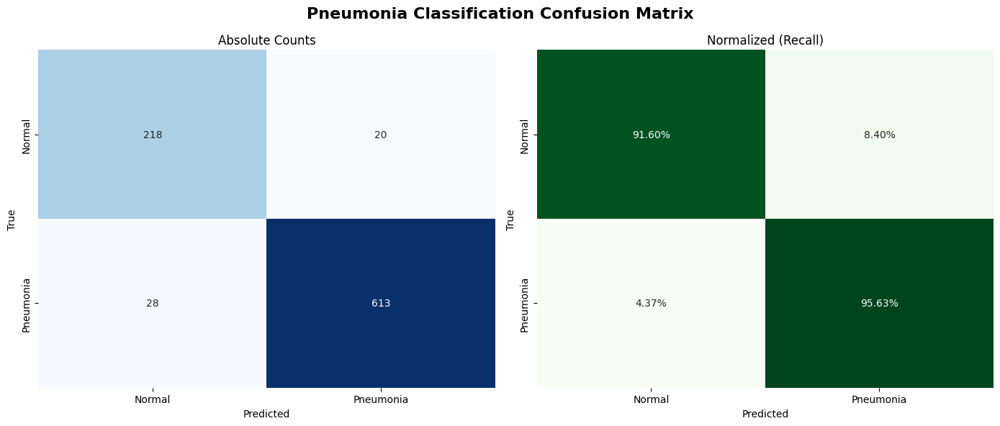

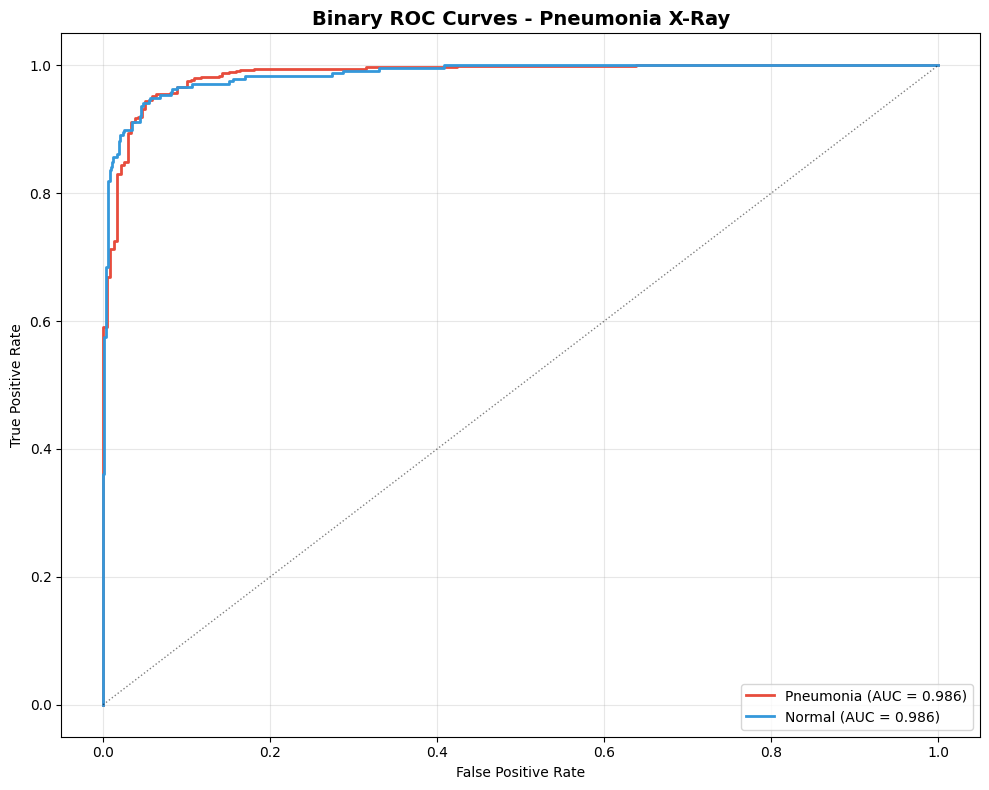

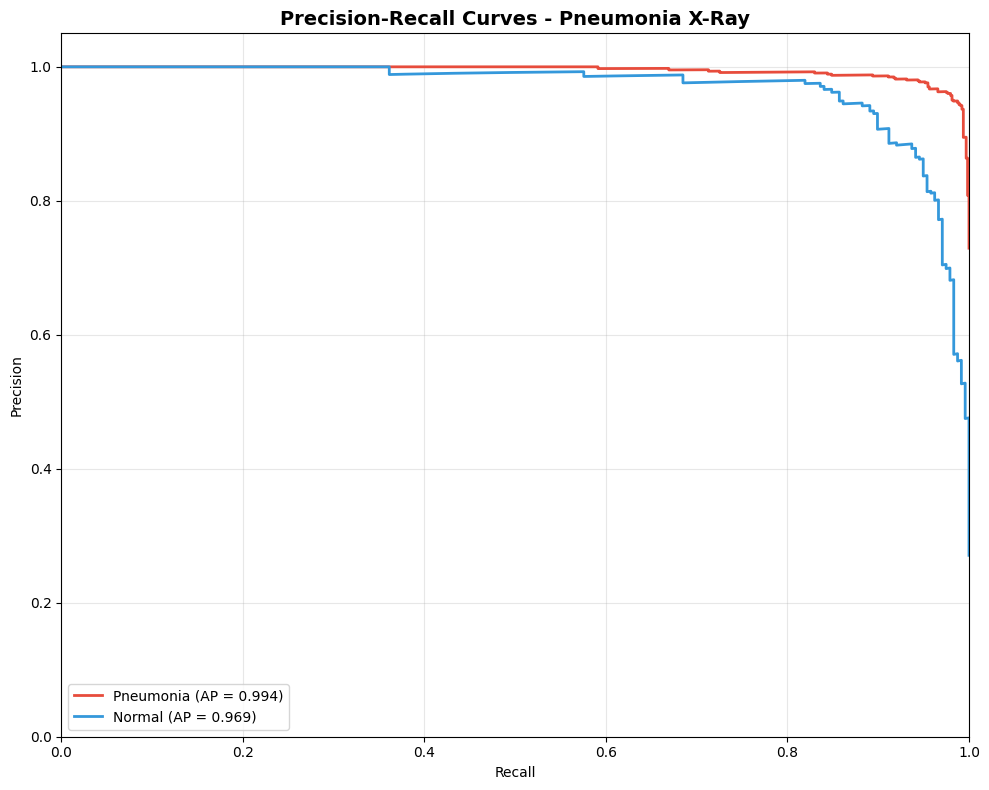

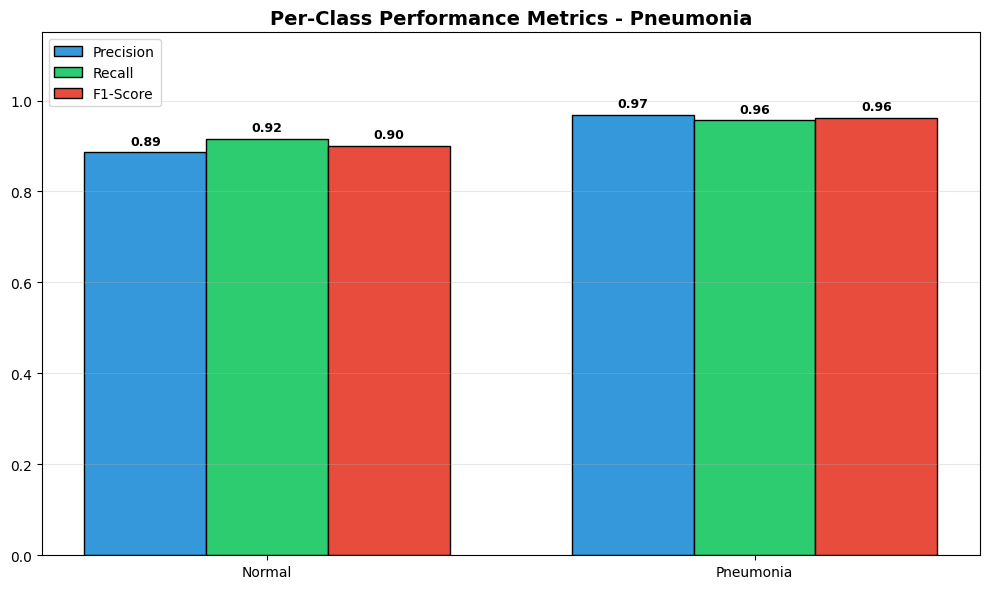

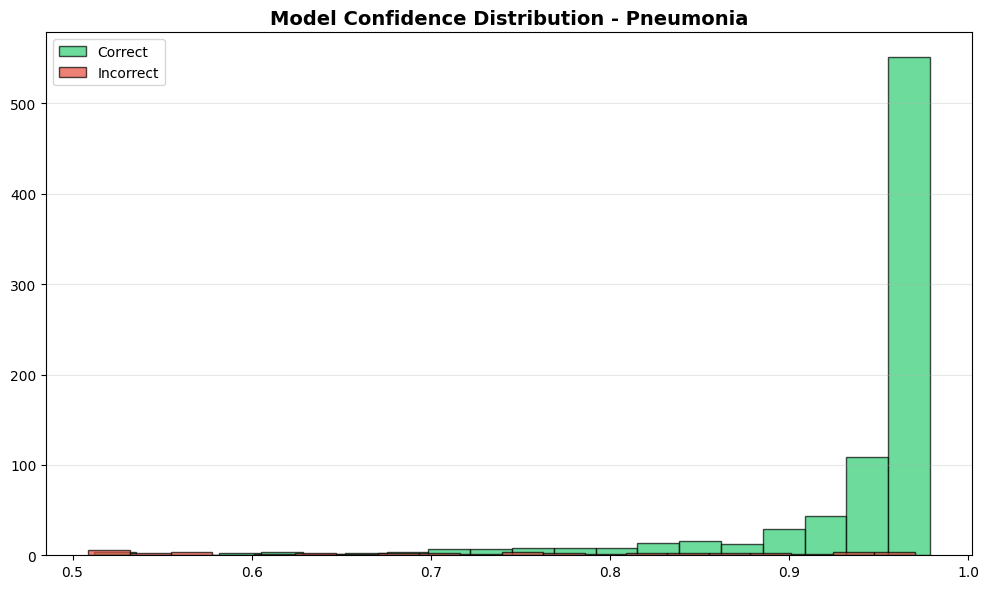

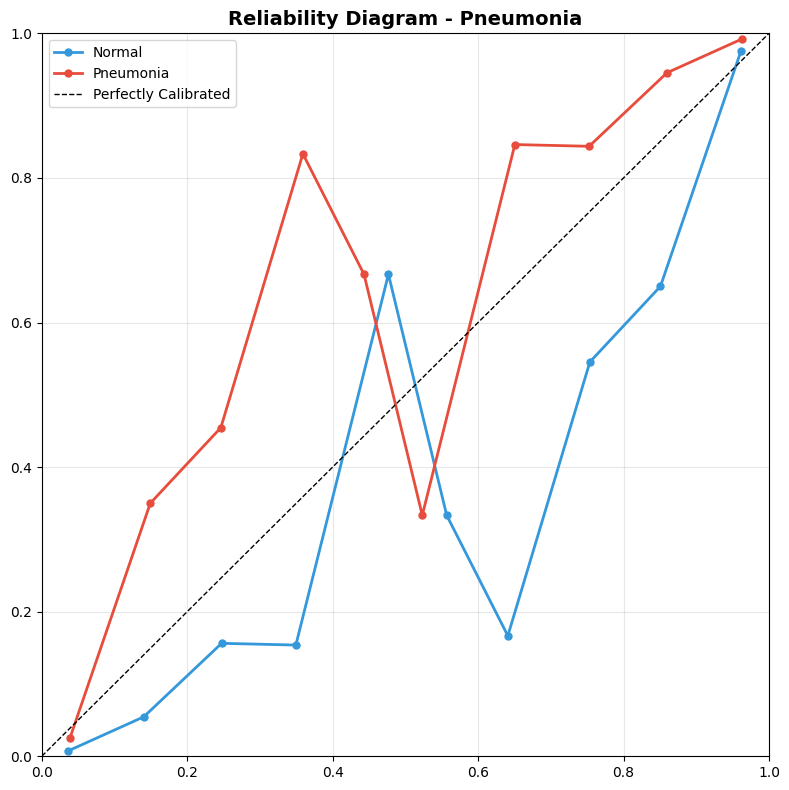

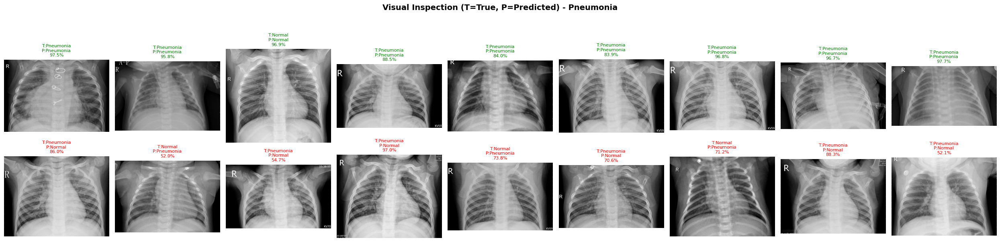

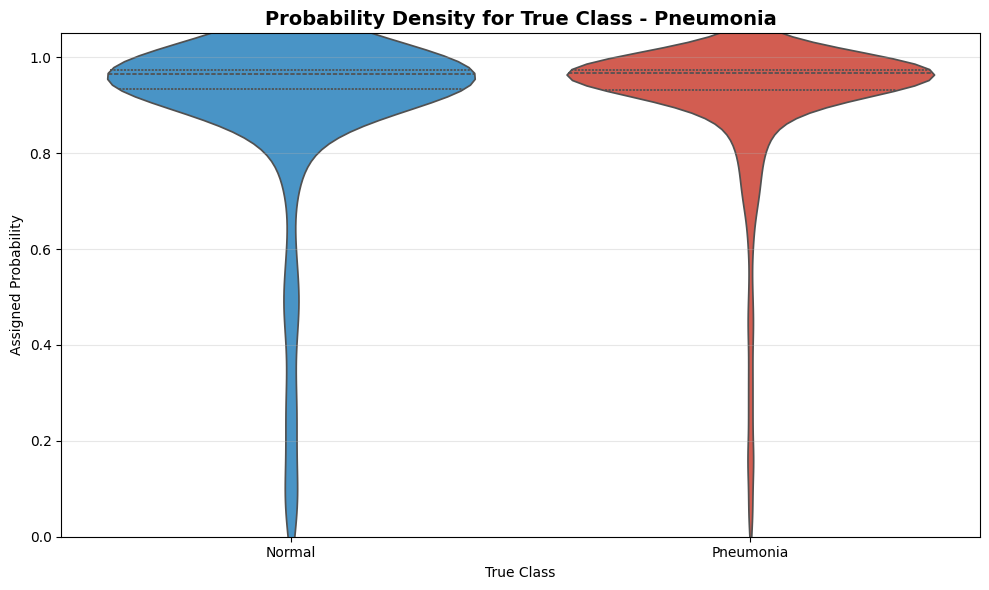

⏳ Extracting t-SNE features...


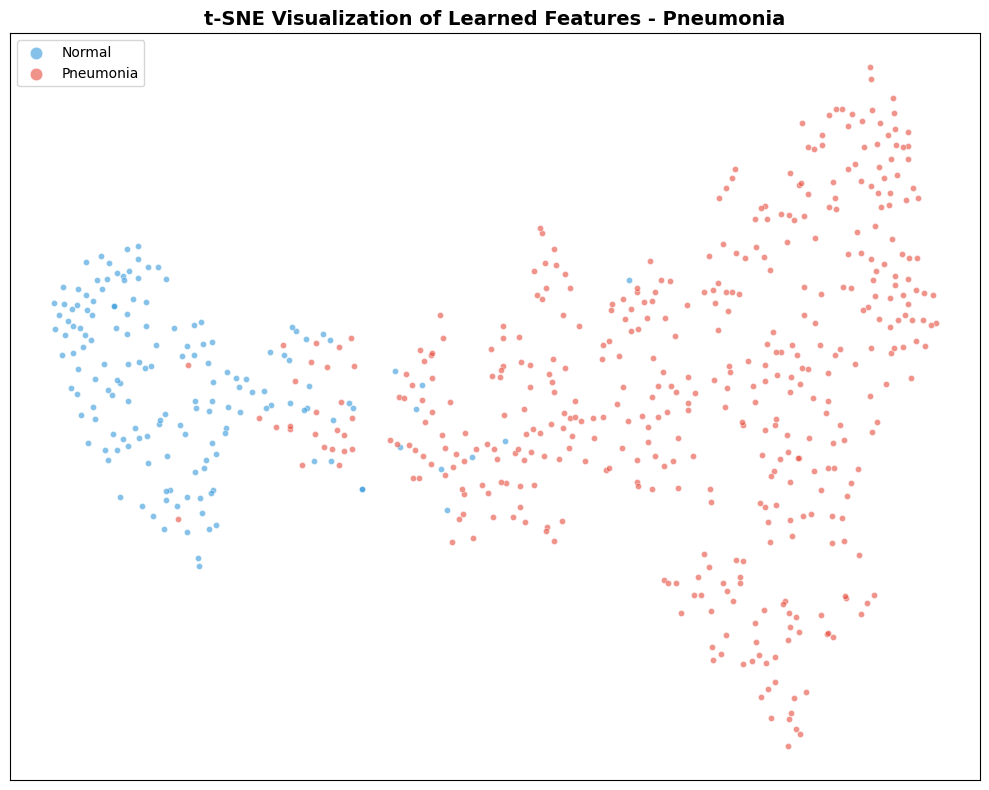

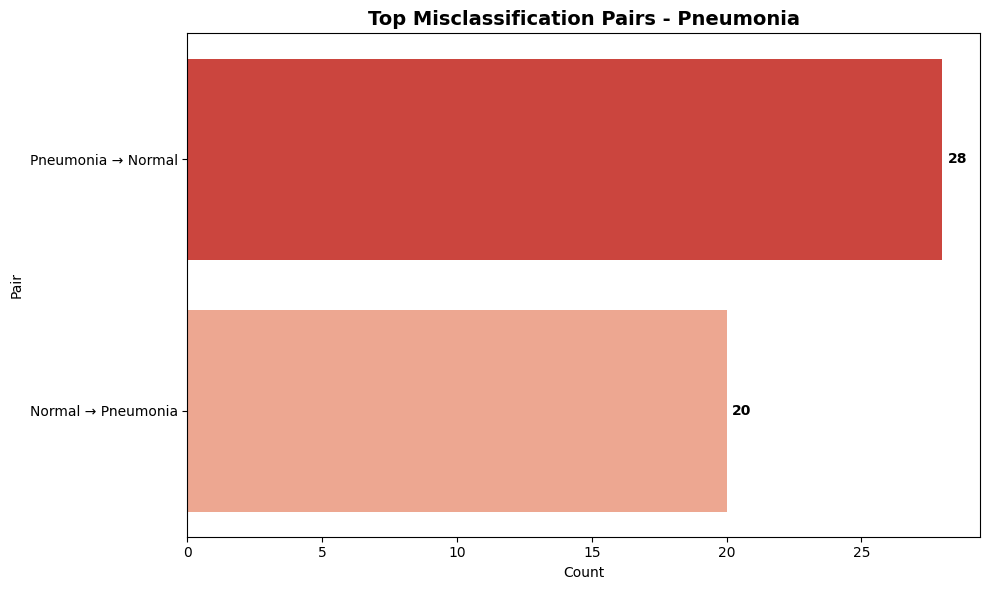

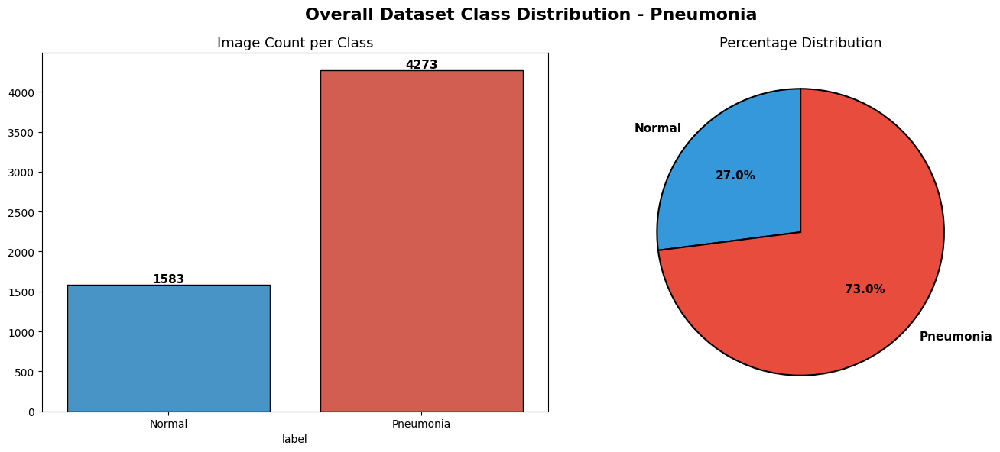

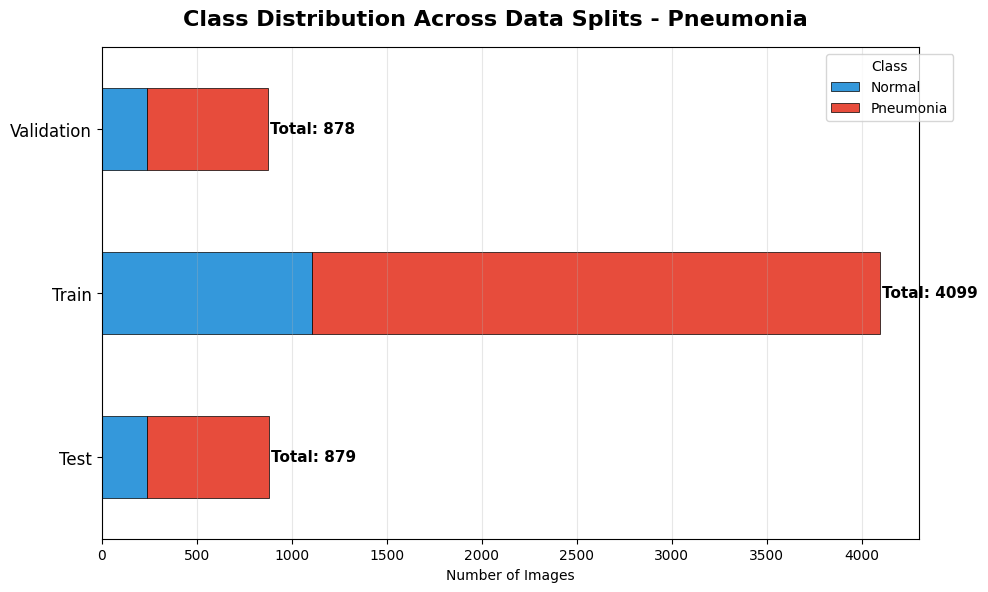

⏳ Computing average X-Ray per class...


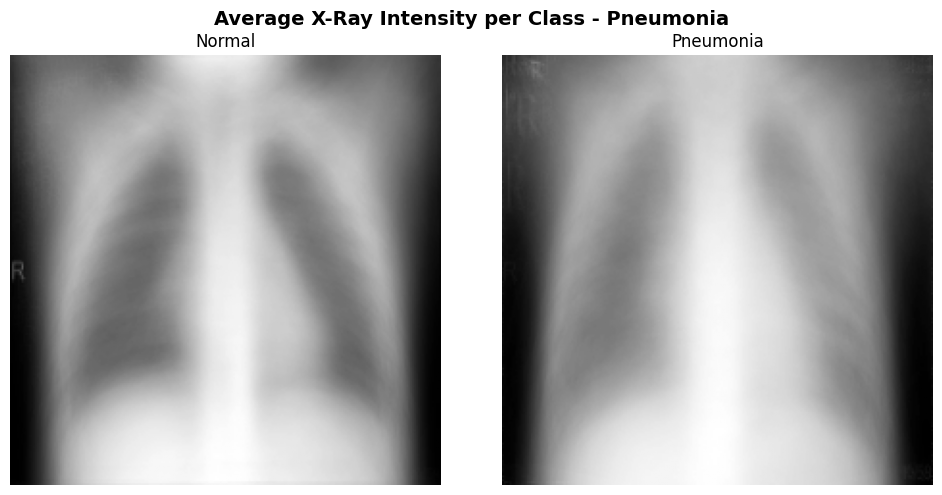

⏳ Sampling pixel intensities...


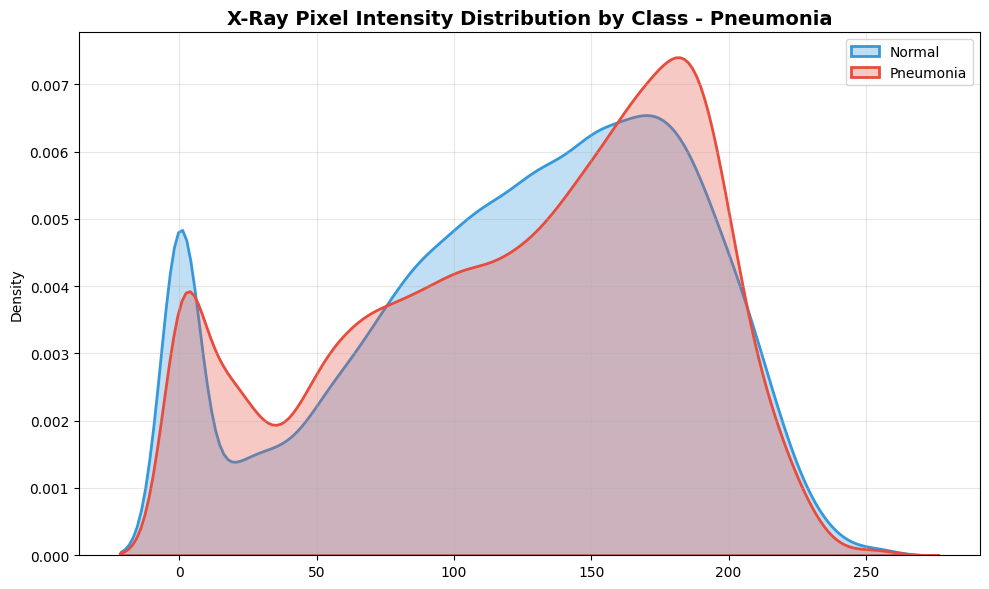

⏳ Checking image dimensions...


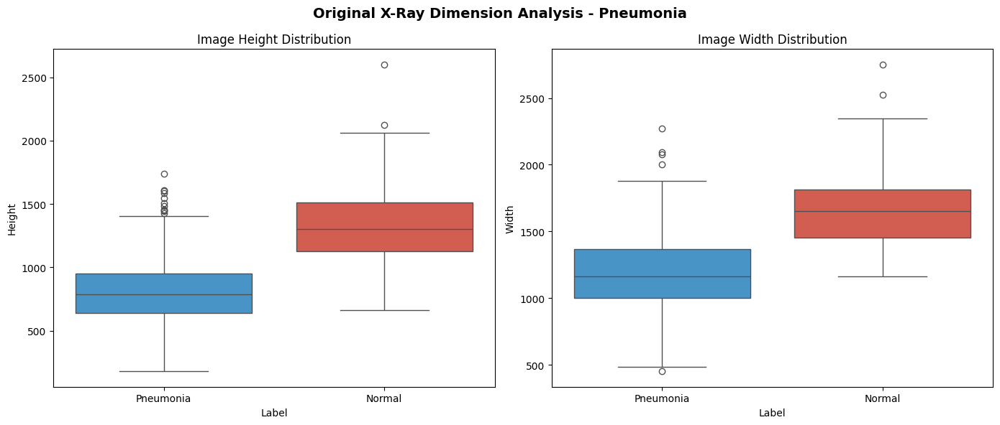


🔥 Generating Grad-CAM Overlays...


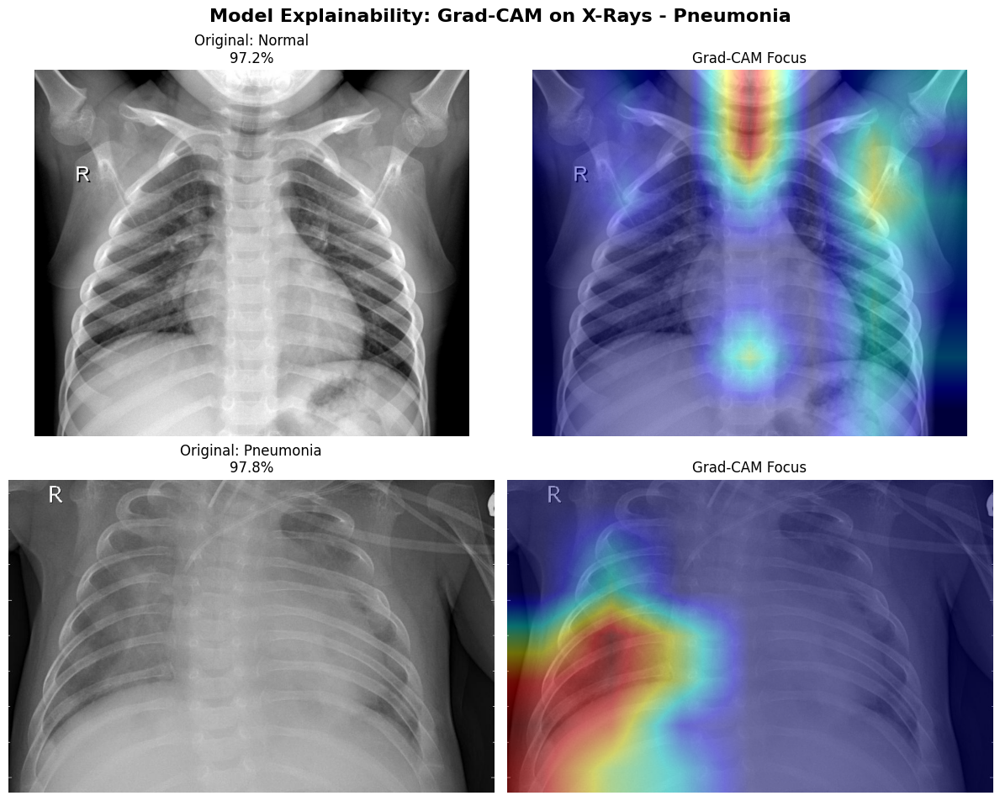


🚀 Analyzing Class-wise Confidence Thresholds...


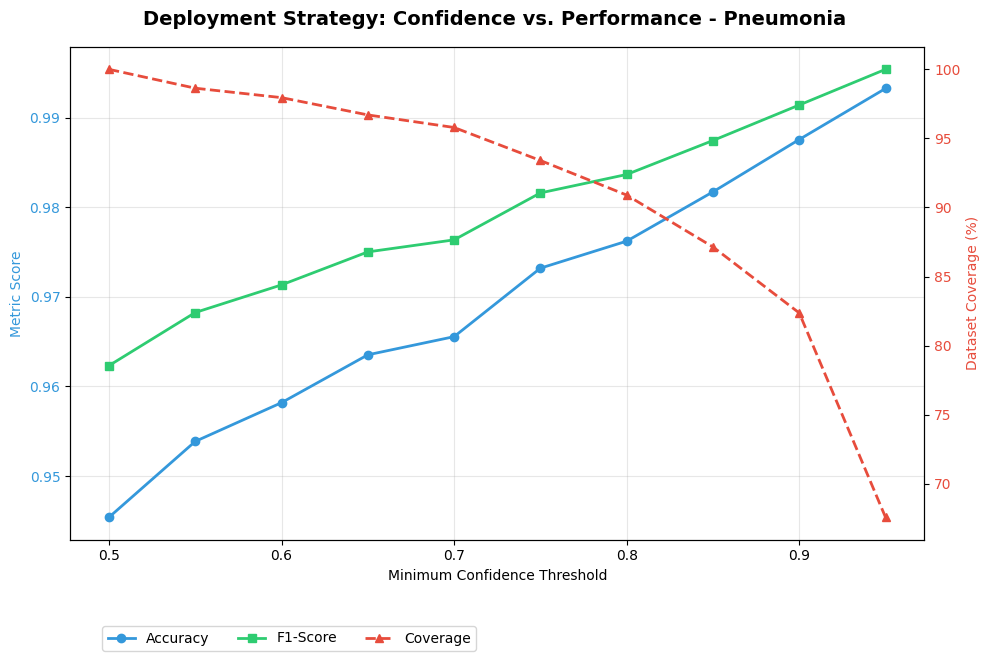

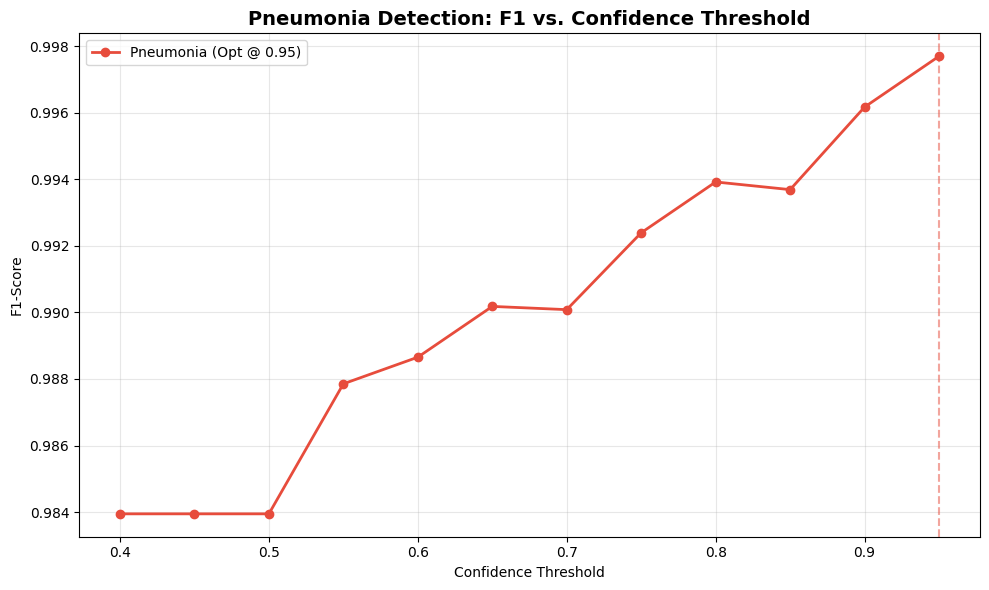


🧠 Extracting Deep Feature Maps...


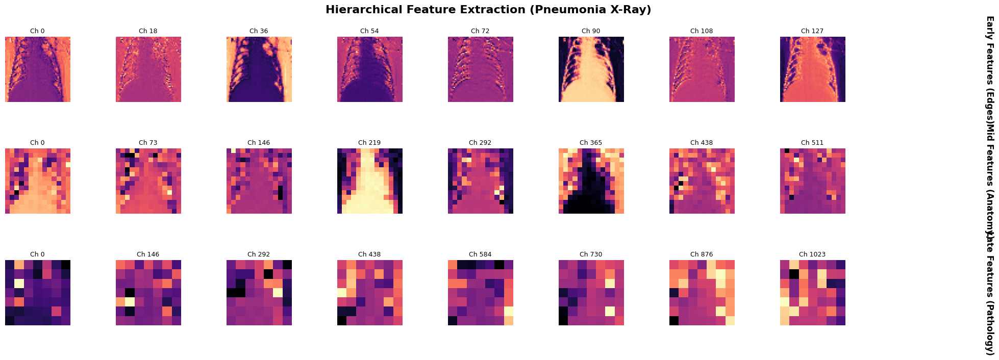


✅ ALL 20 PLOTS GENERATED SUCCESSFULLY FOR PNEUMONIA X-RAYS!
📁 Location: /kaggle/working/plots/pneumonia

📊 FINAL EVALUATION SUMMARY:
   ✅ Test Accuracy:  0.9454
   ✅ F1-Score:       0.9623
   ✅ AUC-ROC:        0.9858
   ✅ AP Score:       0.9944
   ✅ MCC:            0.8634
   ✅ Sensitivity:    0.9563
   ✅ Specificity:    0.9160

📂 Files saved:
   - 10_tsne_features.png
   - 11_error_analysis.png
   - 12_class_distribution.png
   - 13_split_distribution.png
   - 14_average_xray.png
   - 15_pixel_intensity.png
   - 16_image_dimensions.png
   - 17_xai_gradcam.png
   - 18_deployment_thresholds.png
   - 19_class_specific_thresholds.png
   - 20_feature_maps_hierarchy.png
   - 2_confusion_matrices.png
   - 3_roc_curves.png
   - 4_precision_recall.png
   - 5_per_class_metrics.png
   - 6_confidence_distribution.png
   - 7_calibration_curve.png
   - 8_sample_predictions.png
   - 9_probability_violin.png


In [7]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  ULTIMATE MEGA CELL: ALL 20 PLOTS + EVALUATION METRICS (PNEUMONIA X-RAY)       ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import os, time, random, copy, warnings
from pathlib import Path
from collections import Counter
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns, cv2
from tqdm.auto import tqdm
from scipy.ndimage import zoom
import torch, torch.nn as nn, torch.nn.functional as F
import torchvision.models as models
from sklearn.metrics import (accuracy_score, f1_score, roc_curve, auc, roc_auc_score,
                             confusion_matrix, classification_report, precision_recall_curve, 
                             average_precision_score, matthews_corrcoef, cohen_kappa_score, 
                             log_loss, brier_score_loss)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.manifold import TSNE
from torch.cuda.amp import autocast
from einops import rearrange

warnings.filterwarnings('ignore')
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
OUTDIR = Path('/kaggle/working')
PLTDIR = OUTDIR / 'plots/pneumonia'; PLTDIR.mkdir(exist_ok=True, parents=True)
CKDIR = OUTDIR / 'checkpoints'
MEAN, STD = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
class_names = ['Normal', 'Pneumonia']
colors = ['#3498db', '#e74c3c']
VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}

# ─── 1. MODEL ARCHITECTURE ──────────────────────────────────────────────────────
class DropPath(nn.Module):
    def __init__(self, drop_prob=0.0): 
        super().__init__(); 
        self.drop_prob = drop_prob
    def forward(self, x):
        if self.drop_prob == 0.0 or not self.training: 
            return x
        return x * (torch.rand((x.shape[0], 1, 1), dtype=torch.float32, device=x.device) * float(1.0 - self.drop_prob))

class WindowAttention(nn.Module):
    def __init__(self, d_model, nhead, window_size=7, dropout=0.1):
        super().__init__()
        self.nhead, self.window_size, self.head_dim = nhead, window_size, d_model // nhead
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(d_model, d_model * 3)
        self.proj = nn.Linear(d_model, d_model)
        self.attn_drop, self.proj_drop, self.attn_weights = nn.Dropout(dropout), nn.Dropout(dropout), None
    def forward(self, x, H, W):
        B, N, C = x.shape
        x = x.reshape(B, H, W, C)
        pad_h, pad_w = (self.window_size - H % self.window_size) % self.window_size, (self.window_size - W % self.window_size) % self.window_size
        if pad_h > 0 or pad_w > 0: 
            x = F.pad(x, (0, 0, 0, pad_w, 0, pad_h))
        Hp, Wp = x.shape[1], x.shape[2]
        x = x.reshape(B, Hp//self.window_size, self.window_size, Wp//self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(-1, self.window_size**2, C)
        qkv = self.qkv(x).reshape(-1, self.window_size**2, 3, self.nhead, self.head_dim).permute(2,0,3,1,4)
        attn = (qkv[0] @ qkv[1].transpose(-2,-1)) * self.scale
        attn = attn.softmax(dim=-1)
        self.attn_weights = attn.detach()
        x = self.proj_drop(self.proj((self.attn_drop(attn) @ qkv[2]).transpose(1,2).reshape(-1, self.window_size**2, C)))
        x = x.reshape(B, Hp//self.window_size, Wp//self.window_size, self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(B, Hp, Wp, C)
        return x[:, :H, :W, :].reshape(B, -1, C) if pad_h > 0 or pad_w > 0 else x.reshape(B, -1, C)

class TransformerBlockWithWindow(nn.Module):
    def __init__(self, d_model, nhead, ffn_dim, window_size=7, attn_drop=0.1, ffn_drop=0.1, drop_path=0.0):
        super().__init__()
        self.norm1, self.norm2 = nn.LayerNorm(d_model), nn.LayerNorm(d_model)
        self.global_attn = nn.MultiheadAttention(d_model, nhead, dropout=attn_drop, batch_first=True)
        self.window_attn = WindowAttention(d_model, nhead, window_size, attn_drop)
        self.gate = nn.Sequential(nn.Linear(d_model*2, d_model), nn.Sigmoid())
        self.ffn = nn.Sequential(nn.Linear(d_model, ffn_dim), nn.GELU(), nn.Dropout(ffn_drop), nn.Linear(ffn_dim, d_model), nn.Dropout(ffn_drop))
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.attn_weights, self.window_attn_weights = None, None
    def forward(self, x, H, W):
        x_norm = self.norm1(x)
        global_out, global_attn = self.global_attn(x_norm, x_norm, x_norm, need_weights=True)
        self.attn_weights = global_attn.detach()
        window_out = self.window_attn(x_norm[:, 1:, :], H, W)
        self.window_attn_weights = self.window_attn.attn_weights
        gate = self.gate(torch.cat([global_out[:, 1:, :], window_out], dim=-1))
        combined = torch.cat([global_out[:, :1, :], gate * global_out[:, 1:, :] + (1-gate) * window_out], dim=1)
        x = x + self.drop_path(combined)
        return x + self.drop_path(self.ffn(self.norm2(x)))

class ImprovedBackbone(nn.Module):
    def __init__(self): 
        super().__init__()
        self.backbone = models.convnext_base(weights=None)
        self.feature_extractor = self.backbone.features
    def forward(self, x): 
        return self.feature_extractor(x)

class EnhancedHViT(nn.Module):
    def __init__(self, num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536):
        super().__init__()
        self.d_model = d_model
        self.img_size = img_size
        self.backbone = ImprovedBackbone()
        with torch.no_grad():
            _, c, h, w = self.backbone(torch.zeros(1, 3, img_size, img_size)).shape
        self.spatial_h, self.spatial_w = h, w
        self.proj = nn.Sequential(
            nn.Conv2d(c, d_model, 1, bias=False),
            nn.BatchNorm2d(d_model),
            nn.GELU(),
            nn.Conv2d(d_model, d_model, 3, padding=1, bias=False),
            nn.BatchNorm2d(d_model),
            nn.GELU()
        )
        self.norm_proj = nn.LayerNorm(d_model)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, h*w + 1, d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        dpr = [x.item() for x in torch.linspace(0, 0.15, n_layers)]
        self.encoder = nn.ModuleList([
            TransformerBlockWithWindow(d_model, nhead, dim_ffn, min(7, h, w), drop_path=dpr[i]) 
            for i in range(n_layers)
        ])
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Linear(d_model, d_model//2),
            nn.GELU(),
            nn.Dropout(0.3),
            nn.Linear(d_model//2, d_model//4),
            nn.GELU(),
            nn.Dropout(0.15),
            nn.Linear(d_model//4, num_classes)
        )
    def forward(self, x):
        B = x.size(0)
        tokens = rearrange(self.proj(self.backbone(x)), 'b d h w -> b (h w) d')
        tokens = self.norm_proj(tokens)
        tokens = torch.cat([self.cls_token.expand(B,-1,-1), tokens], dim=1) + self.pos_embed
        for block in self.encoder:
            tokens = block(tokens, self.spatial_h, self.spatial_w)
        return self.head(self.norm(tokens)[:, 0])
    def get_attentions(self):
        g, w = [], []
        for b in self.encoder:
            if b.attn_weights is not None: 
                g.append(b.attn_weights)
            if b.window_attn_weights is not None: 
                w.append(b.window_attn_weights)
        return g, w

# ─── 2. LOAD WEIGHTS & SPLIT DATA ────────────────────────────────────────────────
print("📦 Rebuilding Pneumonia model and loading weights...")
model = EnhancedHViT(num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536).to(DEVICE)

# Load weights
checkpoint_path = CKDIR / 'best_model.pth'
if checkpoint_path.exists():
    model.load_state_dict(torch.load(checkpoint_path, map_location=DEVICE, weights_only=False)['model'])
    print(f"✅ Model loaded from: {checkpoint_path}")
else:
    print(f"❌ Checkpoint not found at: {checkpoint_path}")
    print("Please train the Pneumonia model first.")
    raise FileNotFoundError("Model checkpoint not found!")

model.eval()

print("📂 Scanning Pneumonia X-Ray dataset...")
samples = []

# Try multiple possible paths
possible_paths = [
    Path('/kaggle/input/datasets/nikitachaulagain/dataasets/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray'),
    Path('/kaggle/input/chest-xray-pneumonia/chest_xray'),
    Path('/kaggle/input/pneumonia-chest-xray-dataset/chest_xray'),
    Path('/kaggle/input/pneumonia-dataset/chest_xray'),
]

base = None
for path in possible_paths:
    if path.exists():
        base = path
        print(f"✅ Found dataset at: {base}")
        break

if base is None:
    print("❌ Pneumonia dataset not found!")
    print("Available directories:")
    input_dir = Path('/kaggle/input')
    if input_dir.exists():
        for item in input_dir.iterdir():
            print(f"  - {item.name}")
    exit()

# Collect images from all splits
for split in ['train', 'test', 'val']:
    split_path = base / split
    if not split_path.exists(): 
        continue
    for folder in split_path.iterdir():
        if not folder.is_dir(): 
            continue
        fn = folder.name.lower()
        if 'normal' in fn: 
            cname = 'Normal'
        elif 'pneumonia' in fn: 
            cname = 'Pneumonia'
        else: 
            continue
        for ext in VALID_EXTS:
            for p in folder.rglob(f'*{ext}'): 
                samples.append((str(p), cname))

if not samples:
    print("❌ No images found! Trying recursive search...")
    for ext in VALID_EXTS:
        for p in base.rglob(f'*{ext}'):
            parent = p.parent.name.lower()
            if 'normal' in parent:
                samples.append((str(p), 'Normal'))
            elif 'pneumonia' in parent:
                samples.append((str(p), 'Pneumonia'))

labels = [class_names.index(l) for l in [s[1] for s in samples]]
train_s, temp_s = train_test_split(samples, test_size=0.3, stratify=labels, random_state=42)
val_s, test_s = train_test_split(temp_s, test_size=0.5, stratify=[class_names.index(l) for l in [s[1] for s in temp_s]], random_state=42)
df_all = pd.DataFrame(samples, columns=['path', 'label'])

def get_tensor(img_input):
    if len(img_input.shape) == 2: 
        img_input = np.stack([img_input, img_input, img_input], axis=-1)
    t = torch.from_numpy(cv2.resize(img_input, (224, 224))).float().permute(2,0,1)/255.0
    return ((t - torch.tensor(MEAN).view(3,1,1)) / torch.tensor(STD).view(3,1,1)).unsqueeze(0).to(DEVICE)

print("\n" + "="*60)
print("📊 COMPREHENSIVE PNEUMONIA X-RAY DATASET ANALYSIS REPORT")
print("="*60)
print(f"\n🔹 Total Images: {len(df_all)} | Classes: {len(class_names)}")
print(f"🔹 Split: 70% Train ({len(train_s)}) / 15% Val ({len(val_s)}) / 15% Test ({len(test_s)})")
for cls in class_names:
    count = len(df_all[df_all['label'] == cls])
    print(f"   - {cls:12s}: {count:5d} images ({count/len(df_all)*100:.1f}%)")
print("="*60 + "\n")

# ─── 3. RUN INFERENCE ───────────────────────────────────────────────────────────
print("🧠 Running inference on Test Set...")
all_p, all_l, all_pr = [], [], []
for p, l in tqdm(test_s, desc="Predicting"):
    img = cv2.imread(p, cv2.IMREAD_GRAYSCALE) # ✅ Read X-ray as Grayscale
    if img is None: continue
    with torch.no_grad(): 
        out = model(get_tensor(img))
        pr = F.softmax(out, dim=1)
    all_p.append(out.argmax(1).item())
    all_l.append(class_names.index(l))
    all_pr.append(pr.cpu().numpy()[0])

all_p = np.array(all_p)
all_l = np.array(all_l)
all_pr = np.array(all_pr)

# ✅ FIX: Ensure all_pr has 2 columns for binary classification
if all_pr.shape[1] == 1:
    all_pr = np.concatenate([1 - all_pr, all_pr], axis=1)
    print("✅ Converted sigmoid output to 2-class probabilities")

max_probs = all_pr.max(axis=1)
correct_mask = (all_p == all_l)
labels_bin = label_binarize(all_l, classes=list(range(len(class_names))))

# ─── 4. COMPREHENSIVE EVALUATION METRICS ──────────────────────────────────────
print("\n" + "="*60)
print("📊 COMPREHENSIVE EVALUATION METRICS")
print("="*60)

# Basic metrics
test_acc = accuracy_score(all_l, all_p)
test_f1 = f1_score(all_l, all_p, average='binary')
test_f1_macro = f1_score(all_l, all_p, average='macro')
test_f1_weighted = f1_score(all_l, all_p, average='weighted')

# ROC-AUC
if all_pr.shape[1] >= 2:
    test_auc = roc_auc_score(all_l, all_pr[:, 1])
else:
    test_auc = roc_auc_score(all_l, all_pr[:, 0])

# Precision-Recall
test_ap = average_precision_score(all_l, all_pr[:, 1] if all_pr.shape[1] >= 2 else all_pr[:, 0])

# Additional metrics
mcc = matthews_corrcoef(all_l, all_p)
kappa = cohen_kappa_score(all_l, all_p)
logloss = log_loss(all_l, all_pr[:, 1] if all_pr.shape[1] >= 2 else all_pr[:, 0])

# Brier score
brier = brier_score_loss(all_l, all_pr[:, 1] if all_pr.shape[1] >= 2 else all_pr[:, 0])

# Confusion matrix
cm = confusion_matrix(all_l, all_p)
tn, fp, fn, tp = cm.ravel() if cm.shape == (2, 2) else (0, 0, 0, 0)

# Derived metrics
sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
npv = tn / (tn + fn) if (tn + fn) > 0 else 0
fpr_metric = fp / (fp + tn) if (fp + tn) > 0 else 0
fnr_metric = fn / (fn + tp) if (fn + tp) > 0 else 0

print(f"\n🎯 PRIMARY METRICS:")
print(f"   Accuracy:  {test_acc:.4f}")
print(f"   F1-Score:  {test_f1:.4f}")
print(f"   AUC-ROC:   {test_auc:.4f}")
print(f"   AP Score:  {test_ap:.4f}")

print(f"\n📈 ADDITIONAL METRICS:")
print(f"   MCC:       {mcc:.4f}")
print(f"   Cohen's Kappa: {kappa:.4f}")
print(f"   Log Loss:  {logloss:.4f}")
print(f"   Brier Score: {brier:.4f}")

print(f"\n🔬 PER-CLASS METRICS (Pneumonia vs Normal):")
print(f"   Sensitivity (Recall): {sensitivity:.4f}")
print(f"   Specificity:          {specificity:.4f}")
print(f"   Precision:            {precision:.4f}")
print(f"   NPV:                  {npv:.4f}")
print(f"   FPR:                  {fpr_metric:.4f}")
print(f"   FNR:                  {fnr_metric:.4f}")

print(f"\n📊 CONFUSION MATRIX:")
print(f"{'':15s} {'Normal':>10s} {'Pneumonia':>10s}")
print(f"{'Normal':15s} {tn:>10d} {fp:>10d}")
print(f"{'Pneumonia':15s} {fn:>10d} {tp:>10d}")

print(f"\n📋 CLASSIFICATION REPORT:")
print(classification_report(all_l, all_p, target_names=class_names))

# ─── 5. PLOTS 1-16 ──────────────────────────────────────────────────────────────
# Try to load history if available
try:
    history
except NameError:
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [], 'val_f1': [], 'lr': []}
    print("⚠️ Training history not found - skipping Plot 1")

try:
    if len(history.get('train_loss', [])) > 0:
        fig, ax = plt.subplots(2, 2, figsize=(14, 10)); fig.suptitle('Pneumonia X-Ray Model Training Dynamics', fontsize=16, fontweight='bold', y=1.02)
        ax[0,0].plot(history['train_loss'], label='Train', color='#e74c3c', lw=2); ax[0,0].plot(history['val_loss'], label='Val', color='#3498db', lw=2); ax[0,0].set_title('Loss'); ax[0,0].legend(); ax[0,0].grid(True, alpha=0.3)
        ax[0,1].plot(history['train_acc'], label='Train', color='#e74c3c', lw=2); ax[0,1].plot(history['val_acc'], label='Val', color='#3498db', lw=2); ax[0,1].set_title('Accuracy'); ax[0,1].set_ylim(0,1.05); ax[0,1].legend(); ax[0,1].grid(True, alpha=0.3)
        ax[1,0].plot(history['val_f1'], label='Val F1', color='#2ecc71', lw=2); ax[1,0].set_title('F1 Score'); ax[1,0].set_ylim(0,1.05); ax[1,0].legend(); ax[1,0].grid(True, alpha=0.3)
        ax[1,1].plot(history['lr'], color='#9b59b6', lw=2); ax[1,1].set_title('Learning Rate'); ax[1,1].set_yscale('log'); ax[1,1].grid(True, alpha=0.3)
        plt.tight_layout(); plt.savefig(PLTDIR / '1_training_history.png', dpi=300, bbox_inches='tight'); plt.show()
except: pass

cm = confusion_matrix(all_l, all_p); cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, axes = plt.subplots(1, 2, figsize=(14, 6)); fig.suptitle('Pneumonia Classification Confusion Matrix', fontsize=16, fontweight='bold')
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=axes[0], cbar=False); axes[0].set_title('Absolute Counts'); axes[0].set_ylabel('True'); axes[0].set_xlabel('Predicted')
sns.heatmap(cm_norm, annot=True, fmt='.2%', cmap='Greens', xticklabels=class_names, yticklabels=class_names, ax=axes[1], cbar=False); axes[1].set_title('Normalized (Recall)'); axes[1].set_ylabel('True'); axes[1].set_xlabel('Predicted')
plt.tight_layout(); plt.savefig(PLTDIR / '2_confusion_matrices.png', dpi=300, bbox_inches='tight'); plt.show()

# ✅ FIXED: ROC Curve for Binary Classification
fig, ax = plt.subplots(figsize=(10, 8))

# For binary classification, we typically use the positive class (Pneumonia = index 1)
pneumonia_probs = all_pr[:, 1] if all_pr.shape[1] > 1 else all_pr[:, 0]

fpr, tpr, _ = roc_curve(all_l, pneumonia_probs)
roc_auc = auc(fpr, tpr)

# Also calculate Normal class (optional)
fpr_n, tpr_n, _ = roc_curve(1 - all_l, 1 - pneumonia_probs)  # Inverted for Normal
roc_auc_n = auc(fpr_n, tpr_n)

ax.plot(fpr, tpr, color='#e74c3c', lw=2, label=f'Pneumonia (AUC = {roc_auc:.3f})')
ax.plot(fpr_n, tpr_n, color='#3498db', lw=2, label=f'Normal (AUC = {roc_auc_n:.3f})')
ax.plot([0, 1], [0, 1], 'k:', lw=1, alpha=0.5)
ax.set_title('Binary ROC Curves - Pneumonia X-Ray', fontsize=14, fontweight='bold')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(PLTDIR / '3_roc_curves.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 4: Precision-Recall Curve ────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 8))

# For binary classification, plot PR curve for Pneumonia class
prec, rec, _ = precision_recall_curve(all_l, pneumonia_probs)
ap_score = average_precision_score(all_l, pneumonia_probs)

ax.plot(rec, prec, color='#e74c3c', lw=2, label=f'Pneumonia (AP = {ap_score:.3f})')

# Also for Normal class (inverted)
prec_n, rec_n, _ = precision_recall_curve(1 - all_l, 1 - pneumonia_probs)
ap_score_n = average_precision_score(1 - all_l, 1 - pneumonia_probs)
ax.plot(rec_n, prec_n, color='#3498db', lw=2, label=f'Normal (AP = {ap_score_n:.3f})')

ax.set_title('Precision-Recall Curves - Pneumonia X-Ray', fontsize=14, fontweight='bold')
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xlim([0,1])
ax.set_ylim([0,1.05])

plt.tight_layout()
plt.savefig(PLTDIR / '4_precision_recall.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 5: Per-Class Metrics ─────────────────────────────────────────────────
report = classification_report(all_l, all_p, target_names=class_names, output_dict=True)
metrics_df = pd.DataFrame(report).T.iloc[:-3, :3]
fig, ax = plt.subplots(figsize=(10, 6)); x = np.arange(len(class_names)); width = 0.25
bars1 = ax.bar(x - width, metrics_df['precision'], width, label='Precision', color='#3498db', edgecolor='black')
bars2 = ax.bar(x, metrics_df['recall'], width, label='Recall', color='#2ecc71', edgecolor='black')
bars3 = ax.bar(x + width, metrics_df['f1-score'], width, label='F1-Score', color='#e74c3c', edgecolor='black')
ax.set_title('Per-Class Performance Metrics - Pneumonia', fontsize=14, fontweight='bold'); ax.set_xticks(x); ax.set_xticklabels(class_names); ax.legend(); ax.set_ylim(0,1.15); ax.grid(axis='y', alpha=0.3)
for bars in [bars1, bars2, bars3]:
    for bar in bars: ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01, f'{bar.get_height():.2f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
plt.tight_layout(); plt.savefig(PLTDIR / '5_per_class_metrics.png', dpi=300, bbox_inches='tight'); plt.show()

fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(max_probs[correct_mask], bins=20, alpha=0.7, label='Correct', color='#2ecc71', edgecolor='black')
ax.hist(max_probs[~correct_mask], bins=20, alpha=0.7, label='Incorrect', color='#e74c3c', edgecolor='black')
ax.set_title('Model Confidence Distribution - Pneumonia', fontsize=14, fontweight='bold'); ax.legend(); ax.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.savefig(PLTDIR / '6_confidence_distribution.png', dpi=300, bbox_inches='tight'); plt.show()

def calibration_curve(y_true, y_prob, n_bins=10):
    bins = np.linspace(0, 1, n_bins + 1); accs, confs = [], []
    for i in range(n_bins):
        mask = (y_prob > bins[i]) & (y_prob <= bins[i+1])
        if i == n_bins - 1: mask = (y_prob >= bins[i]) & (y_prob <= bins[i+1])
        if mask.sum() > 0: accs.append(y_true[mask].mean()); confs.append(y_prob[mask].mean())
    return np.array(confs), np.array(accs)

fig, ax = plt.subplots(figsize=(8, 8))
# Plot calibration for both classes
for i, cls in enumerate(class_names):
    cls_probs = all_pr[:, i]
    cls_true = (all_l == i).astype(int)
    conf, acc = calibration_curve(cls_true, cls_probs)
    if len(conf) > 0:
        ax.plot(conf, acc, marker='o', color=colors[i], lw=2, label=cls, markersize=5)
ax.plot([0, 1], [0, 1], 'k--', lw=1, label='Perfectly Calibrated'); ax.set_title('Reliability Diagram - Pneumonia', fontsize=14, fontweight='bold'); ax.legend(); ax.grid(True, alpha=0.3); ax.set_xlim([0,1]); ax.set_ylim([0,1])
plt.tight_layout(); plt.savefig(PLTDIR / '7_calibration_curve.png', dpi=300, bbox_inches='tight'); plt.show()

correct_idxs, incorrect_idxs = np.where(correct_mask)[0], np.where(~correct_mask)[0]
np.random.seed(42)
samp_corr = np.random.choice(correct_idxs, min(9, len(correct_idxs)), replace=False)
samp_incorr = np.random.choice(incorrect_idxs, min(9, len(incorrect_idxs)), replace=False)
fig, axes = plt.subplots(2, 9, figsize=(25, 6))
for i, idx in enumerate(samp_corr):
    img = cv2.imread(test_s[idx][0], cv2.IMREAD_GRAYSCALE)
    axes[0, i].imshow(img, cmap='gray'); axes[0, i].set_title(f"T:{class_names[all_l[idx]]}\nP:{class_names[all_p[idx]]}\n{max_probs[idx]:.1%}", fontsize=8, color='green'); axes[0, i].axis('off')
for i, idx in enumerate(samp_incorr):
    img = cv2.imread(test_s[idx][0], cv2.IMREAD_GRAYSCALE)
    axes[1, i].imshow(img, cmap='gray'); axes[1, i].set_title(f"T:{class_names[all_l[idx]]}\nP:{class_names[all_p[idx]]}\n{max_probs[idx]:.1%}", fontsize=8, color='red'); axes[1, i].axis('off')
axes[0, 0].set_ylabel('CORRECT', fontsize=12, fontweight='bold', color='green', rotation=0, labelpad=60, va='center')
axes[1, 0].set_ylabel('INCORRECT', fontsize=12, fontweight='bold', color='red', rotation=0, labelpad=60, va='center')
fig.suptitle('Visual Inspection (T=True, P=Predicted) - Pneumonia', fontsize=14, fontweight='bold', y=1.05); plt.tight_layout(); plt.savefig(PLTDIR / '8_sample_predictions.png', dpi=300, bbox_inches='tight'); plt.show()

plot_data = [{'True Class': class_names[i], 'Assigned Probability': prob} for i in range(len(class_names)) for prob in all_pr[all_l == i, i]]
df_probs = pd.DataFrame(plot_data)
fig, ax = plt.subplots(figsize=(10, 6))
sns.violinplot(data=df_probs, x='True Class', y='Assigned Probability', palette=colors, inner='quartile', ax=ax)
ax.set_title('Probability Density for True Class - Pneumonia', fontsize=14, fontweight='bold'); ax.set_ylim(0,1.05); ax.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.savefig(PLTDIR / '9_probability_violin.png', dpi=300, bbox_inches='tight'); plt.show()

print("⏳ Extracting t-SNE features...")
feature_tensor = None
def hook_fn(module, inp, out): global feature_tensor; feature_tensor = out
handle = model.norm.register_forward_hook(hook_fn)
tsne_indices = np.random.choice(len(test_s), min(600, len(test_s)), replace=False)
features_list, labels_tsne = [], []
for idx in tsne_indices:
    p, l = test_s[idx]; img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if img is None: continue
    with torch.no_grad(): _ = model(get_tensor(img))
    features_list.append(feature_tensor[:, 0, :].cpu().numpy()[0]); labels_tsne.append(class_names.index(l))
handle.remove()
tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
tsne_results = tsne.fit_transform(np.array(features_list))
fig, ax = plt.subplots(figsize=(10, 8))
for i, cls in enumerate(class_names):
    mask = np.array(labels_tsne) == i
    ax.scatter(tsne_results[mask, 0], tsne_results[mask, 1], c=colors[i], label=cls, alpha=0.6, s=20, edgecolors='white', linewidth=0.5)
ax.set_title('t-SNE Visualization of Learned Features - Pneumonia', fontsize=14, fontweight='bold'); ax.legend(markerscale=2); ax.grid(True, alpha=0.2); ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout(); plt.savefig(PLTDIR / '10_tsne_features.png', dpi=300, bbox_inches='tight'); plt.show()

errors = [{'True': class_names[all_l[i]], 'Predicted': class_names[all_p[i]]} for i in range(len(all_l)) if all_l[i] != all_p[i]]
if errors:
    error_df = pd.DataFrame(errors); error_counts = error_df.groupby(['True', 'Predicted']).size().reset_index(name='Count').sort_values(by='Count', ascending=False)
    fig, ax = plt.subplots(figsize=(10, 6)); error_counts['Pair'] = error_counts['True'] + ' → ' + error_counts['Predicted']
    sns.barplot(data=error_counts, x='Count', y='Pair', palette='Reds_r', ax=ax); ax.set_title('Top Misclassification Pairs - Pneumonia', fontsize=14, fontweight='bold')
    for i, v in enumerate(error_counts['Count']): ax.text(v + 0.2, i, str(v), color='black', va='center', fontweight='bold')
    plt.tight_layout(); plt.savefig(PLTDIR / '11_error_analysis.png', dpi=300, bbox_inches='tight'); plt.show()

fig, axes = plt.subplots(1, 2, figsize=(14, 6)); fig.suptitle('Overall Dataset Class Distribution - Pneumonia', fontsize=16, fontweight='bold')
counts = df_all['label'].value_counts().reindex(class_names)
sns.barplot(x=counts.index, y=counts.values, ax=axes[0], palette=colors, edgecolor='black'); axes[0].set_title('Image Count per Class', fontsize=13)
for i, v in enumerate(counts.values): axes[0].text(i, v + 30, str(v), ha='center', fontweight='bold', fontsize=11)
axes[1].pie(counts.values, labels=class_names, autopct='%1.1f%%', colors=colors, startangle=90, wedgeprops={'edgecolor': 'black', 'linewidth': 1.5}, textprops={'fontsize': 11, 'fontweight': 'bold'}); axes[1].set_title('Percentage Distribution', fontsize=13)
plt.tight_layout(); plt.savefig(PLTDIR / '12_class_distribution.png', dpi=300, bbox_inches='tight'); plt.show()

train_s_df = pd.DataFrame(train_s, columns=['path', 'label']); train_s_df['split'] = 'Train'
val_s_df = pd.DataFrame(val_s, columns=['path', 'label']); val_s_df['split'] = 'Validation'
test_s_df = pd.DataFrame(test_s, columns=['path', 'label']); test_s_df['split'] = 'Test'
df_splits = pd.concat([train_s_df, val_s_df, test_s_df])
split_counts = df_splits.groupby(['split', 'label']).size().unstack(fill_value=0)[class_names]
fig, ax = plt.subplots(figsize=(10, 6)); fig.suptitle('Class Distribution Across Data Splits - Pneumonia', fontsize=16, fontweight='bold')
split_counts.plot(kind='barh', stacked=True, ax=ax, color=colors, edgecolor='black', linewidth=0.5)
ax.set_xlabel('Number of Images'); ax.set_ylabel(''); ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=12); ax.legend(title='Class', bbox_to_anchor=(1.05, 1)); ax.grid(axis='x', alpha=0.3)
for i, split in enumerate(split_counts.index): ax.text(split_counts.loc[split].sum() + 10, i, f'Total: {split_counts.loc[split].sum()}', va='center', fontweight='bold', fontsize=11)
plt.tight_layout(); plt.savefig(PLTDIR / '13_split_distribution.png', dpi=300, bbox_inches='tight'); plt.show()

print("⏳ Computing average X-Ray per class...")
fig, axes = plt.subplots(1, 2, figsize=(10, 5)); fig.suptitle('Average X-Ray Intensity per Class - Pneumonia', fontsize=14, fontweight='bold')
for i, cls in enumerate(class_names):
    cls_paths = df_all[df_all['label'] == cls]['path'].sample(n=min(200, len(df_all[df_all['label']==cls])), random_state=42).tolist()
    avg_img = np.zeros((224, 224), dtype=np.float32)
    for p in cls_paths:
        img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
        if img is not None: avg_img += cv2.resize(img, (224, 224))
    axes[i].imshow((avg_img / len(cls_paths)).astype(np.uint8), cmap='gray'); axes[i].set_title(f'{cls}'); axes[i].axis('off')
plt.tight_layout(); plt.savefig(PLTDIR / '14_average_xray.png', dpi=300, bbox_inches='tight'); plt.show()

print("⏳ Sampling pixel intensities...")
fig, ax = plt.subplots(figsize=(10, 6))
for i, cls in enumerate(class_names):
    cls_paths = df_all[df_all['label'] == cls]['path'].sample(n=50, random_state=42).tolist(); pixels = []
    for p in cls_paths:
        img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
        if img is not None: pixels.extend(np.random.choice(img.flatten(), size=1000, replace=False))
    sns.kdeplot(pixels, fill=True, color=colors[i], label=cls, ax=ax, alpha=0.3, linewidth=2)
ax.set_title('X-Ray Pixel Intensity Distribution by Class - Pneumonia', fontsize=14, fontweight='bold'); ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.savefig(PLTDIR / '15_pixel_intensity.png', dpi=300, bbox_inches='tight'); plt.show()

print("⏳ Checking image dimensions...")
dim_data = []
for p in df_all['path'].sample(n=500, random_state=42):
    img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if img is not None:
        h, w = img.shape[:2]; lbl = df_all.loc[df_all['path']==p, 'label'].values[0]
        dim_data.append({'Height': h, 'Width': w, 'Label': lbl})
dim_df = pd.DataFrame(dim_data)
fig, axes = plt.subplots(1, 2, figsize=(14, 6)); fig.suptitle('Original X-Ray Dimension Analysis - Pneumonia', fontsize=14, fontweight='bold')
sns.boxplot(data=dim_df, x='Label', y='Height', palette=colors, ax=axes[0]); axes[0].set_title('Image Height Distribution')
sns.boxplot(data=dim_df, x='Label', y='Width', palette=colors, ax=axes[1]); axes[1].set_title('Image Width Distribution')
plt.tight_layout(); plt.savefig(PLTDIR / '16_image_dimensions.png', dpi=300, bbox_inches='tight'); plt.show()


# ─── PLOT 17: GRAD-CAM (X-RAY SAFE) ────────────────────────────────────────────
print("\n🔥 Generating Grad-CAM Overlays...")
class AdvancedXAI:
    def __init__(self, model):
        self.model = model; self.model.eval()
        self.grads, self.activations = None, None
        last_conv = None
        for m in self.model.backbone.feature_extractor.modules():
            if isinstance(m, nn.Conv2d): last_conv = m
        if last_conv:
            last_conv.register_forward_hook(self._act_hook)
            last_conv.register_backward_hook(self._grad_hook)
    def _act_hook(self, m, i, o): self.activations = o.detach()
    def _grad_hook(self, m, gi, go): self.grads = go[0].detach()
    def generate(self, img_path, target_class):
        img_gray = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
        rgb = np.stack([img_gray, img_gray, img_gray], axis=-1) # ✅ Safe 3-channel
        orig_h, orig_w = rgb.shape[:2]
        x = get_tensor(img_gray).float().requires_grad_(True)
        out = self.model(x); self.model.zero_grad(); out[0, target_class].backward(retain_graph=True)
        if self.grads is None:
            return cv2.cvtColor(img_gray, cv2.COLOR_GRAY2RGB), cv2.cvtColor(img_gray, cv2.COLOR_GRAY2RGB)
        weights = self.grads.mean(dim=(2,3), keepdim=True)
        cam = F.relu((weights * self.activations).sum(1)).squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        hmap_resized = cv2.resize(cam, (orig_w, orig_h))
        heatmap_color = cv2.applyColorMap((hmap_resized * 255).astype(np.uint8), cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(rgb, 0.6, heatmap_color, 0.4, 0)
        return cv2.cvtColor(img_gray, cv2.COLOR_GRAY2RGB), cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

xai = AdvancedXAI(model)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Model Explainability: Grad-CAM on X-Rays - Pneumonia', fontsize=16, fontweight='bold')
for row_idx, cls_idx in enumerate([0, 1]):
    mask = (all_p == cls_idx) & (all_l == cls_idx)
    if not mask.any(): continue
    idx = np.where(mask)[0][0]
    orig, heatmap = xai.generate(test_s[idx][0], cls_idx)
    axes[row_idx, 0].imshow(orig); axes[row_idx, 0].set_title(f'Original: {class_names[cls_idx]}\n{max_probs[idx]:.1%}'); axes[row_idx, 0].axis('off')
    axes[row_idx, 1].imshow(heatmap); axes[row_idx, 1].set_title(f'Grad-CAM Focus'); axes[row_idx, 1].axis('off')
plt.tight_layout(); plt.savefig(PLTDIR / '17_xai_gradcam.png', dpi=300, bbox_inches='tight'); plt.show()


# ─── PLOT 18 & 19: DEPLOYMENT THRESHOLDS ────────────────────────────────────────
print("\n🚀 Analyzing Class-wise Confidence Thresholds...")
thresholds = np.arange(0.5, 1.0, 0.05)
metrics_data = []
for thresh in thresholds:
    mask = max_probs >= thresh
    if mask.sum() == 0: continue
    p_thresh, l_thresh = all_p[mask], all_l[mask]
    acc = accuracy_score(l_thresh, p_thresh)
    f1 = f1_score(l_thresh, p_thresh, average='binary', zero_division=0)
    coverage = mask.sum() / len(all_p)
    metrics_data.append({'Threshold': thresh, 'Accuracy': acc, 'F1-Score': f1, 'Coverage': coverage * 100})

df_thresh = pd.DataFrame(metrics_data)
fig, ax1 = plt.subplots(figsize=(10, 6)); fig.suptitle('Deployment Strategy: Confidence vs. Performance - Pneumonia', fontsize=14, fontweight='bold')
ax1.set_xlabel('Minimum Confidence Threshold'); ax1.set_ylabel('Metric Score', color='#3498db')
ax1.plot(df_thresh['Threshold'], df_thresh['Accuracy'], color='#3498db', marker='o', lw=2, label='Accuracy')
ax1.plot(df_thresh['Threshold'], df_thresh['F1-Score'], color='#2ecc71', marker='s', lw=2, label='F1-Score')
ax1.tick_params(axis='y', labelcolor='#3498db'); ax1.grid(True, alpha=0.3)
ax2 = ax1.twinx(); ax2.set_ylabel('Dataset Coverage (%)', color='#e74c3c')
ax2.plot(df_thresh['Threshold'], df_thresh['Coverage'], color='#e74c3c', marker='^', lw=2, linestyle='--', label='Coverage')
ax2.tick_params(axis='y', labelcolor='#e74c3c')
fig.legend(loc='lower left', bbox_to_anchor=(0.1, -0.1), ncol=3); plt.tight_layout(); plt.savefig(PLTDIR / '18_deployment_thresholds.png', dpi=300, bbox_inches='tight'); plt.show()

fig, ax = plt.subplots(figsize=(10, 6))
# Only plot Pneumonia threshold (class index 1)
cls_f1s = []; cls_threshs = np.arange(0.4, 1.0, 0.05)
for t in cls_threshs:
    mask = (all_p == 1) & (max_probs >= t)
    if mask.sum() > 0:
        cls_f1s.append(f1_score(all_l[mask] == 1, all_p[mask] == 1, zero_division=0))
    else:
        cls_f1s.append(0)
opt_idx = np.argmax(cls_f1s)
ax.plot(cls_threshs, cls_f1s, color='#e74c3c', marker='o', lw=2, label=f'Pneumonia (Opt @ {cls_threshs[opt_idx]:.2f})')
ax.axvline(x=cls_threshs[opt_idx], color='#e74c3c', linestyle='--', alpha=0.5)
ax.set_title('Pneumonia Detection: F1 vs. Confidence Threshold', fontsize=14, fontweight='bold'); ax.set_xlabel('Confidence Threshold'); ax.set_ylabel('F1-Score'); ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.savefig(PLTDIR / '19_class_specific_thresholds.png', dpi=300, bbox_inches='tight'); plt.show()


# ─── PLOT 20: DEEP FEATURE MAPS ─────────────────────────────────────────────────
print("\n🧠 Extracting Deep Feature Maps...")
mask = (all_l == 1) & (all_p == 1)
if not mask.any(): mask = (all_l == 0) & (all_p == 0) # Fallback to normal
idx = np.where(mask)[0][0]
img_gray = cv2.imread(test_s[idx][0], cv2.IMREAD_GRAYSCALE)
x_feat = get_tensor(img_gray)

feature_maps = {}
def get_hook(name):
    def hook(module, input, output): feature_maps[name] = output.detach().cpu()
    return hook

model.backbone.feature_extractor[1].register_forward_hook(get_hook('Early_Layer'))
model.backbone.feature_extractor[4].register_forward_hook(get_hook('Mid_Layer'))
model.backbone.feature_extractor[7].register_forward_hook(get_hook('Late_Layer'))

with torch.no_grad(): _ = model(x_feat)

fig, axes = plt.subplots(3, 9, figsize=(20, 7))
fig.suptitle('Hierarchical Feature Extraction (Pneumonia X-Ray)', fontsize=16, fontweight='bold')
layers = ['Early_Layer', 'Mid_Layer', 'Late_Layer']
layer_names = ['Early Features (Edges)', 'Mid Features (Anatomy)', 'Late Features (Pathology)']

for row_idx, (layer, title) in enumerate(zip(layers, layer_names)):
    if layer in feature_maps:
        fm = feature_maps[layer].squeeze()
        if len(fm.shape) >= 2:
            n_channels = fm.shape[0]
            channel_idxs = np.linspace(0, n_channels - 1, 8, dtype=int)
            for col_idx, c_idx in enumerate(channel_idxs):
                if c_idx < n_channels:
                    channel_img = fm[c_idx].numpy()
                    channel_img = (channel_img - channel_img.min()) / (channel_img.max() - channel_img.min() + 1e-8)
                    axes[row_idx, col_idx].imshow(channel_img, cmap='magma'); axes[row_idx, col_idx].set_title(f'Ch {c_idx}', fontsize=9); axes[row_idx, col_idx].axis('off')
    axes[row_idx, -1].axis('off')
    axes[row_idx, -1].text(1.1, 0.5, title, transform=axes[row_idx, -1].transAxes, fontsize=12, fontweight='bold', va='center', rotation=270)

plt.tight_layout(); plt.savefig(PLTDIR / '20_feature_maps_hierarchy.png', dpi=300, bbox_inches='tight'); plt.show()

print("\n" + "="*60)
print("✅ ALL 20 PLOTS GENERATED SUCCESSFULLY FOR PNEUMONIA X-RAYS!")
print(f"📁 Location: {PLTDIR}")
print("="*60)


print("\n📊 FINAL EVALUATION SUMMARY:")
print(f"   ✅ Test Accuracy:  {test_acc:.4f}")
print(f"   ✅ F1-Score:       {test_f1:.4f}")
print(f"   ✅ AUC-ROC:        {test_auc:.4f}")
print(f"   ✅ AP Score:       {test_ap:.4f}")
print(f"   ✅ MCC:            {mcc:.4f}")
print(f"   ✅ Sensitivity:    {sensitivity:.4f}")
print(f"   ✅ Specificity:    {specificity:.4f}")

print("\n📂 Files saved:")
for f in sorted(PLTDIR.glob('*.png')):
    print(f"   - {f.name}")

In [13]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CREATE COMPLETE PNEUMONIA ZIP WITH MODEL + PLOTS                              ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import zipfile
import os
from pathlib import Path
from IPython.display import FileLink
import shutil

def create_pneumonia_complete_zip():
    """
    Create a complete zip with pneumonia model checkpoint, plots, and results.
    Excludes the zip file itself to prevent infinite growth.
    """
    output_filename = 'pneumonia_complete.zip'
    output_path = OUTDIR / output_filename
    
    # Remove existing zip if present
    if output_path.exists():
        output_path.unlink()
        print(f"🗑️ Removed existing {output_filename}")
    
    print(f"📦 Creating {output_filename}...")
    print("="*60)
    
    # Files and patterns to include
    include_patterns = [
        '*.pth',           # Model checkpoints
        '*.csv',           # Predictions
        '*.png',           # Plots
        '*.jpg',           # Images
        '*.jpeg',          # Images
        '*.txt',           # Reports
        '*.json',          # Configs
        '*.ipynb',         # Notebooks
    ]
    
    # Folders to include
    include_folders = [
        'plots',           # All plots
        'plots/pneumonia', # Pneumonia specific plots
        'checkpoints',     # Model checkpoints
        'pneumonia_checkpoints', # If exists
    ]
    
    # Files to exclude (patterns)
    exclude_patterns = [
        '*.zip',           # Exclude all zip files
        '*.tar',           # Exclude tar files
        '*.gz',            # Exclude gz files
        '*.rar',           # Exclude rar files
        '.virtual_documents',  # Exclude virtual documents
        '__pycache__',     # Exclude cache
        '.ipynb_checkpoints', # Exclude notebook checkpoints
    ]
    
    files_to_zip = []
    total_size = 0
    file_count = 0
    
    # Walk through working directory
    for root, dirs, files in os.walk(OUTDIR):
        for file in files:
            file_path = Path(root) / file
            
            # Skip the zip file itself
            if file == output_filename:
                continue
            
            # Skip excluded patterns
            should_exclude = False
            for pattern in exclude_patterns:
                if pattern.startswith('*.'):
                    if file.endswith(pattern[1:]):
                        should_exclude = True
                        break
                elif pattern in str(file_path):
                    should_exclude = True
                    break
            
            if should_exclude:
                continue
            
            # Check if file should be included
            should_include = False
            
            # Check by extension
            for pattern in include_patterns:
                if pattern.startswith('*.'):
                    if file.endswith(pattern[1:]):
                        should_include = True
                        break
            
            # Check by folder
            if not should_include:
                for folder in include_folders:
                    if folder in str(file_path):
                        should_include = True
                        break
            
            # Also include any file in plots folders
            if 'plots' in str(file_path):
                should_include = True
            
            if should_include:
                file_size = file_path.stat().st_size / (1024 * 1024)
                files_to_zip.append((file_path, file_size))
                total_size += file_size
                file_count += 1
    
    print(f"📄 Found {file_count} files to include (total: {total_size:.2f} MB)")
    print("="*60)
    
    # Create zip
    with zipfile.ZipFile(output_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for file_path, file_size in files_to_zip:
            # Get relative path from OUTDIR
            try:
                arcname = str(file_path.relative_to(OUTDIR))
            except ValueError:
                # If file is not relative to OUTDIR, use absolute path
                arcname = str(file_path)
            
            zipf.write(file_path, arcname)
            print(f"   📄 {arcname}: {file_size:.2f} MB")
    
    final_size = output_path.stat().st_size / (1024 * 1024)
    print("="*60)
    print(f"\n✅ Zip created successfully!")
    print(f"   📦 File: {output_filename}")
    print(f"   📦 Size: {final_size:.2f} MB")
    print(f"   📄 Files: {file_count}")
    
    return FileLink(output_path)

# Create the zip
create_pneumonia_complete_zip()

📦 Creating pneumonia_complete.zip...
📄 Found 58 files to include (total: 421.27 MB)
   📄 plots/4_precision_recall.png: 0.11 MB
   📄 plots/6_confidence_distribution.png: 0.07 MB
   📄 plots/heatmap_Pneumonia_0.png: 0.92 MB
   📄 plots/3_roc_curves.png: 0.15 MB
   📄 plots/heatmap_Normal_1.png: 1.05 MB
   📄 plots/prediction_Tuberculosis_85.png: 0.18 MB
   📄 plots/10_tsne_features.png: 0.23 MB
   📄 plots/prediction_Normal_94.png: 0.21 MB
   📄 plots/20_feature_maps_hierarchy.png: 0.27 MB
   📄 plots/9_probability_violin.png: 0.16 MB
   📄 plots/heatmap_Normal_394.png: 1.33 MB
   📄 plots/heatmap_TB_19.png: 1.05 MB
   📄 plots/16_image_dimensions.png: 0.11 MB
   📄 plots/15_pixel_intensity.png: 0.23 MB
   📄 plots/heatmap_Normal_0.png: 1.00 MB
   📄 plots/heatmap_Normal_392.png: 0.99 MB
   📄 plots/8_sample_predictions.png: 4.38 MB
   📄 plots/13_split_distribution.png: 0.11 MB
   📄 plots/heatmap_Pneumonia_1.png: 0.86 MB
   📄 plots/heatmap_TB_25.png: 1.06 MB
   📄 plots/12_class_distribution.png: 0.19 M

/kaggle/working/pneumonia_complete.zip